In [1]:
from pathlib import Path
import pandas as pd

# Path ke folder dataset
BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"

TRAIN_CSV = BASE_DIR / "train.csv"
EEG_DIR = BASE_DIR / "train_eegs"
SPEC_DIR = BASE_DIR / "train_spectrograms"

print("Train.csv exists:", TRAIN_CSV.exists())
print("EEG dir:", EEG_DIR.exists(), "| Spectrogram dir:", SPEC_DIR.exists())

Train.csv exists: True
EEG dir: True | Spectrogram dir: True


In [2]:
pd.__version__

'2.2.3'

In [3]:
import numpy as np

In [4]:
meta = pd.read_csv(TRAIN_CSV)
print(meta.shape)
meta.head()


(106800, 15)


,eeg_id,eeg_sub_id,eeg_label_offset_seconds,spectrogram_id,spectrogram_sub_id,spectrogram_label_offset_seconds,label_id,patient_id,expert_consensus,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote
0,1628180742,0,0.0,353733,0,0.0,127492639,42516,Seizure,3,0,0,0,0,0
1,1628180742,1,6.0,353733,1,6.0,3887563113,42516,Seizure,3,0,0,0,0,0
2,1628180742,2,8.0,353733,2,8.0,1142670488,42516,Seizure,3,0,0,0,0,0
3,1628180742,3,18.0,353733,3,18.0,2718991173,42516,Seizure,3,0,0,0,0,0
4,1628180742,4,24.0,353733,4,24.0,3080632009,42516,Seizure,3,0,0,0,0,0


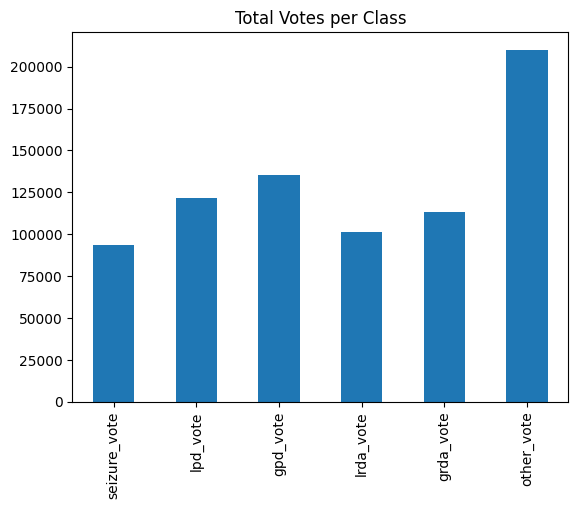

In [5]:
import matplotlib.pyplot as plt

vote_cols = [c for c in meta.columns if "_vote" in c]
meta[vote_cols].sum().plot(kind="bar", title="Total Votes per Class")
plt.show()


In [6]:
eeg_file = EEG_DIR / f"{meta.iloc[0].eeg_id}.parquet"
eeg_df = pd.read_parquet(eeg_file)

print(eeg_df.shape)
print(eeg_df.columns[:10])
eeg_df.head()


(18000, 20)
Index(['Fp1', 'F3', 'C3', 'P3', 'F7', 'T3', 'T5', 'O1', 'Fz', 'Cz'], dtype='object')


,Fp1,F3,C3,P3,F7,T3,T5,O1,Fz,Cz,Pz,Fp2,F4,C4,P4,F8,T4,T6,O2,EKG
0,-80.519997,-70.540001,-80.110001,-108.750000,-120.330002,-88.620003,-101.750000,-104.489998,-99.129997,-90.389999,-97.040001,-77.989998,-88.830002,-112.120003,-108.110001,-95.949997,-98.360001,-121.730003,-106.449997,7.920000
1,-80.449997,-70.330002,-81.760002,-107.669998,-120.769997,-90.820000,-104.260002,-99.730003,-99.070000,-92.290001,-96.019997,-84.500000,-84.989998,-115.610001,-103.860001,-97.470001,-89.290001,-115.500000,-102.059998,29.219999
2,-80.209999,-75.870003,-82.050003,-106.010002,-117.500000,-87.489998,-99.589996,-96.820000,-119.680000,-99.360001,-91.110001,-99.440002,-104.589996,-127.529999,-113.349998,-95.870003,-96.019997,-123.879997,-105.790001,45.740002
3,-84.709999,-75.339996,-87.480003,-108.970001,-121.410004,-94.750000,-105.370003,-100.279999,-113.839996,-102.059998,-95.040001,-99.230003,-101.220001,-125.769997,-111.889999,-97.459999,-97.180000,-128.940002,-109.889999,83.870003
4,-90.570000,-80.790001,-93.000000,-113.870003,-129.960007,-102.860001,-118.599998,-101.099998,-107.660004,-102.339996,-98.510002,-95.300003,-88.930000,-115.639999,-99.800003,-97.500000,-88.730003,-114.849998,-100.250000,97.769997


In [7]:
import pandas as pd
pd.options.io.parquet.engine = "fastparquet"
eeg_df = pd.read_parquet(eeg_file, engine="fastparquet")

In [8]:
import sys, numpy, pandas
print(sys.executable)
print("numpy:", numpy.__version__)
print("pandas:", pandas.__version__)

C:\Users\numpppy\anaconda3\envs\jkl\python.exe
numpy: 2.2.6
pandas: 2.2.3


In [9]:
spec_file = SPEC_DIR / f"{meta.iloc[0].spectrogram_id}.parquet"
spec_df = pd.read_parquet(spec_file)

print(spec_df.shape)
print(spec_df.columns[:10])
spec_df.head()


(320, 401)
Index(['time', 'LL_0.59', 'LL_0.78', 'LL_0.98', 'LL_1.17', 'LL_1.37',
       'LL_1.56', 'LL_1.76', 'LL_1.95', 'LL_2.15'],
      dtype='object')


,time,LL_0.59,LL_0.78,LL_0.98,LL_1.17,LL_1.37,LL_1.56,LL_1.76,LL_1.95,LL_2.15,...,RP_18.16,RP_18.36,RP_18.55,RP_18.75,RP_18.95,RP_19.14,RP_19.34,RP_19.53,RP_19.73,RP_19.92
0,1,4.26,10.98,9.05,13.65,11.49,8.930000,18.840000,19.26,19.240000,...,0.31,0.17,0.28,0.19,0.24,0.27,0.29,0.16,0.22,0.19
1,3,2.65,3.97,12.18,13.26,14.21,13.230000,9.650000,8.11,11.280000,...,0.15,0.13,0.14,0.24,0.24,0.36,0.35,0.31,0.36,0.40
2,5,4.18,4.53,8.77,14.26,13.36,16.559999,19.219999,17.51,22.650000,...,0.29,0.21,0.16,0.25,0.28,0.28,0.34,0.48,0.44,0.48
3,7,2.41,3.21,4.92,8.07,5.97,12.420000,10.820000,14.96,21.809999,...,0.33,0.51,0.49,0.64,0.58,0.42,0.32,0.31,0.32,0.33
4,9,2.29,2.44,2.77,4.62,5.39,7.080000,9.840000,12.27,14.410000,...,0.44,0.38,0.48,0.63,0.45,0.45,0.49,0.33,0.31,0.34


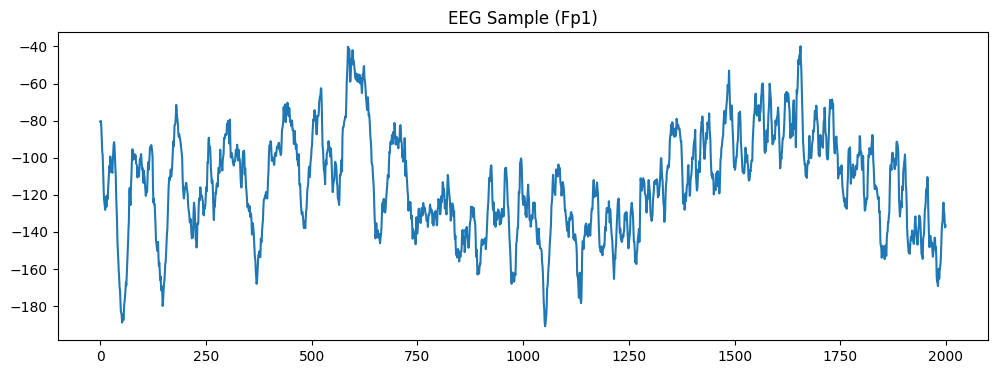

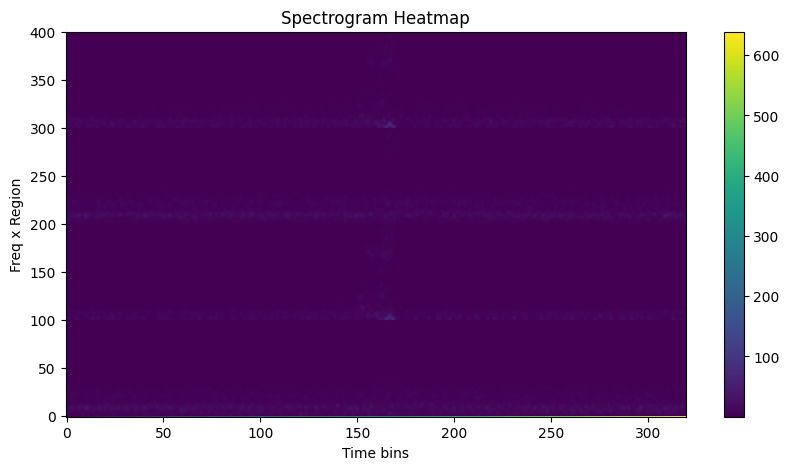

In [20]:
# Plot EEG channel Fp1
plt.figure(figsize=(12,4))
plt.plot(eeg_df["Fp1"][:2000])  # 10 detik pertama
plt.title("EEG Sample (Fp1)")
plt.show()

# Plot spectrogram heatmap
plt.figure(figsize=(10,5))
plt.imshow(spec_df.T, aspect="auto", origin="lower")
plt.title("Spectrogram Heatmap")
plt.xlabel("Time bins")
plt.ylabel("Freq x Region")
plt.colorbar()
plt.show()


In [21]:
from pathlib import Path
import pandas as pd

BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN_CSV = BASE_DIR / "train.csv"
EEG_DIR   = BASE_DIR / "train_eegs"
SPEC_DIR  = BASE_DIR / "train_spectrograms"

meta = pd.read_csv(TRAIN_CSV)
row = meta.iloc[0]  # ganti index kalau mau sampel lain

eeg_file  = EEG_DIR  / f"{row.eeg_id}.parquet"
spec_file = SPEC_DIR / f"{row.spectrogram_id}.parquet"

eeg_df  = pd.read_parquet(eeg_file, engine="pyarrow")      # atau engine="fastparquet"
spec_df = pd.read_parquet(spec_file, engine="pyarrow")
eeg_df.shape, spec_df.shape

((18000, 20), (320, 401))

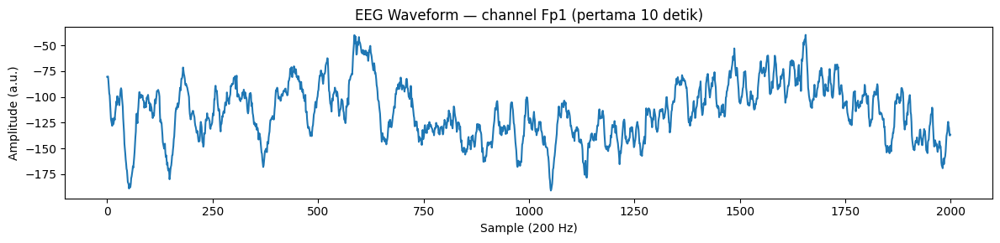

In [22]:
import matplotlib.pyplot as plt

# pilih channel non-EKG pertama
eeg_cols = [c for c in eeg_df.columns if c.upper() != "EKG"]
ch = eeg_cols[0] if eeg_cols else eeg_df.columns[0]

fs = 200  # Hz
dur_show = 10  # detik yang ditampilkan
n = fs * dur_show

plt.figure(figsize=(12,3))
plt.plot(eeg_df[ch].values[:n])
plt.title(f"EEG Waveform — channel {ch} (pertama {dur_show} detik)")
plt.xlabel("Sample (200 Hz)")
plt.ylabel("Amplitude (a.u.)")
plt.tight_layout()
plt.show()


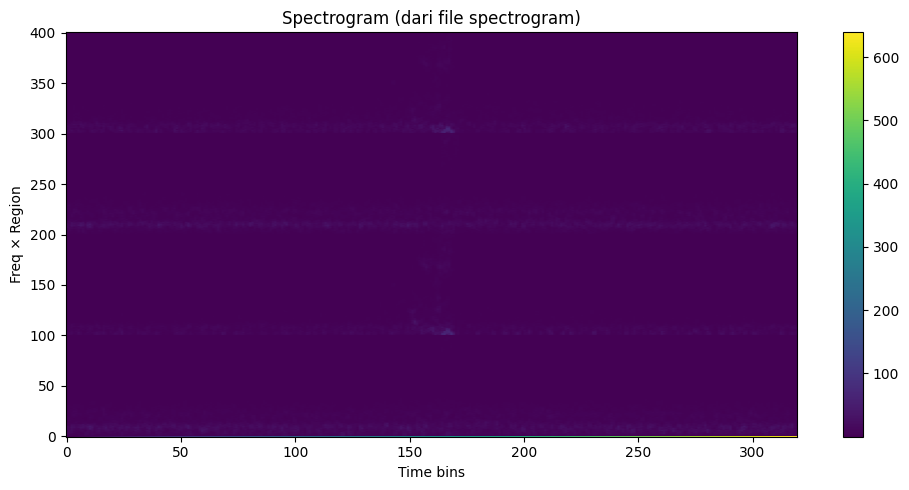

In [23]:
plt.figure(figsize=(10,5))
plt.imshow(spec_df.T, aspect="auto", origin="lower")
plt.title("Spectrogram (dari file spectrogram)")
plt.xlabel("Time bins")
plt.ylabel("Freq × Region")
plt.colorbar()
plt.tight_layout()
plt.show()


In [24]:
spec_num = spec_df.select_dtypes(include='number').to_numpy()
print('min/max:', np.nanmin(spec_num), np.nanmax(spec_num))
print('p1/50/99/99.9:', np.nanpercentile(spec_num, [1,50,99,99.9]))

min/max: 0.019999999552965164 639.0
p1/50/99/99.9: [5.99999987e-02 4.39999998e-01 1.86700001e+01 3.82362000e+02]


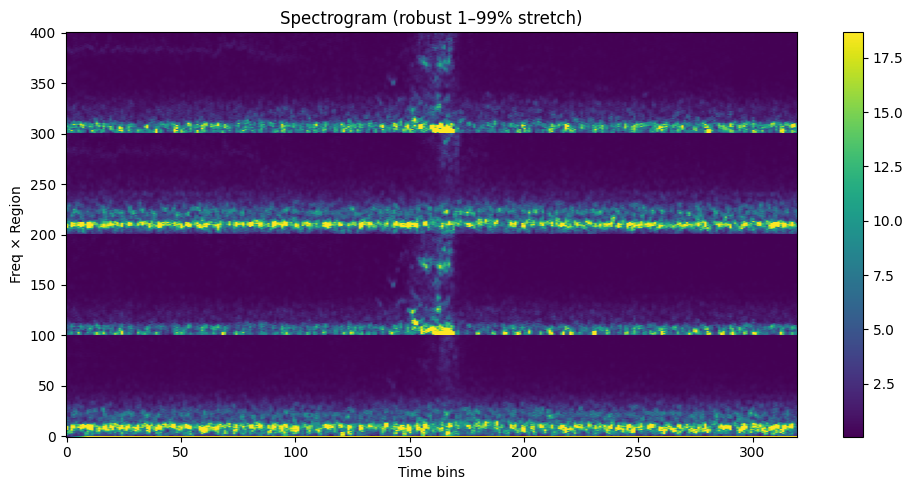

In [25]:
vmin, vmax = np.nanpercentile(spec_num, [1, 99])  # fokus ke 1%–99%
plt.figure(figsize=(10,5))
plt.imshow(spec_num.T, aspect="auto", origin="lower", vmin=vmin, vmax=vmax)
plt.title("Spectrogram (robust 1–99% stretch)")
plt.xlabel("Time bins"); plt.ylabel("Freq × Region")
plt.colorbar(); plt.tight_layout(); plt.show()

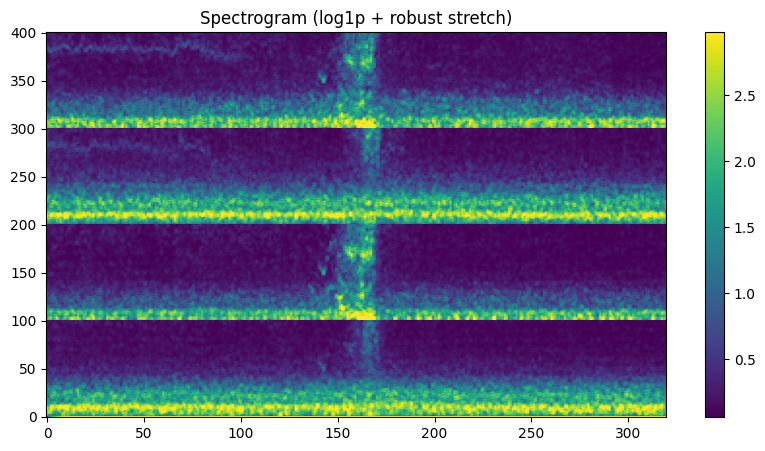

In [26]:
spec_log = np.log1p(spec_num)   # log(1+x)
vmin, vmax = np.nanpercentile(spec_log, [1, 99])
plt.figure(figsize=(10,5))
plt.imshow(spec_log.T, aspect="auto", origin="lower", vmin=vmin, vmax=vmax)
plt.title("Spectrogram (log1p + robust stretch)")
plt.colorbar(); plt.show()


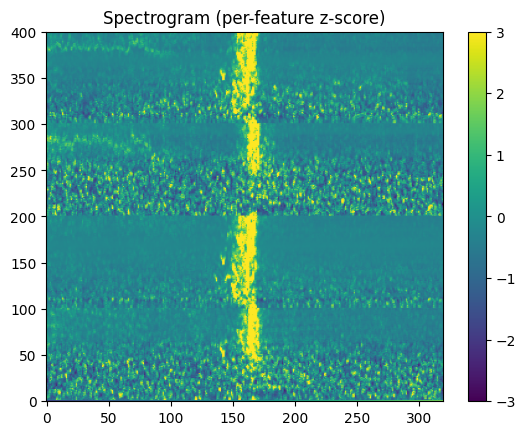

In [27]:
eps = 1e-6
row_mean = spec_num.mean(axis=0, keepdims=True)
row_std  = spec_num.std(axis=0, keepdims=True) + eps
spec_norm = (spec_num - row_mean) / row_std

plt.imshow(spec_norm.T, aspect="auto", origin="lower", vmin=-3, vmax=3)
plt.title("Spectrogram (per-feature z-score)")
plt.colorbar(); plt.show()

In [28]:
print("Total unique patients:", meta["patient_id"].nunique())

# 5 pasien dengan sampel terbanyak
meta["patient_id"].value_counts().head(5)

# Distribusi kelas per pasien (contoh 3 pasien pertama)
meta.groupby("patient_id")["expert_consensus"].value_counts().unstack(fill_value=0).head(3)

Total unique patients: 1950


expert_consensus,GPD,GRDA,LPD,LRDA,Other,Seizure
patient_id,,,,,,
56,0,0,0,0,60,0
105,0,11,5,0,38,0
149,0,9,0,0,0,0


In [29]:
# Missing values
print(meta.isna().sum())

# Cek vote total per sampel
meta["vote_total"] = meta[vote_cols].sum(axis=1)
print("Vote total min:", meta["vote_total"].min(), "max:", meta["vote_total"].max())


eeg_id                              0
eeg_sub_id                          0
eeg_label_offset_seconds            0
spectrogram_id                      0
spectrogram_sub_id                  0
spectrogram_label_offset_seconds    0
label_id                            0
patient_id                          0
expert_consensus                    0
seizure_vote                        0
lpd_vote                            0
gpd_vote                            0
lrda_vote                           0
grda_vote                           0
other_vote                          0
dtype: int64
Vote total min: 1 max: 28


In [30]:
meta.columns = meta.columns.str.strip()

# --- 2) Dapatkan kolom votes, wajib ada untuk fallback ---
vote_cols = [c for c in meta.columns if c.endswith('_vote')]
assert len(vote_cols) >= 6, f"Kolom votes tidak lengkap/ketemu. Dapat: {vote_cols}"

# --- 3) Pastikan kolom expert_consensus ada & terisi; kalau tidak, buat dari votes (argmax) ---
if ('expert_consensus' not in meta.columns) or meta['expert_consensus'].isna().all():
    meta['expert_consensus'] = (
        meta[vote_cols].idxmax(axis=1).str.replace('_vote', '', regex=False)
    )

# --- 4) Normalisasi label ke bentuk konsisten (lowercase, trim) ---
# peta nilai umum -> canonical
canon_map = {
    'seizure':'seizure',
    'Seizure':'seizure',
    'SEIZURE':'seizure',
    'lpd':'lpd', 'LPD':'lpd',
    'gpd':'gpd', 'GPD':'gpd',
    'lrda':'lrda', 'LRDA':'lrda',
    'grda':'grda', 'GRDA':'grda',
    'other':'other', 'Other':'other', 'OTHER':'other',
}

def to_label_norm(x):
    if pd.isna(x):
        return np.nan
    s = str(x).strip()
    # coba mapping langsung (title/upper)
    if s in canon_map:
        return canon_map[s]
    # fallback: lowercase umum
    return s.lower()

meta['label_norm'] = meta['expert_consensus'].map(to_label_norm)

# --- 5) Validasi hasil ---
print("Unique expert_consensus:", sorted(set(meta['expert_consensus'].dropna().astype(str))))
print("Unique label_norm:", sorted(set(meta['label_norm'].dropna().astype(str))))
print(meta['label_norm'].value_counts())


Unique expert_consensus: ['GPD', 'GRDA', 'LPD', 'LRDA', 'Other', 'Seizure']
Unique label_norm: ['gpd', 'grda', 'lpd', 'lrda', 'other', 'seizure']
label_norm
seizure    20933
grda       18861
other      18808
gpd        16702
lrda       16640
lpd        14856
Name: count, dtype: int64


In [31]:
def plot_sample_by_label(label_name):
    lbl = str(label_name).strip().lower()
    subset = meta[meta['label_norm'] == lbl]
    if subset.empty:
        print(f"Tidak ada sampel untuk label: {label_name}")
        print("Label tersedia:", meta['label_norm'].dropna().unique().tolist())
        return
    
    row = subset.sample(1, random_state=42).iloc[0]

    eeg_path  = EEG_DIR / f"{row.eeg_id}.parquet"
    spec_path = SPEC_DIR / f"{row.spectrogram_id}.parquet"

    eeg_df  = pd.read_parquet(eeg_path, engine="pyarrow")   # atau fastparquet
    spec_df = pd.read_parquet(spec_path, engine="pyarrow")

    # Waveform 10 detik
    fs = 200
    chs = [c for c in eeg_df.columns if c.upper()!='EKG']
    ch = chs[0] if chs else eeg_df.columns[0]
    n = fs*10
    plt.figure(figsize=(12,3))
    plt.plot(eeg_df[ch].values[:n])
    plt.title(f"EEG Waveform — {label_name} ({ch})")
    plt.xlabel("Sample (200 Hz)"); plt.ylabel("Amp"); plt.tight_layout(); plt.show()

    # Spectrogram (log + robust stretch)
    spec_num = spec_df.select_dtypes('number').to_numpy()
    spec_log = np.log1p(spec_num)
    vmin, vmax = np.nanpercentile(spec_log, [1,99])
    plt.figure(figsize=(10,5))
    plt.imshow(spec_log.T, aspect="auto", origin="lower", vmin=vmin, vmax=vmax)
    plt.title(f"Spectrogram — {label_name} (log1p, 1–99% stretch)")
    plt.xlabel("Time bins"); plt.ylabel("Freq×Region")
    plt.colorbar(); plt.tight_layout(); plt.show()


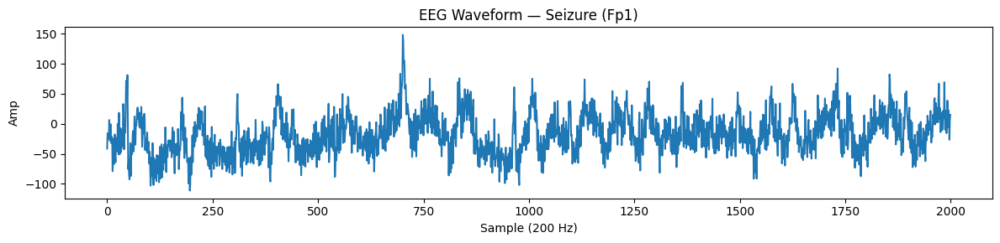

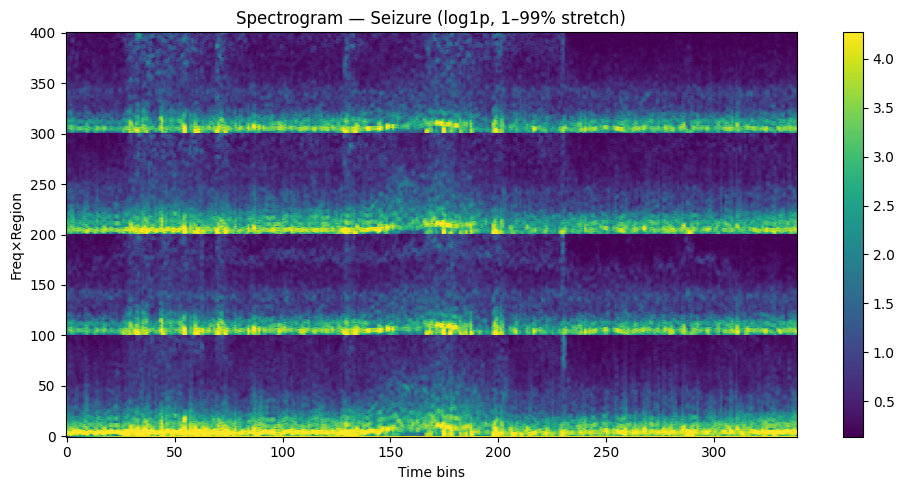

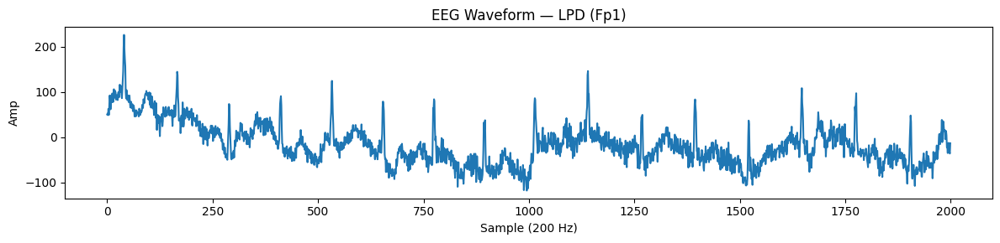

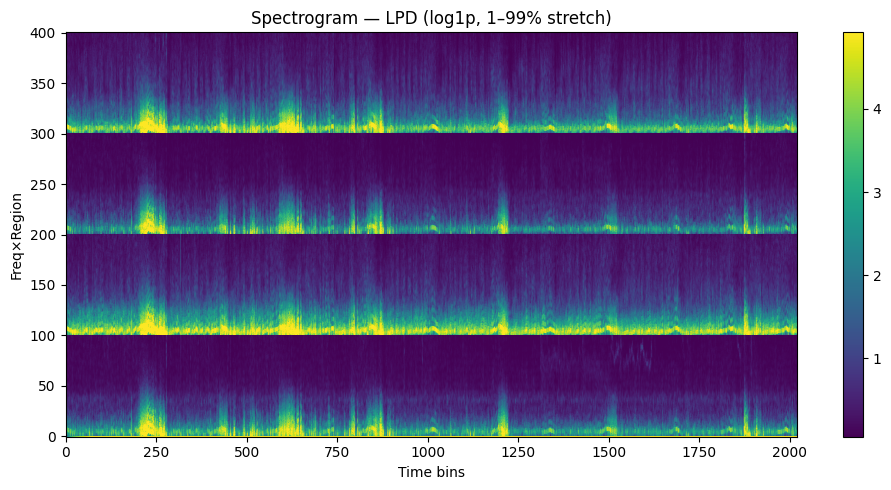

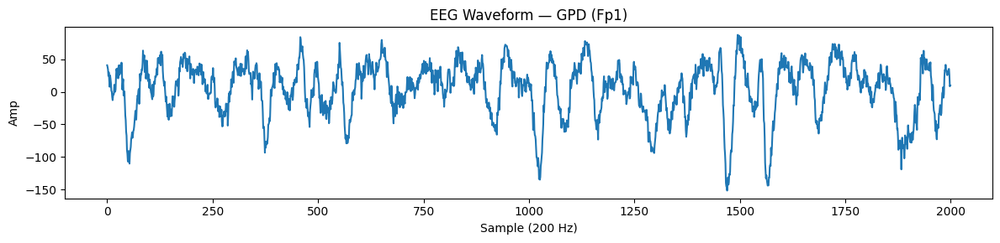

...

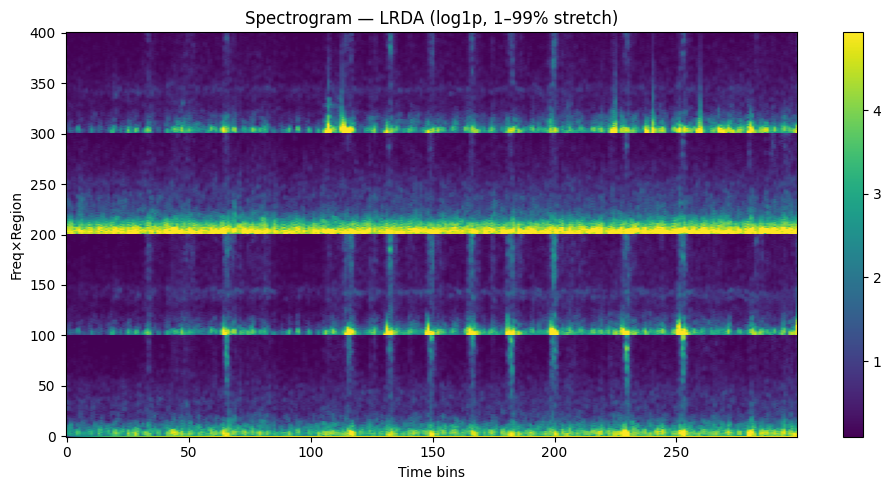

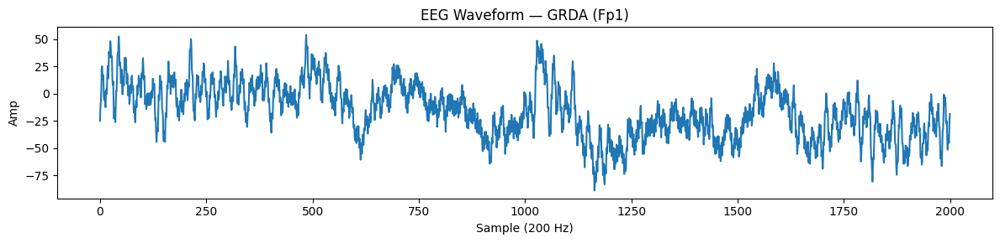

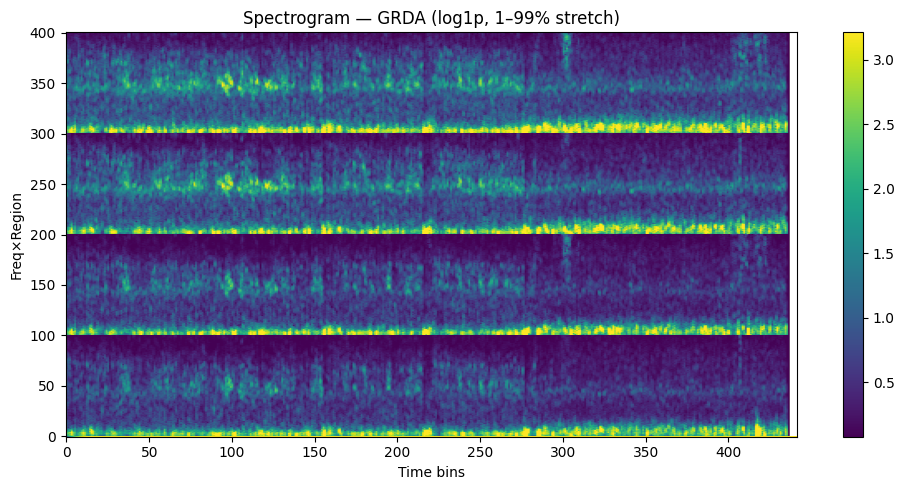

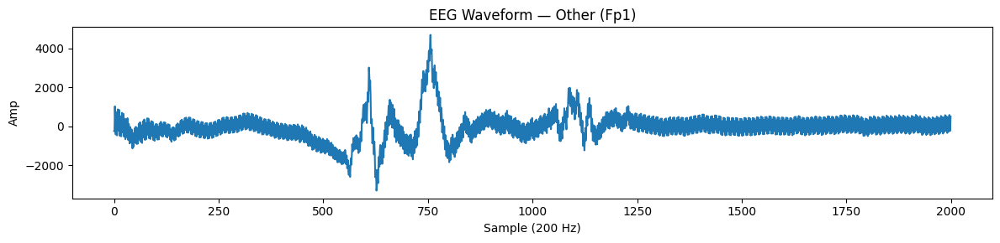

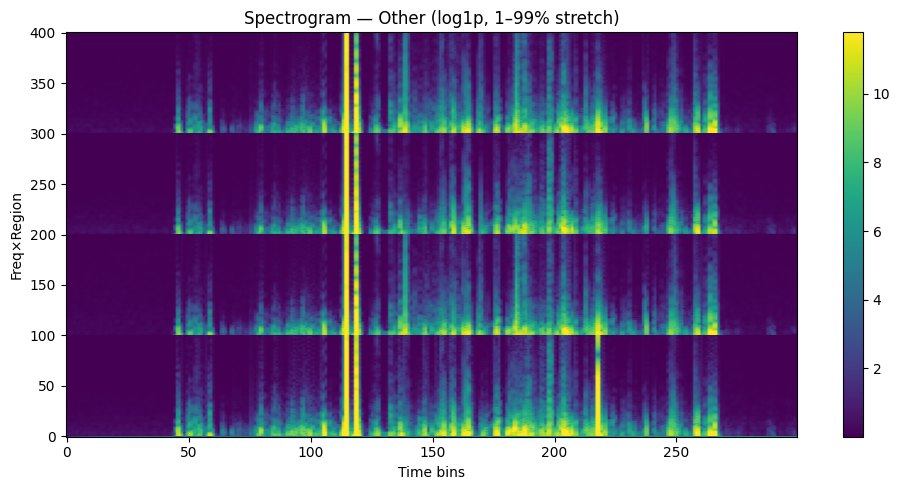

In [32]:
for lbl in ['Seizure','LPD','GPD','LRDA','GRDA','Other']:
    plot_sample_by_label(lbl)

In [33]:
vote_cols = [c for c in meta.columns if c.endswith("_vote")]
available_labels = (
    meta["expert_consensus"].dropna().value_counts().index.tolist()
    if "expert_consensus" in meta.columns
    else []
)
print("Labels (expert_consensus) yang ada:", available_labels)

Labels (expert_consensus) yang ada: ['Seizure', 'GRDA', 'Other', 'GPD', 'LRDA', 'LPD']


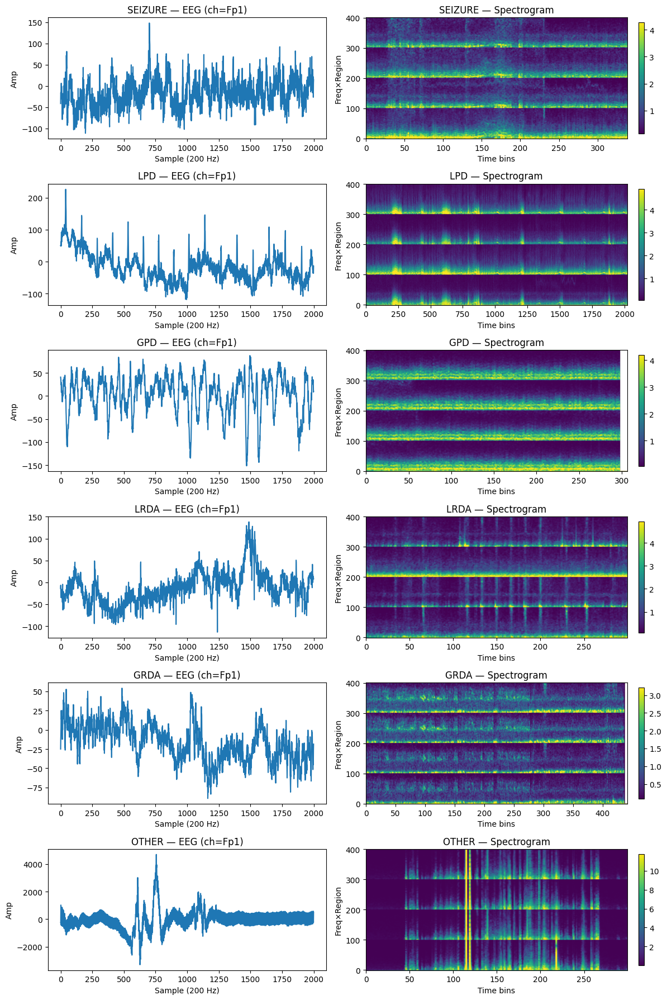

In [34]:
def plot_eeg_spec_grid(meta, labels, n_per_label=1, fs=200):
    fig, axes = plt.subplots(len(labels), 2, figsize=(12, 3*len(labels)))
    
    for i, lbl in enumerate(labels):
        # ambil 1 sampel random per label
        subset = meta[meta['label_norm'] == lbl]
        if subset.empty: 
            continue
        row = subset.sample(n_per_label, random_state=42).iloc[0]

        eeg_file  = EEG_DIR / f"{row.eeg_id}.parquet"
        spec_file = SPEC_DIR / f"{row.spectrogram_id}.parquet"

        eeg_df  = pd.read_parquet(eeg_file, engine="pyarrow")
        spec_df = pd.read_parquet(spec_file, engine="pyarrow")

        # --- EEG waveform (10 detik, channel pertama non-EKG) ---
        chs = [c for c in eeg_df.columns if c.upper() != "EKG"]
        ch = chs[0] if chs else eeg_df.columns[0]
        n  = fs*10
        axes[i,0].plot(eeg_df[ch].values[:n])
        axes[i,0].set_title(f"{lbl.upper()} — EEG (ch={ch})")
        axes[i,0].set_xlabel("Sample (200 Hz)")
        axes[i,0].set_ylabel("Amp")

        # --- Spectrogram (log1p + robust scaling) ---
        spec_num = spec_df.select_dtypes('number').to_numpy()
        spec_log = np.log1p(np.maximum(spec_num,0))
        vmin, vmax = np.nanpercentile(spec_log, [1, 99])
        im = axes[i,1].imshow(spec_log.T, aspect="auto", origin="lower",
                              vmin=vmin, vmax=vmax)
        axes[i,1].set_title(f"{lbl.upper()} — Spectrogram")
        axes[i,1].set_xlabel("Time bins"); axes[i,1].set_ylabel("Freq×Region")
        fig.colorbar(im, ax=axes[i,1], fraction=0.02, pad=0.04)

    plt.tight_layout()
    plt.show()

# Panggil untuk 6 kelas
plot_eeg_spec_grid(meta, ["seizure","lpd","gpd","lrda","grda","other"])

In [38]:
pip install scipy

   ---------------------------------------- 0.0/41.3 MB ? eta -:--:--
   - -------------------------------------- 1.6/41.3 MB 10.5 MB/s eta 0:00:04
   --- ------------------------------------ 3.4/41.3 MB 9.1 MB/s eta 0:00:05
   ----- ---------------------------------- 5.2/41.3 MB 8.8 MB/s eta 0:00:05
   ------- -------------------------------- 7.3/41.3 MB 8.9 MB/s eta 0:00:04
   -------- ------------------------------- 9.2/41.3 MB 8.9 MB/s eta 0:00:04
   ---------- ----------------------------- 11.0/41.3 MB 8.9 MB/s eta 0:00:04
   ------------ --------------------------- 13.1/41.3 MB 8.9 MB/s eta 0:00:04
   -------------- ------------------------- 15.2/41.3 MB 9.0 MB/s eta 0:00:03
   ---------------- ----------------------- 17.3/41.3 MB 9.1 MB/s eta 0:00:03
   ------------------ --------------------- 19.1/41.3 MB 9.1 MB/s eta 0:00:03
   -------------------- ------------------- 21.2/41.3 MB 9.2 MB/s eta 0:00:03
   ---------------------- ----------------- 23.6/41.3 MB 9.3 MB/s eta 0:00:0

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scikit-image 0.25.2 requires pillow>=10.1, but you have pillow 9.4.0 which is incompatible.


In [39]:
from scipy.signal import butter, filtfilt

def bandpass_filter(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5 * fs
    low_norm, high_norm = low / nyq, high / nyq
    b, a = butter(order, [low_norm, high_norm], btype='band')
    # zero-phase filtering
    sig_filt = filtfilt(b, a, sig)
    # clipping (simulasi paper → “ensure consistency across electrodes”)
    sig_clip = np.clip(sig_filt, -clip_val, clip_val)
    return sig_clip


In [36]:
def preprocess_eeg_df(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper() == "EKG":  # skip EKG
            continue
        out[ch] = bandpass_filter(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)


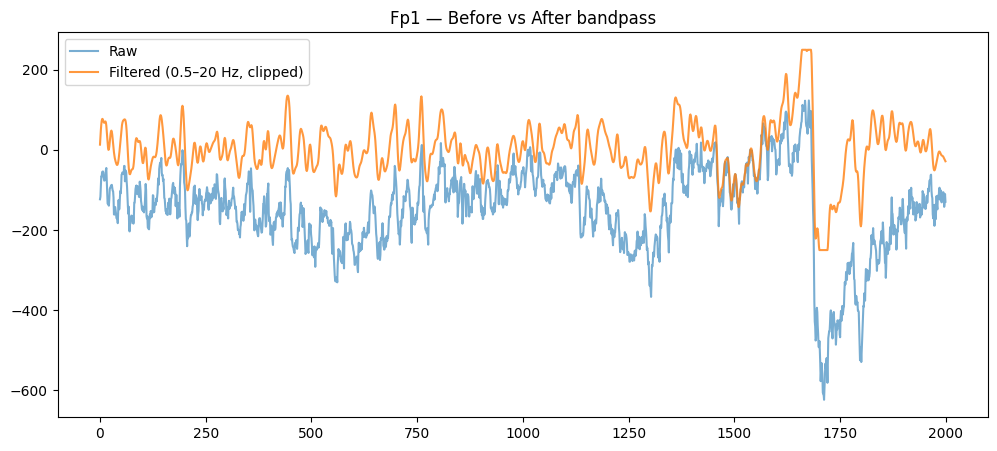

In [53]:
row = meta.sample(1, random_state=0).iloc[0]
eeg_file = EEG_DIR / f"{row.eeg_id}.parquet"
eeg_df = pd.read_parquet(eeg_file, engine="pyarrow")

ch = [c for c in eeg_df.columns if c.upper() != "EKG"][0]
sig_raw = eeg_df[ch].values[:2000]  # ambil 10 detik (fs=200 Hz)
sig_filt = bandpass_filter(sig_raw, fs=200)

plt.figure(figsize=(12,5))
plt.plot(sig_raw, label="Raw", alpha=0.6)
plt.plot(sig_filt, label="Filtered (0.5–20 Hz, clipped)", alpha=0.8)
plt.legend(); plt.title(f"{ch} — Before vs After bandpass")
plt.show()

In [54]:
CHAIN_DEF = {
    "LL": [("Fp1","F7"), ("F7","T3"), ("T3","T5"), ("T5","O1")],              # Left Temporal
    "LP": [("Fp1","F3"), ("F3","C3"), ("C3","P3"), ("P3","O1")],              # Left Parasagittal
    "RL": [("Fp2","F8"), ("F8","T4"), ("T4","T6"), ("T6","O2")],              # Right Temporal
    "RP": [("Fp2","F4"), ("F4","C4"), ("C4","P4"), ("P4","O2")],              # Right Parasagittal
}

def make_diff(df, a, b):
    # kembalikan None kalau salah satu channel ga ada
    if a not in df.columns or b not in df.columns: 
        return None
    return (df[a].to_numpy() - df[b].to_numpy()).astype("float32")

def double_banana_montage(eeg_df: pd.DataFrame) -> dict:
    out = {}
    for name, pairs in CHAIN_DEF.items():
        segs = []
        for a,b in pairs:
            d = make_diff(eeg_df, a, b)
            if d is not None:
                segs.append(d)
        if len(segs) == 0:
            continue  
        out[name] = np.mean(segs, axis=0)  
    return out

meta_use rows: 17089
       eeg_id  patient_id  spectrogram_id
0  1628180742       42516          353733
1  2277392603       30539          924234
2   722738444       56885          999431
3   387987538        4264         1084844
4  2175806584       23435         1219001


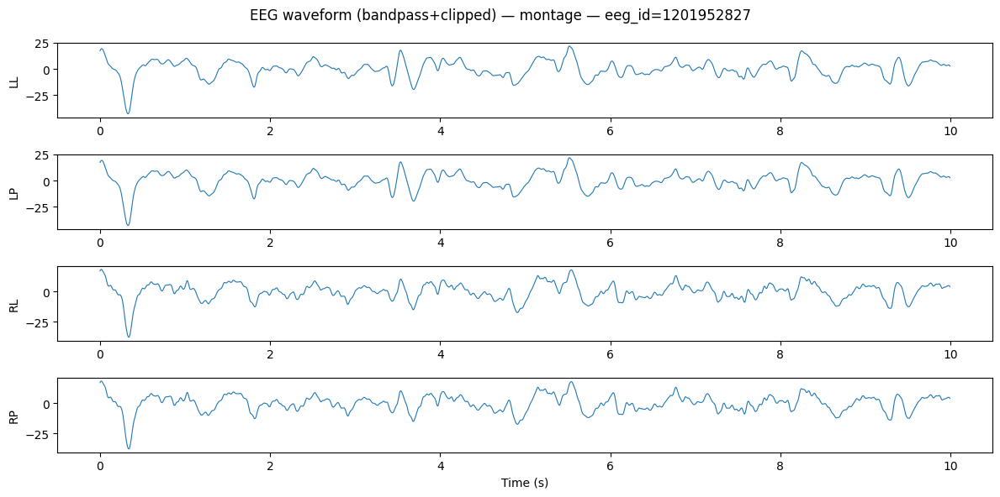

In [40]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from scipy.signal import butter, filtfilt

# --- path setup ---
BASE_DIR   = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR    = BASE_DIR / "train_eegs"
DATA_PKG   = Path("data_package")
META_CSV   = DATA_PKG / "meta_use.csv"

# --- load manifest (meta_use) ---
meta_use = pd.read_csv(META_CSV)
print("meta_use rows:", len(meta_use))
print(meta_use.head())

# --- filter & montage helpers ---
def bandpass_filter(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5 * fs
    b, a = butter(order, [low/nyq, high/nyq], btype='band')
    y = filtfilt(b, a, sig).astype("float32")
    return np.clip(y, -clip_val, clip_val)

def preprocess_eeg_df(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper() == "EKG": 
            continue
        out[ch] = bandpass_filter(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

CHAIN_DEF = {
    "LL": [("Fp1","F7"), ("F7","T3"), ("T3","T5"), ("T5","O1")],
    "LP": [("Fp1","F3"), ("F3","C3"), ("C3","P3"), ("P3","O1")],
    "RL": [("Fp2","F8"), ("F8","T4"), ("T4","T6"), ("T6","O2")],
    "RP": [("Fp2","F4"), ("F4","C4"), ("C4","P4"), ("P4","O2")],
}

def make_diff(df, a, b):
    if a not in df.columns or b not in df.columns:
        return None
    return (df[a].to_numpy() - df[b].to_numpy()).astype("float32")

def double_banana_montage(eeg_df: pd.DataFrame) -> dict:
    out = {}
    for name, pairs in CHAIN_DEF.items():
        segs = []
        for a, b in pairs:
            d = make_diff(eeg_df, a, b)
            if d is not None:
                segs.append(d)
        if segs:
            out[name] = np.mean(segs, axis=0)
    return out

# --- visualize 10s center window ---
fs = 200
row = meta_use.sample(1, random_state=0).iloc[0]
eeg_id = int(row.eeg_id)

df_raw  = pd.read_parquet(EEG_DIR / f"{eeg_id}.parquet", engine="pyarrow")
df_filt = preprocess_eeg_df(df_raw, fs=fs)

mont = double_banana_montage(df_filt)  # dict: {'LL':1D, 'LP':1D, ...}

win = fs*10
n = len(next(iter(mont.values())))
s = max(0, (n - win)//2)
t = np.arange(win) / fs

chains = ["LL","LP","RL","RP"]
plt.figure(figsize=(12,6))
for i,ch in enumerate(chains, 1):
    sig = mont.get(ch, np.zeros(n, dtype="float32"))[s:s+win]
    plt.subplot(4,1,i)
    plt.plot(t, sig, lw=0.8)
    plt.ylabel(ch)
plt.xlabel("Time (s)")
plt.suptitle(f"EEG waveform (bandpass+clipped) — montage — eeg_id={eeg_id}")
plt.tight_layout()
plt.show()

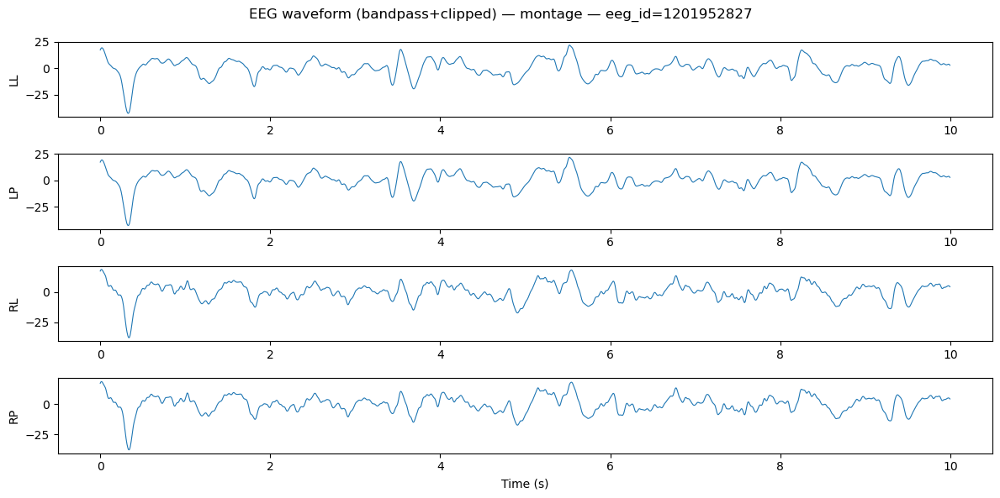

In [2]:
from scipy.signal import butter, filtfilt

# --- filter & montage helpers (pakai punyamu) ---
def bandpass_filter(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5*fs
    b,a = butter(order, [low/nyq, high/nyq], btype='band')
    y = filtfilt(b, a, sig).astype("float32")
    return np.clip(y, -clip_val, clip_val)

def preprocess_eeg_df(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper()=="EKG": continue
        out[ch] = bandpass_filter(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

CHAIN_DEF = {
    "LL":[("Fp1","F7"),("F7","T3"),("T3","T5"),("T5","O1")],
    "LP":[("Fp1","F3"),("F3","C3"),("C3","P3"),("P3","O1")],
    "RL":[("Fp2","F8"),("F8","T4"),("T4","T6"),("T6","O2")],
    "RP":[("Fp2","F4"),("F4","C4"),("C4","P4"),("P4","O2")],
}

def make_diff(df, a, b):
    if a not in df.columns or b not in df.columns: 
        return None
    return (df[a].to_numpy() - df[b].to_numpy()).astype("float32")

def double_banana_montage(eeg_df: pd.DataFrame) -> dict:
    out = {}
    for name, pairs in CHAIN_DEF.items():
        segs=[]
        for a,b in pairs:
            d = make_diff(eeg_df, a, b)
            if d is not None: segs.append(d)
        if segs:
            out[name] = np.mean(segs, axis=0)  # rata antar segmen
    return out

# --- visualize 10s center window ---
fs = 200
row = meta_use.sample(1, random_state=0).iloc[0]  # ambil satu contoh
eeg_id = int(row.eeg_id)
df_raw = pd.read_parquet(EEG_DIR / f"{eeg_id}.parquet", engine="pyarrow")
df_filt = preprocess_eeg_df(df_raw, fs=fs)

mont = double_banana_montage(df_filt)  # dict: {'LL':1D, 'LP':1D, ...}

win = fs*10  # 10 detik
n = len(next(iter(mont.values())))
s = max(0, (n - win)//2)  # center window
t = np.arange(win)/fs

chains = ["LL","LP","RL","RP"]
plt.figure(figsize=(12,6))
for i,ch in enumerate(chains, 1):
    sig = mont.get(ch, np.zeros(n, dtype="float32"))[s:s+win]
    plt.subplot(4,1,i)
    plt.plot(t, sig, lw=0.8)
    plt.ylabel(ch)
plt.xlabel("Time (s)")
plt.suptitle(f"EEG waveform (bandpass+clipped) — montage — eeg_id={eeg_id}")
plt.tight_layout()
plt.show()

In [58]:
'meta_use' in globals(), 'meta_use' in locals()

(False, False)

In [3]:
eid = int(meta_use.eeg_id.iloc[0])  # contoh
z = np.load(SPEC_HR_OUT / f"{eid}_hr.npz")
x, freqs = z["x"], z["freqs"]  # x: [4,F,T]
fs, stride = 200, 16
t = np.arange(x.shape[2]) * (stride/fs)
chains = ["LL","LP","RL","RP"]

fig,axes = plt.subplots(1,4,figsize=(16,4), constrained_layout=True)
for i,ch in enumerate(chains):
    im = axes[i].imshow(x[i], aspect="auto", origin="lower",
                        extent=[t[0], t[-1], float(freqs[0]), float(freqs[-1])])
    axes[i].set_title(ch); axes[i].set_xlabel("s"); axes[i].set_ylabel("Hz")
    fig.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
plt.suptitle(f"Spec-HR preview — eeg_id={eid}")
plt.show()

NameError: name 'SPEC_HR_OUT' is not defined

In [97]:
def save_wave_hr_npz(eeg_id, patient_id, mont_dict, fs=200, win_s=10, mode="center", outdir="wave_hr_out"):
    outdir = Path(outdir); outdir.mkdir(parents=True, exist_ok=True)
    need = fs*win_s
    X = []
    for ch in ["LL","LP","RL","RP"]:
        x = mont_dict.get(ch, None)
        if x is None or len(x) == 0:
            X.append(np.zeros(need, dtype="float32"))
            continue
        if len(x) < need:  
            pad = np.pad(x, (0, need-len(x)), mode="edge")
            X.append(pad.astype("float32"))
        else:             
            s = (len(x)-need)//2 if mode=="center" else np.random.randint(0, len(x)-need+1)
            X.append(x[s:s+need].astype("float32"))
    X = np.stack(X, axis=0)  # [4, T]

    np.savez(outdir/f"{int(eeg_id)}_hr.npz",
             x=X.astype("float32"),
             fs=np.int32(fs),
             eeg_id=np.int64(eeg_id),
             patient_id=np.int64(patient_id))
    print(f"saved waveform HR → {outdir}/{eeg_id}_hr.npz")

In [98]:
row = meta_use.sample(1, random_state=0).iloc[0]

df = pd.read_parquet(EEG_DIR/f"{row.eeg_id}.parquet", engine="pyarrow")
df_filt = preprocess_eeg_df(df, fs=200)
mont_dict = double_banana_montage(df_filt)

save_wave_hr_npz(row.eeg_id, row.patient_id, mont_dict, fs=200, win_s=10, mode="center")

saved waveform HR → wave_hr_out/3340435209_hr.npz


In [26]:
pip install PyWavelets

In [27]:
import pywt
import numpy as np

def cwt_spectrogram(sig, fs=200, fmin=0.5, fmax=40.0, n_freqs=40, stride=16, wavelet='morl'):
    sig = np.asarray(sig, dtype="float32")
    freqs = np.geomspace(fmin, fmax, num=n_freqs)
    fc = pywt.central_frequency(wavelet)  # ~0.8125 utk morl
    scales = (fc * fs) / freqs
    coeffs, _ = pywt.cwt(sig, scales, wavelet, sampling_period=1/fs)
    power = (np.abs(coeffs) ** 2).astype("float32")   # energy

    if stride and stride > 1:
        power = power[:, ::stride]
    return power, freqs  # shape = (n_freqs, T')


In [28]:
def make_spec_hr(montage_dict, fs=200, fmin=0.5, fmax=40, n_freqs=40, stride=16):
    specs = {}
    for k, sig in montage_dict.items():
        S, freqs = cwt_spectrogram(sig, fs, fmin, fmax, n_freqs, stride)
        specs[k] = S  # (freq × time)
    return specs, freqs

def make_spec_lr(montage_dict, fs=200, fmin=0.5, fmax=40, n_freqs=40, stride=64):
    return make_spec_hr(montage_dict, fs, fmin, fmax, n_freqs, stride)


In [29]:
def robust_log_scale(spec, pct=(1,99)):
    x = np.log1p(np.maximum(spec, 0))
    vmin, vmax = np.nanpercentile(x, pct)
    return x, vmin, vmax

def preview_specs(specs_dict, freqs, title="CWT Spec-HR (Double Banana)"):
    chains = list(specs_dict.keys())
    n = len(chains)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 4), constrained_layout=True)
    if n == 1: axes = [axes]
    for ax, ch in zip(axes, chains):
        x, vmin, vmax = robust_log_scale(specs_dict[ch])
        im = ax.imshow(x, aspect="auto", origin="lower", vmin=vmin, vmax=vmax)
        ax.set_title(ch); ax.set_xlabel("time bins"); ax.set_ylabel("freq (low→high)")
        fig.colorbar(im, ax=ax, fraction=0.045, pad=0.02)
    fig.suptitle(title, y=1.02, fontsize=12)
    plt.show()


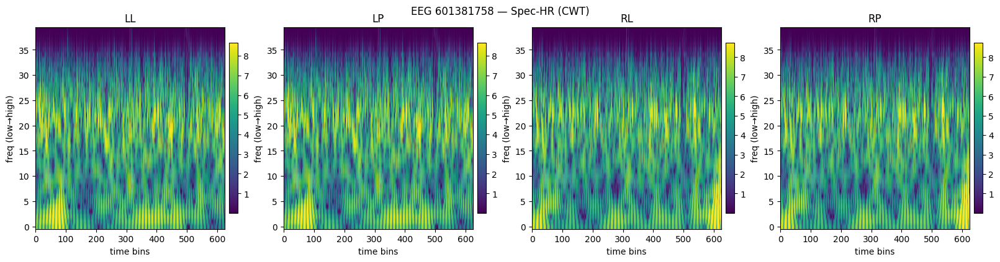

In [30]:
eeg_df = pd.read_parquet(EEG_DIR / f"{row.eeg_id}.parquet", engine="pyarrow")
eeg_df = eeg_df[[c for c in eeg_df.columns if c.upper() != "EKG"]].copy()
for c in eeg_df.columns:  # bandpass + clipping per channel
    eeg_df[c] = bandpass_filter(eeg_df[c].to_numpy(), fs=200)

mont = double_banana_montage(eeg_df)
win = 50*200
mont50 = {k: v[:win] for k,v in mont.items()}

specs_hr, freqs = make_spec_hr(mont50, fs=200, fmin=0.5, fmax=40, n_freqs=40, stride=16)

preview_specs(specs_hr, freqs, title=f"EEG {row.eeg_id} — Spec-HR (CWT)")


In [31]:
def spec_normalize(x, pct=(1,99)):
    x = np.log1p(np.maximum(x, 0)).astype("float32")
    vmin, vmax = np.nanpercentile(x, pct)
    x = (x - vmin) / (vmax - vmin + 1e-8)
    return np.clip(x, 0.0, 1.0)

def pack_spec(specs_dict, order=("LL","LP","RL","RP")):
    # stack ke [C=4, F, T]; kalau chain hilang → isi 0
    arrs = []
    F = next(iter(specs_dict.values())).shape[0]
    T = max(v.shape[1] for v in specs_dict.values())
    for k in order:
        if k in specs_dict:
            v = specs_dict[k]
            pad = T - v.shape[1]
            if pad>0:  # pad kanan biar semua sama panjang
                v = np.pad(v, ((0,0),(0,pad)), mode='edge')
            arrs.append(v)
        else:
            arrs.append(np.zeros((F,T), dtype="float32"))
    return np.stack(arrs, axis=0)  # [4,F,T]

def save_spec_npz(out_dir, eeg_id, specs_dict, freqs, meta_row, kind="hr"):
    out_dir = Path(out_dir); out_dir.mkdir(parents=True, exist_ok=True)
    # normalize per chain
    specs_norm = {k: spec_normalize(v) for k,v in specs_dict.items()}
    x = pack_spec(specs_norm)  # [4,F,T]
    np.savez_compressed(out_dir/f"{eeg_id}_{kind}.npz",
                        x=x.astype("float32"),
                        freqs=freqs.astype("float32"),
                        eeg_id=str(eeg_id),
                        patient_id=int(meta_row.patient_id))

In [4]:
from pathlib import Path

# bikin folder output
SPEC_HR_OUT = Path("./spec_hr_out")   # ganti path sesuai project kamu
SPEC_HR_OUT.mkdir(parents=True, exist_ok=True)

# sekarang bisa dipakai
save_spec_npz(SPEC_HR_OUT, row.eeg_id, specs_hr, freqs, row, kind="hr")


NameError: name 'save_spec_npz' is not defined

In [33]:
save_spec_npz(SPEC_HR_OUT, row.eeg_id, specs_hr, freqs, row, kind="hr")
# (opsional) untuk LR:
# save_spec_npz(SPEC_LR_OUT, row.eeg_id, specs_lr, freqs, row, kind="lr")

In [36]:
path = SPEC_HR_OUT / f"{row.eeg_id}_hr.npz"
z = np.load(path)

print("Keys:", list(z.keys()))
print("Shape x:", z["x"].shape)     # [4, F, T]
print("Freqs:", z["freqs"].shape)   # array frekuensi
print("EEG id:", z["eeg_id"], "Patient:", z["patient_id"])

Keys: ['x', 'freqs', 'eeg_id', 'patient_id']
Shape x: (4, 40, 625)
Freqs: (40,)
EEG id: 601381758 Patient: 9064


In [37]:
x = z["x"]
float(x.min()), float(x.max())

(0.0, 1.0)

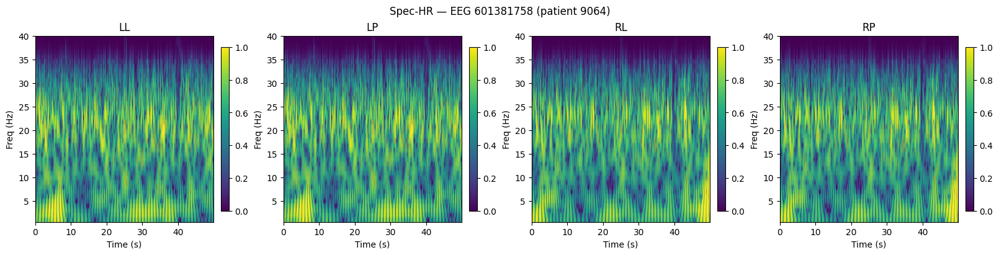

In [38]:
x = z["x"]            # [C,F,T]
freqs = z["freqs"]    # Hz
chains = ["LL","LP","RL","RP"]
fs, stride = 200, 16
t = np.arange(x.shape[2]) * (stride / fs)  # detik

fig, axes = plt.subplots(1, 4, figsize=(16,4), constrained_layout=True)
for i in range(4):
    im = axes[i].imshow(x[i], aspect="auto", origin="lower",
                        extent=[t[0], t[-1], freqs[0], freqs[-1]])
    axes[i].set_title(chains[i])
    axes[i].set_xlabel("Time (s)")
    axes[i].set_ylabel("Freq (Hz)")
    fig.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
plt.suptitle(f"Spec-HR — EEG {z['eeg_id']} (patient {z['patient_id']})")
plt.show()


In [39]:
def robust_log(x):      # “pra-normalisasi” utk adil dibandingkan
    return np.log1p(np.maximum(x,0)).astype("float32")

def normalize(x, pct=(1,99)):
    x = robust_log(x)
    vmin, vmax = np.nanpercentile(x, pct)
    return (x - vmin) / (vmax - vmin + 1e-8)

def compare_spec(raw_spec, norm_spec, freqs, fs=200, stride=16, title=''):
    t = np.arange(raw_spec.shape[1]) * (stride/fs)

    # supaya fair, pakai vmin/vmax yang sama untuk “raw-log” & “normalized”
    raw_log = robust_log(raw_spec)
    vmin, vmax = np.nanpercentile(raw_log, (1,99))
    raw_view = np.clip((raw_log - vmin)/(vmax-vmin+1e-8), 0, 1)

    fig, ax = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)
    im0 = ax[0].imshow(raw_view, aspect='auto', origin='lower',
                       extent=[t[0],t[-1],freqs[0],freqs[-1]])
    ax[0].set_title('Before: raw → log1p (no scaling)'); ax[0].set_xlabel('Time (s)'); ax[0].set_ylabel('Freq (Hz)')
    fig.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

    im1 = ax[1].imshow(norm_spec, aspect='auto', origin='lower',
                       extent=[t[0],t[-1],freqs[0],freqs[-1]])
    ax[1].set_title('After: normalized (0–1)'); ax[1].set_xlabel('Time (s)'); ax[1].set_ylabel('Freq (Hz)')
    fig.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

    fig.suptitle(title)
    plt.show()


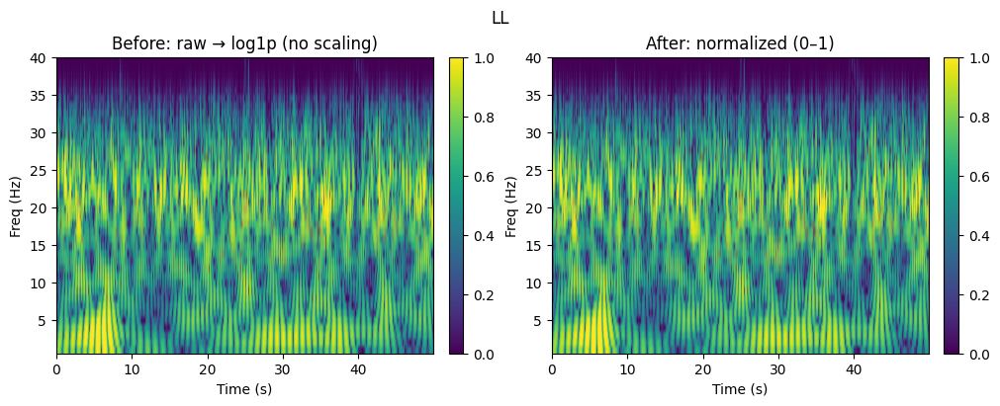

In [40]:
# raw_spec = hasil CWT sebelum normalisasi
raw_spec = specs_hr['LL']                      # (F,T)
# norm_spec = yang sudah kamu simpan di .npz
norm_spec = z['x'][0]                          # (F,T) — urutan [LL,LP,RL,RP]
compare_spec(raw_spec, norm_spec, z['freqs'], title='LL')

RAW (log1p)  : min=0.000 max=10.164 mean=4.127 std=2.482
NORMALIZED    : min=0.000 max=1.000 mean=0.477 std=0.286


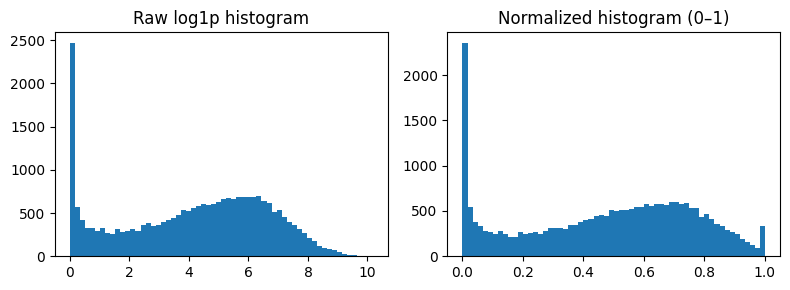

In [41]:
def stats_report(raw_spec, norm_spec):
    raw_log = robust_log(raw_spec)
    print("RAW (log1p)  : min={:.3f} max={:.3f} mean={:.3f} std={:.3f}".format(
        raw_log.min(), raw_log.max(), raw_log.mean(), raw_log.std()))
    print("NORMALIZED    : min={:.3f} max={:.3f} mean={:.3f} std={:.3f}".format(
        norm_spec.min(), norm_spec.max(), norm_spec.mean(), norm_spec.std()))

    plt.figure(figsize=(8,3))
    plt.subplot(1,2,1); plt.hist(raw_log.ravel(), bins=60); plt.title('Raw log1p histogram')
    plt.subplot(1,2,2); plt.hist(norm_spec.ravel(), bins=60); plt.title('Normalized histogram (0–1)')
    plt.tight_layout(); plt.show()

stats_report(raw_spec, norm_spec)

In [42]:
def robust_log(x):  # pra-normalisasi (log1p)
    return np.log1p(np.maximum(x,0)).astype("float32")

def compare_specs_all_chains(raw_specs_dict, z, fs=200, stride=16, title=""):
    """
    raw_specs_dict: dict {'LL':(F,T), ...} SEBELUM normalisasi
    z: np.load('..._hr.npz') SESUDAH normalisasi (keys: x,freqs,eeg_id,patient_id)
    """
    chains = ["LL","LP","RL","RP"]
    freqs = z["freqs"]; x_norm = z["x"]  # [4,F,T]
    t = np.arange(x_norm.shape[2]) * (stride/fs)

    fig, axes = plt.subplots(2, 4, figsize=(16,6), constrained_layout=True)
    for i, ch in enumerate(chains):
        # BEFORE (raw → log1p, pakai skala shared biar adil)
        raw = robust_log(raw_specs_dict[ch])
        vmin, vmax = np.nanpercentile(raw, (1,99))
        raw_v = np.clip((raw - vmin)/(vmax-vmin+1e-8), 0, 1)
        im0 = axes[0,i].imshow(raw_v, aspect="auto", origin="lower",
                               extent=[t[0],t[-1],freqs[0],freqs[-1]])
        axes[0,i].set_title(f"{ch} — BEFORE")
        axes[0,i].set_xlabel("Time (s)"); axes[0,i].set_ylabel("Freq (Hz)")
        fig.colorbar(im0, ax=axes[0,i], fraction=0.046, pad=0.04)

        # AFTER (normalized 0–1 dari .npz)
        im1 = axes[1,i].imshow(x_norm[i], aspect="auto", origin="lower",
                               extent=[t[0],t[-1],freqs[0],freqs[-1]])
        axes[1,i].set_title(f"{ch} — AFTER")
        axes[1,i].set_xlabel("Time (s)"); axes[1,i].set_ylabel("Freq (Hz)")
        fig.colorbar(im1, ax=axes[1,i], fraction=0.046, pad=0.04)

    if not title:
        title = f"Spec-HR Before vs After — EEG {z['eeg_id']} (patient {z['patient_id']})"
    fig.suptitle(title)
    plt.show()

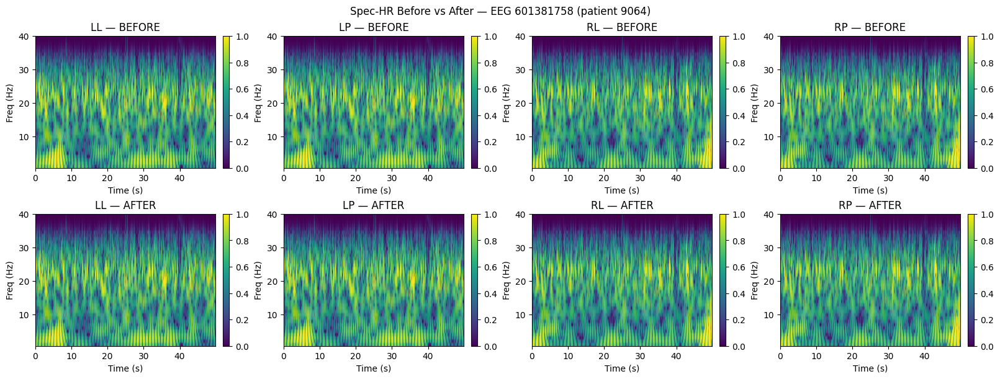

In [43]:
# raw_specs_dict = hasil CWT SEBELUM normalisasi, mis. specs_hr dari langkah kamu
# z = np.load(SPEC_HR_OUT / f"{row.eeg_id}_hr.npz")  # SESUDAH normalisasi
compare_specs_all_chains(specs_hr, z)

In [44]:
# seberapa besar normalisasi menyamakan skala antar-sampel?
import numpy as np, glob

files = glob.glob(str(SPEC_HR_OUT/'*_hr.npz'))[:200]  # sampling 200 file
means, stds = [], []
for p in files:
    z = np.load(p)
    x = z['x']  # [4,F,T] sudah 0..1
    means.append(x.mean()); stds.append(x.std())

print("AFTER norm — mean across samples: mean=%.3f std=%.3f" % (np.mean(means), np.std(means)))
print("AFTER norm — std across samples : mean=%.3f std=%.3f" % (np.mean(stds), np.std(stds)))


AFTER norm — mean across samples: mean=nan std=nan
AFTER norm — std across samples : mean=nan std=nan


In [69]:
CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]

def build_labels_from_votes(meta, classes=CLASSES, hc_thresh=10):
    m = meta.copy()
    # ambil kolom votes
    vote_cols = [c+"_vote" for c in classes]
    votes = m[vote_cols].to_numpy(dtype="float32")       # [N,6]
    vote_sum = votes.sum(axis=1, keepdims=True)          # [N,1]

    # proteksi division by zero
    zero_mask = (vote_sum == 0)
    vote_sum[zero_mask] = 1.0

    # distribusi probabilitas (soft label)
    y_soft = votes / vote_sum

    # weight dari jumlah votes (linear, bisa ubah ke sqrt/log)
    v = vote_sum.squeeze()
    w_conf = np.clip(v/10.0, 0.1, 1.5).astype("float32")

    # high-confidence mask
    hc_mask = (v >= hc_thresh)

    m["vote_sum"] = v.astype("int32")
    return y_soft.astype("float32"), w_conf, hc_mask, m


In [70]:
y_soft, w_conf, hc_mask, meta_use = build_labels_from_votes(meta)

print("y_soft shape:", y_soft.shape)
print("weights : min=%.2f max=%.2f" % (w_conf.min(), w_conf.max()))
print("HC samples (>=10 votes):", int(hc_mask.sum()))
print(meta_use[["vote_sum"] + [c+"_vote" for c in CLASSES]].head())


y_soft shape: (106800, 6)
weights : min=0.10 max=1.50
HC samples (>=10 votes): 39946
   vote_sum  seizure_vote  lpd_vote  gpd_vote  lrda_vote  grda_vote  \
0         3             3         0         0          0          0   
1         3             3         0         0          0          0   
2         3             3         0         0          0          0   
3         3             3         0         0          0          0   
4         3             3         0         0          0          0   

   other_vote  
0           0  
1           0  
2           0  
3           0  
4           0  


C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\3069954221.py:4: RuntimeWarning: invalid value encountered in divide
  priors_soft = y_soft.sum(axis=0) / y_soft.sum()
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


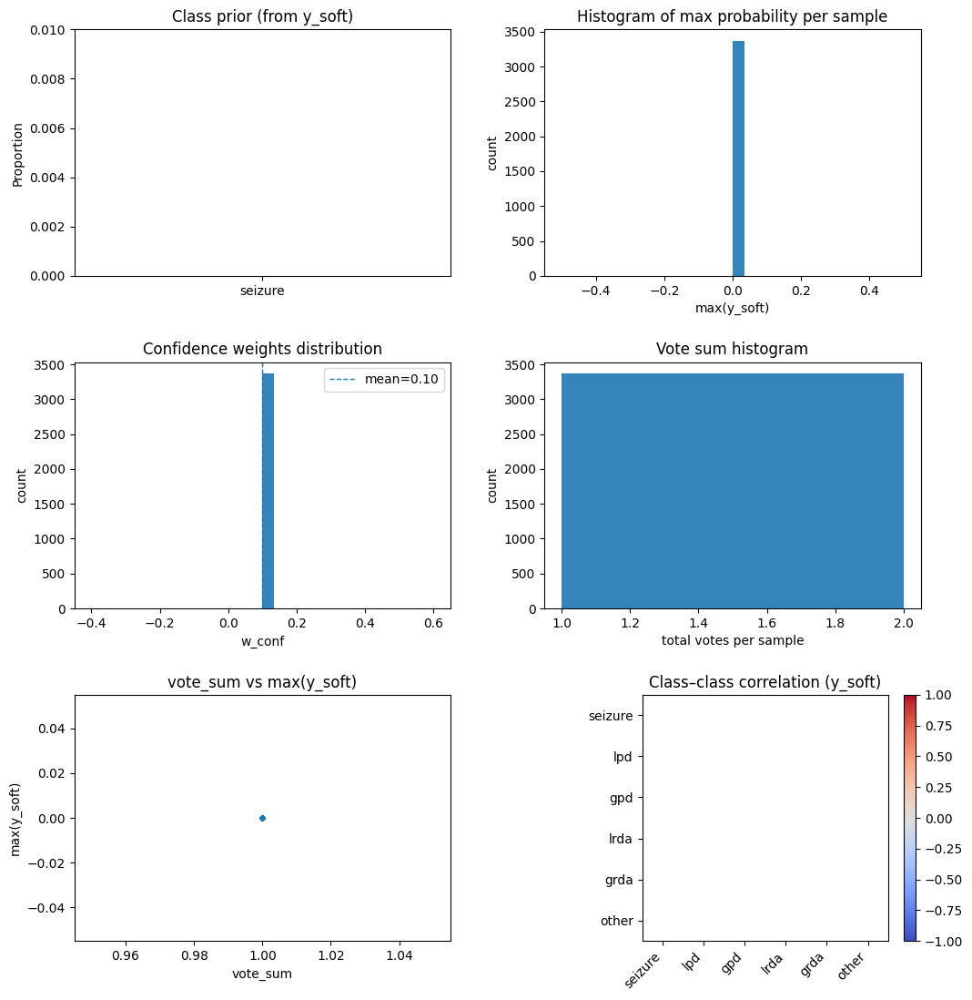

N samples: 3364
Classes  : ['seizure', 'lpd', 'gpd', 'lrda', 'grda', 'other']
vote_sum: min=1 max=1 mean=1.00
w_conf  : min=0.10 max=0.10 mean=0.10
maxprob : mean=0.000 ± 0.000
HC count: 0


C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\3069954221.py:90: RuntimeWarning: invalid value encountered in divide
  "soft_prop": y_soft.sum(axis=0)/y_soft.sum()


,class,soft_mass,soft_prop
0,seizure,0.0,NaN
1,lpd,0.0,NaN
2,gpd,0.0,NaN
3,lrda,0.0,NaN
4,grda,0.0,NaN
5,other,0.0,NaN


Total votes per class: {'seizure': 1450, 'lpd': 2121, 'gpd': 4699, 'lrda': 7282, 'grda': 4627, 'other': 3997}


In [123]:
def visualize_labels(y_soft, w_conf, hc_mask, meta_use, classes):
    N, C = y_soft.shape
    max_prob = y_soft.max(axis=1)
    priors_soft = y_soft.sum(axis=0) / y_soft.sum()
    n_hc = int(np.sum(hc_mask)) if hc_mask is not None else 0
    vote_cols = [c+"_vote" for c in classes]
    has_votes = all([(c in meta_use.columns) for c in vote_cols])
    if "vote_sum" in meta_use.columns:
        vote_sum = meta_use["vote_sum"].to_numpy()
    elif has_votes:
        vote_sum = meta_use[vote_cols].sum(axis=1).to_numpy()
    else:
        vote_sum = None

    nrows, ncols = 3, 2
    fig = plt.figure(figsize=(12, 13))
    gs  = fig.add_gridspec(nrows, ncols, hspace=0.35, wspace=0.25)

    ax = fig.add_subplot(gs[0,0])
    ax.bar(classes, priors_soft)
    ax.set_title("Class prior (from y_soft)")
    ax.set_ylabel("Proportion")
    ax.set_ylim(0, max(0.01, priors_soft.max()*1.2))
    for i,v in enumerate(priors_soft):
        ax.text(i, v, f"{v:.2%}", ha="center", va="bottom", fontsize=9)

    ax = fig.add_subplot(gs[0,1])
    ax.hist(max_prob, bins=30, alpha=0.9)
    ax.set_title("Histogram of max probability per sample")
    ax.set_xlabel("max(y_soft)")
    ax.set_ylabel("count")

    ax = fig.add_subplot(gs[1,0])
    ax.hist(w_conf, bins=30, alpha=0.9)
    ax.set_title("Confidence weights distribution")
    ax.set_xlabel("w_conf")
    ax.set_ylabel("count")
    ax.axvline(np.mean(w_conf), ls="--", lw=1, label=f"mean={np.mean(w_conf):.2f}")
    ax.legend()

    ax = fig.add_subplot(gs[1,1])
    if vote_sum is not None:
        ax.hist(vote_sum, bins=range(int(vote_sum.min()), int(vote_sum.max())+2), alpha=0.9)
        ax.set_title("Vote sum histogram")
        ax.set_xlabel("total votes per sample")
        ax.set_ylabel("count")
        if hc_mask is not None and n_hc>0:
            hc_vals = vote_sum[hc_mask]
            thr = np.min(hc_vals) if len(hc_vals)>0 else None
            if thr is not None:
                ax.axvline(thr, color="r", ls="--", lw=1.5, label=f"HC ≥ {int(thr)} (n={n_hc})")
                ax.legend()
    else:
        ax.text(0.5, 0.5, "vote_sum not available", ha="center", va="center", transform=ax.transAxes)
        ax.set_axis_off()

    ax = fig.add_subplot(gs[2,0])
    if vote_sum is not None:
        ax.scatter(vote_sum, max_prob, s=8, alpha=0.5)
        ax.set_title("vote_sum vs max(y_soft)")
        ax.set_xlabel("vote_sum")
        ax.set_ylabel("max(y_soft)")
    else:
        ax.text(0.5, 0.5, "vote_sum not available", ha="center", va="center", transform=ax.transAxes)
        ax.set_axis_off()

    ax = fig.add_subplot(gs[2,1])
    corr = np.corrcoef(y_soft.T)
    im = ax.imshow(corr, vmin=-1, vmax=1, cmap="coolwarm")
    ax.set_title("Class–class correlation (y_soft)")
    ax.set_xticks(range(C)); ax.set_yticks(range(C))
    ax.set_xticklabels(classes, rotation=45, ha="right")
    ax.set_yticklabels(classes)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)

    plt.show()

    print("N samples:", N)
    print("Classes  :", classes)
    if vote_sum is not None:
        print("vote_sum: min=%d max=%d mean=%.2f" % (int(np.min(vote_sum)), int(np.max(vote_sum)), float(np.mean(vote_sum))))
    print("w_conf  : min=%.2f max=%.2f mean=%.2f" % (float(w_conf.min()), float(w_conf.max()), float(w_conf.mean())))
    print("maxprob : mean=%.3f ± %.3f" % (float(max_prob.mean()), float(max_prob.std())))
    if hc_mask is not None:
        print("HC count:", int(n_hc))

    df_tot = pd.DataFrame({
        "class": classes,
        "soft_mass": y_soft.sum(axis=0),
        "soft_prop": y_soft.sum(axis=0)/y_soft.sum()
    })
    display(df_tot)

    if has_votes:
        tot_votes = meta_use[vote_cols].sum(axis=0).to_dict()
        print("Total votes per class:", {k.replace("_vote",""): int(v) for k,v in tot_votes.items()})

visualize_labels(y_soft, w_conf, hc_mask, meta_use, CLASSES)

In [126]:
CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
VOTE_COLS = [c+"_vote" for c in CLASSES]

BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN_CSV = BASE_DIR / "train.csv"
outdir = Path("data_package"); outdir.mkdir(parents=True, exist_ok=True)

meta_use["eeg_id"] = meta_use["eeg_id"].astype("int64")
if TRAIN_CSV.exists():
    tr = pd.read_csv(TRAIN_CSV, usecols=["eeg_id","patient_id"]+VOTE_COLS)
    tr["eeg_id"] = tr["eeg_id"].astype("int64")
    agg = tr.groupby("eeg_id")[VOTE_COLS].sum().reset_index()
    meta_votes = meta_use.drop(columns=[c for c in meta_use.columns if c in VOTE_COLS], errors="ignore")\
                         .merge(agg, on="eeg_id", how="left")
else:
    meta_votes = meta_use.copy()
    for c in VOTE_COLS:
        if c not in meta_votes.columns:
            meta_votes[c] = 0

votes = meta_votes[VOTE_COLS].to_numpy(dtype="float32")
vote_sum = votes.sum(axis=1, keepdims=True)
zero_mask = (vote_sum==0)
vote_sum[zero_mask] = 1.0
y_soft = votes / vote_sum

vsum1d = vote_sum.squeeze().astype("float32")
w_linear = np.clip(vsum1d/10.0, 0.1, 1.5).astype("float32")
w_conf = w_linear
hc_mask = (vsum1d >= 10)

meta_votes["vote_sum"] = vsum1d.astype("int32")
meta_use = meta_votes.copy()
meta_use.to_csv(outdir/"meta_use.csv", index=False)

np.savez(outdir/"labels.npz",
         y_soft=y_soft.astype("float32"),
         w_conf=w_conf.astype("float32"),
         hc_mask=hc_mask.astype("bool"),
         classes=np.array(CLASSES),
         vote_sum=vsum1d.astype("int32"))

print("y_soft:", y_soft.shape, "w_conf:", (float(w_conf.min()), float(w_conf.max())))
print("HC count (>=10):", int(hc_mask.sum()))
print("vote_sum min/max/mean:", int(vsum1d.min()), int(vsum1d.max()), float(vsum1d.mean()))
print("per-class totals:", dict(zip(CLASSES, votes.sum(axis=0).astype(int))))

y_soft: (3364, 6) w_conf: (0.10000000149011612, 1.5)
HC count (>=10): 3284
vote_sum min/max/mean: 1 4048 866.8751220703125
per-class totals: {'seizure': 232919, 'lpd': 48572, 'gpd': 680319, 'lrda': 953210, 'grda': 779345, 'other': 221803}


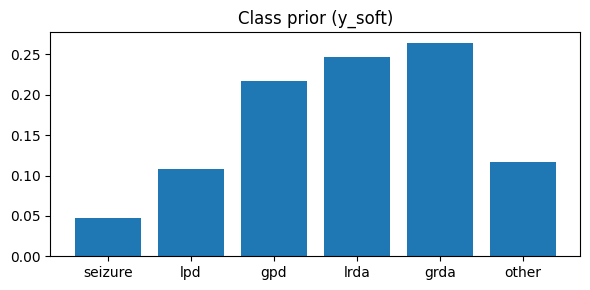

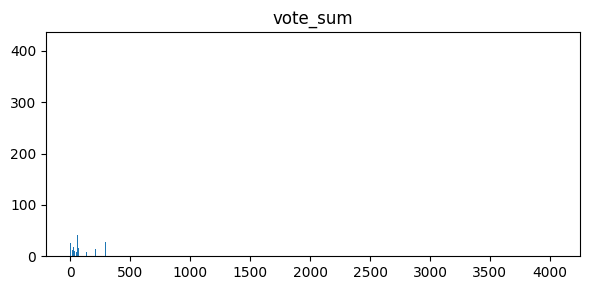

In [127]:
priors = y_soft.sum(axis=0)/y_soft.sum()
plt.figure(figsize=(6,3)); plt.bar(CLASSES, priors); plt.title("Class prior (y_soft)"); plt.tight_layout(); plt.show()
plt.figure(figsize=(6,3)); plt.hist(vsum1d, bins=range(int(vsum1d.min()), int(vsum1d.max())+2)); plt.title("vote_sum"); plt.tight_layout(); plt.show()

In [128]:
#overwrite 

outdir = Path("data_package"); outdir.mkdir(parents=True, exist_ok=True)

np.savez(outdir/"labels.npz",
         y_soft=y_soft.astype("float32"),
         w_conf=w_conf.astype("float32"),
         hc_mask=hc_mask.astype("bool"),
         classes=np.array(CLASSES),
         vote_sum=vsum1d.astype("int32"))

print("Final labels saved ->", outdir/"labels.npz")

Final labels saved -> data_package\labels.npz


In [86]:
outdir = Path("data_package")
outdir.mkdir(parents=True, exist_ok=True)

# === Simpan manifest (baris yang punya file npz) ===
meta_use.to_csv(outdir / "meta_use.csv", index=False)

# === Simpan labels & weights ===
np.savez(outdir / "labels.npz",
         y_soft=y_soft.astype("float32"),
         w_conf=w_conf.astype("float32"),
         hc_mask=hc_mask.astype("bool"),
         index=np.arange(len(meta_use), dtype="int64"),
         classes=np.array(CLASSES))

In [87]:
# load manifest
meta_use = pd.read_csv("data_package/meta_use.csv")

# load labels
lbl = np.load("data_package/labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]
w_conf  = lbl["w_conf"]
hc_mask = lbl["hc_mask"]
classes = lbl["classes"]  # opsional, kalau kamu simpan

In [71]:
import re

In [72]:
def align_to_saved_specs(meta, spec_dir, kind="hr"):
    spec_dir = Path(spec_dir)
    have = []
    for p in spec_dir.glob(f"*_{kind}.npz"):
        eeg_id = int(re.findall(r"(\d+)_"+kind, p.name)[0])
        have.append(eeg_id)
    m2 = meta[meta["eeg_id"].isin(have)].reset_index(drop=True)
    return m2

meta_use = align_to_saved_specs(meta_labeled, SPEC_HR_OUT, kind="hr")
y_soft_use, w_conf_use, hc_mask_use, meta_use = build_labels(meta_use)  # rebuild agar ukurannya match

In [73]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [74]:
groups = meta_use.patient_id.values
uniq = np.unique(groups)
print("n_samples:", len(meta_use), "n_groups:", len(uniq), "unique patients:", uniq[:10])

n_samples: 3364 n_groups: 21 unique patients: [ 2641  3838  8033  9064 16541 26349 28330 29441 30631 31386]


In [75]:
pip install tqdm

Note: you may need to restart the kernel to use updated packages.


In [76]:
from tqdm import tqdm

# atur target
N_PATIENTS   = 20         # banyak pasien yang mau diproses
MAX_PER_PAT  = 10         # berapa eeg_id per pasien (boleh lebih kecil dulu)
SPEC_HR_OUT  = Path("./spec_hr_out"); SPEC_HR_OUT.mkdir(parents=True, exist_ok=True)

# pasien unik (acak / atau berdasarkan frekuensi)
patients = (meta.groupby("patient_id")["eeg_id"]
              .count().sort_values(ascending=False).index.tolist())
patients = patients[:N_PATIENTS]

def process_one_row(row, fs=200):
    # 1) load & filter
    eeg_df = pd.read_parquet(EEG_DIR / f"{row.eeg_id}.parquet", engine="pyarrow")
    eeg_df = eeg_df[[c for c in eeg_df.columns if c.upper() != "EKG"]].copy()
    for c in eeg_df.columns:
        eeg_df[c] = bandpass_filter(eeg_df[c].to_numpy(), fs=fs)
    # 2) montage
    mont = double_banana_montage(eeg_df)
    # 3) 50s window
    win = 50*fs
    mont50 = {k: v[:win] for k,v in mont.items() if len(v) >= win}
    if not mont50: 
        return False
    # 4) spec-HR + save (dengan normalisasi di saver)
    specs_hr, freqs = make_spec_hr(mont50, fs=fs, fmin=0.5, fmax=40, n_freqs=40, stride=16)
    save_spec_npz(SPEC_HR_OUT, row.eeg_id, specs_hr, freqs, row, kind="hr")
    return True

saved, skipped = 0, 0
for pid in tqdm(patients, desc="process patients"):
    sub = meta[meta.patient_id == pid].drop_duplicates("eeg_id").head(MAX_PER_PAT)
    for _, row in sub.iterrows():
        try:
            ok = process_one_row(row)
            saved += int(ok); skipped += int(not ok)
        except Exception:
            skipped += 1

print(f"saved={saved}, skipped={skipped}")

C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jkl\lib\site-packages\numpy\lib\nanfunctions.py:1384: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(
C:\Users\numpppy\anaconda3\envs\jk

saved=194, skipped=0


In [77]:
def align_to_saved_specs(meta, spec_dir, kind="hr"):
    spec_dir = Path(spec_dir)
    ids = []
    for p in spec_dir.glob(f"*_{kind}.npz"):
        # ekstrak eeg_id dari nama file
        s = p.name.split(f"_{kind}.npz")[0]
        ids.append(int(s))
    m2 = meta[meta["eeg_id"].isin(ids)].reset_index(drop=True)
    return m2

meta_use = align_to_saved_specs(meta, SPEC_HR_OUT, kind="hr")
n_groups = meta_use["patient_id"].nunique()
print("n_samples:", len(meta_use), "n_groups:", n_groups,
      "some patients:", meta_use["patient_id"].unique()[:10])


n_samples: 3364 n_groups: 21 some patients: [56885 28330 38549 29441 31386 26349 32068 56450 35627 40881]


In [78]:
y_soft, w_conf, hc_mask, meta_use = build_labels(meta_use)  

In [79]:
from sklearn.model_selection import GroupKFold

groups   = meta_use.patient_id.values
gkf      = GroupKFold(n_splits=min(5, meta_use.patient_id.nunique()))
splits   = list(gkf.split(meta_use, groups=groups))
print("folds:", len(splits))

folds: 5


In [88]:
from sklearn.model_selection import GroupKFold
import numpy as np

# bikin GroupKFold (max 5 fold atau sesuai jumlah pasien)
n_splits = min(5, meta_use.patient_id.nunique())
gkf = GroupKFold(n_splits=n_splits)

folds = []
for tr_idx, va_idx in gkf.split(meta_use, groups=meta_use.patient_id.values):
    # Stage-1 subset: HC samples dalam train fold
    tr_hc_rel = np.where(hc_mask[tr_idx])[0]  # posisi relatif ke tr_idx
    
    folds.append({
        "train_idx": tr_idx.astype("int32"),
        "val_idx":   va_idx.astype("int32"),
        "train_hc_rel": tr_hc_rel.astype("int32")
    })

# simpan ke file npz
np.savez("data_package/splits.npz", folds=np.array(folds, dtype=object))
print("Splits saved:", len(folds), "folds")

Splits saved: 5 folds


In [89]:
# === QC / Data Audit ===
from pathlib import Path
import numpy as np, pandas as pd, json, os
import matplotlib.pyplot as plt

QC_DIR = Path("data_package/qc")
QC_DIR.mkdir(parents=True, exist_ok=True)

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]

# 1) Vote-based stats (HC/LC, agreement, entropy)
V = meta_use[[c+"_vote" for c in CLASSES]].to_numpy("float32")
vote_sum = V.sum(1)
p = V / np.clip(vote_sum[:,None], 1, None)
agreement = (V.max(1) / np.clip(vote_sum, 1, None))
entropy   = -np.sum(p * np.log(np.clip(p, 1e-9, 1.0)), axis=1)

meta_use["vote_sum"]  = vote_sum.astype("int32")
meta_use["agreement"] = agreement
meta_use["entropy"]   = entropy

# Histogram vote_sum (bins standar)
bins = [1,2,3,4,5,6,8,10,15,20,30]
hist, edges = np.histogram(vote_sum, bins=bins)
pd.DataFrame({"bin_left":edges[:-1], "bin_right":edges[1:], "count":hist}) \
  .to_csv(QC_DIR/"vote_sum_hist.csv", index=False)

# Total votes per class & proporsi
totals = V.sum(0)
pd.DataFrame([dict(zip(CLASSES, totals.astype(int)))]) \
  .to_csv(QC_DIR/"class_vote_totals.csv", index=False)

props = totals / totals.sum()
pd.DataFrame([dict(zip(CLASSES, props.round(6)))]) \
  .to_csv(QC_DIR/"class_vote_proportions.csv", index=False)

# Distribusi kelas per pasien (normalized)
per_class_pat = (meta_use
    .assign(**{c: meta_use[c+"_vote"] for c in CLASSES})
    .groupby("patient_id")[CLASSES]
    .sum())
per_class_pat_norm = per_class_pat.div(per_class_pat.sum(1), axis=0).fillna(0.0)
per_class_pat_norm.to_csv(QC_DIR/"patient_class_distribution.csv")

# 2) Spectrogram QC (cek file .npz)
SPEC_DIR = Path("spec_hr_out")
files = sorted(SPEC_DIR.glob("*_hr.npz"))
n_files = len(files)
bad_naninf = 0
empty_chain = 0
mins, maxs = [], []

# sampling kalau file sangat banyak (biar cepat). Set ke None untuk scan semua
MAX_SCAN = None  # mis. 2000
scan_list = files if MAX_SCAN is None else files[:MAX_SCAN]

for pth in scan_list:
    z = np.load(pth)
    x = z["x"]  # [4,F,T], 0..1
    if not np.isfinite(x).all():
        bad_naninf += 1
    # chain kosong/konstan → std==0
    if (x.std(axis=(1,2)) == 0).any():
        empty_chain += 1
    mins.append(float(x.min()))
    maxs.append(float(x.max()))

qc_spectro = {
    "scanned_files": len(scan_list),
    "total_files": n_files,
    "naninf_files": bad_naninf,
    "empty_chain_samples": empty_chain,
    "x_min_overall": float(np.min(mins)) if mins else None,
    "x_max_overall": float(np.max(maxs)) if maxs else None,
}

# 3) Ringkasan umum QC
qc_summary = {
    "n_samples": int(len(meta_use)),
    "n_patients": int(meta_use.patient_id.nunique()),
    "vote_sum_min": int(vote_sum.min()) if len(vote_sum) else None,
    "vote_sum_max": int(vote_sum.max()) if len(vote_sum) else None,
    "hc_threshold": 10,
    "hc_count": int((vote_sum >= 10).sum()),
    "agreement_mean": float(agreement.mean()),
    "agreement_std":  float(agreement.std()),
    "entropy_mean":   float(entropy.mean()),
    "entropy_std":    float(entropy.std()),
    "class_totals": {c:int(t) for c,t in zip(CLASSES, totals)},
    "class_proportions": {c:float(pp) for c,pp in zip(CLASSES, props)},
    "spectrogram_qc": qc_spectro,
}

with open(QC_DIR/"qc_summary.json","w") as f:
    json.dump(qc_summary, f, indent=2)

# 4) Export sample_report (ringkas per-sample untuk review)
cols = ["eeg_id","patient_id","spectrogram_id","vote_sum","agreement","entropy"] + [c+"_vote" for c in CLASSES]
meta_use[cols].to_csv(QC_DIR/"sample_report.csv", index=False)

print("QC done.")
print(json.dumps(qc_summary, indent=2))

QC done.
{
  "n_samples": 3364,
  "n_patients": 21,
  "vote_sum_min": 1,
  "vote_sum_max": 20,
  "hc_threshold": 10,
  "hc_count": 1203,
  "agreement_mean": 0.817120373249054,
  "agreement_std": 0.20666487514972687,
  "entropy_mean": 0.4044544994831085,
  "entropy_std": 0.4442305862903595,
  "class_totals": {
    "seizure": 1450,
    "lpd": 2121,
    "gpd": 4699,
    "lrda": 7282,
    "grda": 4627,
    "other": 3997
  },
  "class_proportions": {
    "seizure": 0.059976834803819656,
    "lpd": 0.08773163706064224,
    "gpd": 0.19436632096767426,
    "lrda": 0.3012078106403351,
    "grda": 0.19138815999031067,
    "other": 0.165329247713089
  },
  "spectrogram_qc": {
    "scanned_files": 195,
    "total_files": 195,
    "naninf_files": 7,
    "empty_chain_samples": 0,
    "x_min_overall": NaN,
    "x_max_overall": NaN
  }
}


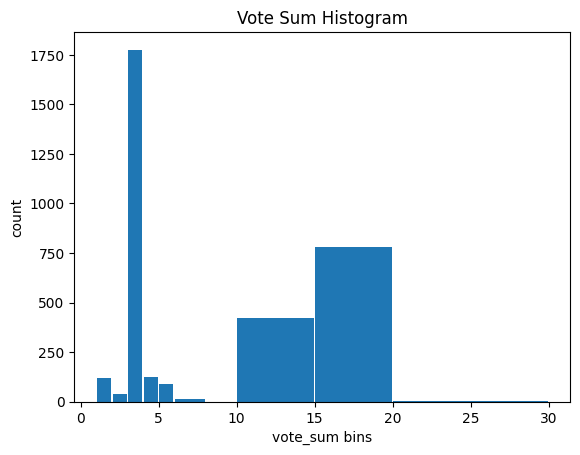

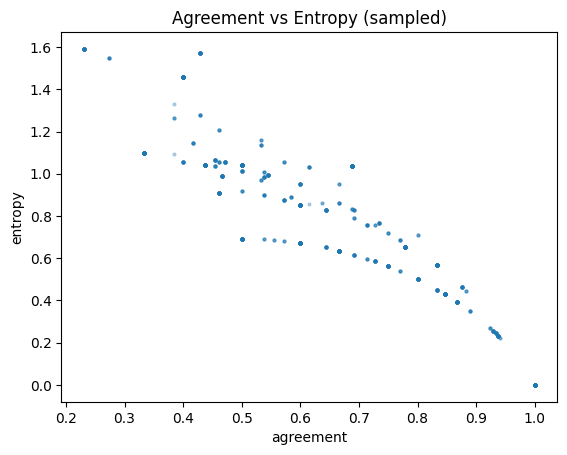

In [90]:
# Vote sum histogram plot
plt.figure()
plt.bar((np.array(edges[:-1])+np.array(edges[1:]))/2, hist, width=np.diff(edges)-0.1)
plt.title("Vote Sum Histogram"); plt.xlabel("vote_sum bins"); plt.ylabel("count")
plt.show()

# Agreement vs Entropy scatter (sampling biar ringan)
idx = np.random.choice(len(meta_use), size=min(5000, len(meta_use)), replace=False)
plt.figure()
plt.scatter(meta_use["agreement"].values[idx], meta_use["entropy"].values[idx], s=4, alpha=0.3)
plt.xlabel("agreement"); plt.ylabel("entropy"); plt.title("Agreement vs Entropy (sampled)")
plt.show()

In [92]:
CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]

totals = np.array([1450, 2121, 4699, 7282, 4627, 3997], dtype="float32")
props  = totals / totals.sum()

class_weights = 1.0 / props
class_weights = class_weights / class_weights.mean()

# convert ke float Python
weights_dict = {c: float(w) for c, w in zip(CLASSES, class_weights)}
print("class weights:", weights_dict)

outdir = Path("data_package/qc")
outdir.mkdir(parents=True, exist_ok=True)
with open(outdir/"class_weights.json","w") as f:
    json.dump(weights_dict, f, indent=2)

print("saved ->", outdir/"class_weights.json")

class weights: {'seizure': 2.0924243927001953, 'lpd': 1.430464506149292, 'gpd': 0.6456725001335144, 'lrda': 0.416645884513855, 'grda': 0.6557197570800781, 'other': 0.7590731978416443}
saved -> data_package\qc\class_weights.json


In [93]:
ROOT = Path("data_package")
SPEC = Path("spec_hr_out")

print("spec files:", len(list(SPEC.glob("*_hr.npz"))))
assert (ROOT/"meta_use.csv").exists()
assert (ROOT/"labels.npz").exists()
assert (ROOT/"splits.npz").exists()

meta_use = pd.read_csv(ROOT/"meta_use.csv")
lbl      = np.load(ROOT/"labels.npz", allow_pickle=True)
y_soft   = lbl["y_soft"]; w_conf = lbl["w_conf"]; hc_mask = lbl["hc_mask"]; classes = lbl["classes"]
print("meta_use:", meta_use.shape, "y_soft:", y_soft.shape, "w_conf:", w_conf.shape, "hc_mask:", hc_mask.shape)
assert len(meta_use)==len(y_soft)==len(w_conf)==len(hc_mask)
print("row-wise prob sum ~1:", np.allclose(y_soft.sum(1), 1.0, atol=1e-6))

spec files: 195
meta_use: (3364, 22) y_soft: (3364, 6) w_conf: (3364,) hc_mask: (3364,)
row-wise prob sum ~1: False


##### Installation

In [2]:
pip install "pyarrow==14.0.2"


  Using cached pyarrow-14.0.2-cp310-cp310-win_amd64.whl.metadata (3.1 kB)
Using cached pyarrow-14.0.2-cp310-cp310-win_amd64.whl (24.6 MB)
Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install "pandas==2.2.3"


Note: you may need to restart the kernel to use updated packages.


In [4]:
import pandas as pd, pyarrow as pa
print("pandas:", pd.__version__)
print("pyarrow:", pa.__version__)


pandas: 2.2.3
pyarrow: 14.0.2


In [5]:
eeg_df = pd.read_parquet(eeg_file, engine="pyarrow")


NameError: name 'eeg_file' is not defined

In [2]:
pip install pandas

   ---------------------------------------- 0.0/11.3 MB ? eta -:--:--
   -- ------------------------------------- 0.8/11.3 MB 4.8 MB/s eta 0:00:03
   ------------ --------------------------- 3.7/11.3 MB 10.4 MB/s eta 0:00:01
   ---------------------- ----------------- 6.3/11.3 MB 11.0 MB/s eta 0:00:01
   ------------------------------- -------- 8.9/11.3 MB 11.1 MB/s eta 0:00:01
   ---------------------------------------  11.3/11.3 MB 11.4 MB/s eta 0:00:01
   ---------------------------------------  11.3/11.3 MB 11.4 MB/s eta 0:00:01
   ---------------------------------------- 11.3/11.3 MB 9.0 MB/s eta 0:00:00

   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ---------------------------------------- 0/3 [pytz]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/3 [tzdata]
   ------------- -------------------------- 1/

In [10]:
pip install fastparquet

   ---------------------------------------- 0.0/670.7 kB ? eta -:--:--
   ------------------------------- -------- 524.3/670.7 kB 4.2 MB/s eta 0:00:01
   ------------------------------- -------- 524.3/670.7 kB 4.2 MB/s eta 0:00:01
   ------------------------------- -------- 524.3/670.7 kB 4.2 MB/s eta 0:00:01
   ------------------------------- -------- 524.3/670.7 kB 4.2 MB/s eta 0:00:01
   ------------------------------- -------- 524.3/670.7 kB 4.2 MB/s eta 0:00:01
   -------------------------------------- 670.7/670.7 kB 343.9 kB/s eta 0:00:00
   ---------------------------------------- 0.0/1.7 MB ? eta -:--:--
   ------------------------------------ --- 1.6/1.7 MB 12.0 MB/s eta 0:00:01
   ---------------------------------------- 1.7/1.7 MB 7.1 MB/s eta 0:00:00

   ---------------------------------------- 0/2 [cramjam]
   ---------------------------------------- 0/2 [cramjam]
   -------------------- ------------------- 1/2 [fastparquet]
   ---------------------------------------- 2/2 

In [9]:
pip install pyarrow


   ---------------------------------------- 0.0/26.2 MB ? eta -:--:--
   - -------------------------------------- 0.8/26.2 MB 4.8 MB/s eta 0:00:06
   ---- ----------------------------------- 3.1/26.2 MB 8.8 MB/s eta 0:00:03
   ------- -------------------------------- 5.0/26.2 MB 8.6 MB/s eta 0:00:03
   ---------- ----------------------------- 6.8/26.2 MB 8.7 MB/s eta 0:00:03
   ------------- -------------------------- 8.7/26.2 MB 8.7 MB/s eta 0:00:03
   --------------- ------------------------ 10.5/26.2 MB 8.7 MB/s eta 0:00:02
   ------------------- -------------------- 12.6/26.2 MB 8.8 MB/s eta 0:00:02
   --------------------- ------------------ 14.4/26.2 MB 8.8 MB/s eta 0:00:02
   ------------------------- -------------- 16.5/26.2 MB 8.9 MB/s eta 0:00:02
   --------------------------- ------------ 18.4/26.2 MB 8.9 MB/s eta 0:00:01
   ------------------------------- -------- 20.4/26.2 MB 9.0 MB/s eta 0:00:01
   ---------------------------------- ----- 22.5/26.2 MB 9.1 MB/s eta 0:00:01

In [ ]:
### cek keberadaan dan sinkronisasi file

In [99]:
SPEC_DIR = Path("spec_hr_out")
WAVE_DIR = Path("wave_hr_out")

ids_meta  = set(int(i) for i in meta_use.eeg_id.values)
ids_spec  = set(int(p.name.split("_hr.npz")[0]) for p in SPEC_DIR.glob("*_hr.npz"))
ids_wave  = set(int(p.name.split("_hr.npz")[0]) for p in WAVE_DIR.glob("*_hr.npz"))

miss_spec = sorted(list(ids_meta - ids_spec))
miss_wave = sorted(list(ids_meta - ids_wave))
extra_spec = sorted(list(ids_spec - ids_meta))
extra_wave = sorted(list(ids_wave - ids_meta))

print(f"meta_use rows: {len(ids_meta)}")
print(f"spec files  : {len(ids_spec)}  | missing vs meta: {len(miss_spec)}")
print(f"wave files  : {len(ids_wave)}  | missing vs meta: {len(miss_wave)}")
if miss_spec[:10]: print("missing spec (examples):", miss_spec[:10])
if miss_wave[:10]: print("missing wave (examples):", miss_wave[:10])

meta_use rows: 195
spec files  : 195  | missing vs meta: 0
wave files  : 1  | missing vs meta: 194
missing wave (examples): [41498323, 86185603, 111973167, 127385282, 135748076, 136213045, 163506374, 269769406, 290927398, 298831753]


In [100]:
def qc_spec(dirpath, limit=None):
    bad, mins, maxs = [], [], []
    files = list(dirpath.glob("*_hr.npz"))
    if limit: files = files[:limit]
    for p in files:
        z = np.load(p)
        x = z["x"]  # [4,F,T], harus 0..1
        if not np.isfinite(x).all():
            bad.append(p.name)
        mins.append(float(np.nanmin(x)))
        maxs.append(float(np.nanmax(x)))
    return {"n": len(files),
            "bad_naninf": len(bad),
            "min": None if not mins else float(np.nanmin(mins)),
            "max": None if not maxs else float(np.nanmax(maxs)),
            "examples": bad[:10]}

def qc_wave(dirpath, limit=None):
    bad, mins, maxs = [], [], []
    files = list(dirpath.glob("*_hr.npz"))
    if limit: files = files[:limit]
    for p in files:
        z = np.load(p)
        x = z["x"]  # [4,T], bandpass+clipped (bukan 0..1)
        if not np.isfinite(x).all():
            bad.append(p.name)
        mins.append(float(np.nanmin(x)))
        maxs.append(float(np.nanmax(x)))
    return {"n": len(files),
            "bad_naninf": len(bad),
            "min": None if not mins else float(np.nanmin(mins)),
            "max": None if not maxs else float(np.nanmax(maxs)),
            "examples": bad[:10]}

print("SPEC QC:", qc_spec(SPEC_DIR))
print("WAVE QC:", qc_wave(WAVE_DIR))

C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\599101934.py:10: RuntimeWarning: All-NaN slice encountered
  mins.append(float(np.nanmin(x)))
C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\599101934.py:11: RuntimeWarning: All-NaN slice encountered
  maxs.append(float(np.nanmax(x)))


SPEC QC: {'n': 195, 'bad_naninf': 7, 'min': 0.0, 'max': 1.0, 'examples': ['1480985066_hr.npz', '1632070193_hr.npz', '2880273173_hr.npz', '3023900245_hr.npz', '3403533082_hr.npz', '3947918181_hr.npz', '4239311496_hr.npz']}
WAVE QC: {'n': 1, 'bad_naninf': 0, 'min': -26.106645584106445, 'max': 21.48183250427246, 'examples': []}


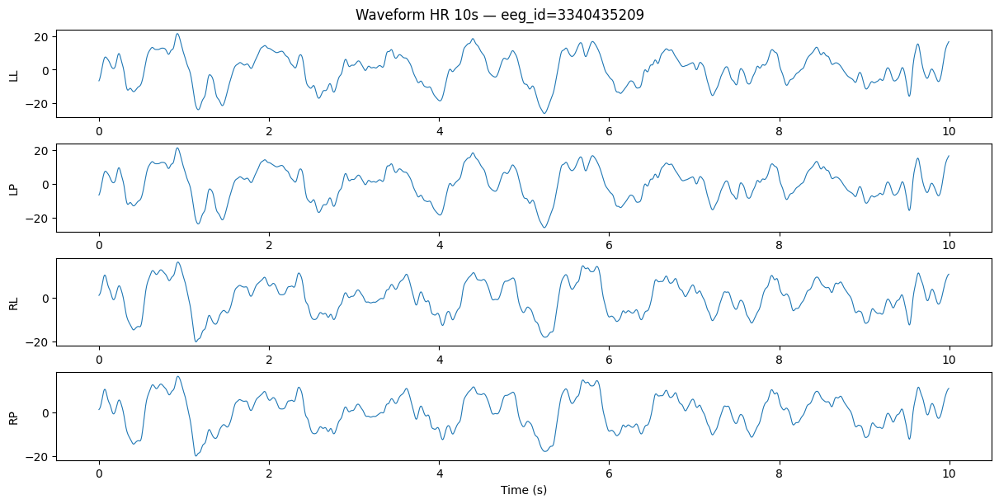

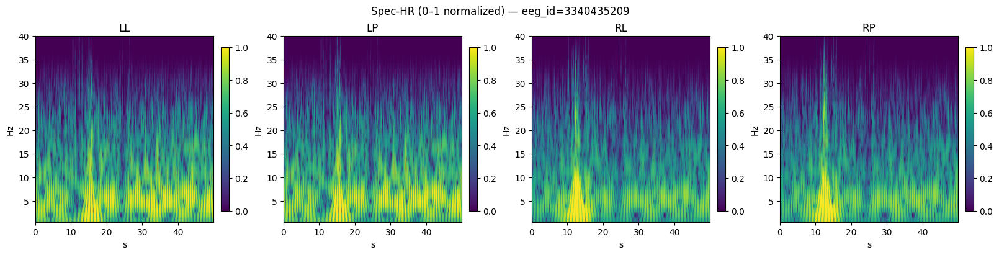

In [101]:
def preview_sample(eeg_id=None):
    # pilih eeg_id yang punya keduanya
    both = list(ids_spec & ids_wave)
    if not both:
        print("Tidak ada eeg_id yang punya spec & wave sekaligus.")
        return
    if eeg_id is None or eeg_id not in both:
        eeg_id = both[0]

    # load wave
    w = np.load(WAVE_DIR/f"{eeg_id}_hr.npz")
    xw, fs = w["x"], int(w["fs"])     # xw: [4,T]
    t_w = np.arange(xw.shape[1]) / fs
    chains = ["LL","LP","RL","RP"]

    # load spec
    s = np.load(SPEC_DIR/f"{eeg_id}_hr.npz")
    xs, freqs = s["x"], s["freqs"]    # xs: [4,F,T]
    stride = 16
    t_s = np.arange(xs.shape[2]) * (stride/fs)

    # plot waveform
    fig, axes = plt.subplots(4, 1, figsize=(12,6), constrained_layout=True)
    for i, ch in enumerate(chains):
        axes[i].plot(t_w, xw[i], lw=0.8)
        axes[i].set_ylabel(ch)
    axes[-1].set_xlabel("Time (s)")
    fig.suptitle(f"Waveform HR 10s — eeg_id={eeg_id}")
    plt.show()

    # plot spectrogram 4 panel
    fig, axes = plt.subplots(1, 4, figsize=(16,4), constrained_layout=True)
    for i, ch in enumerate(chains):
        im = axes[i].imshow(xs[i], aspect="auto", origin="lower",
                            extent=[t_s[0], t_s[-1], float(freqs[0]), float(freqs[-1])])
        axes[i].set_title(ch); axes[i].set_xlabel("s"); axes[i].set_ylabel("Hz")
        fig.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
    fig.suptitle(f"Spec-HR (0–1 normalized) — eeg_id={eeg_id}")
    plt.show()

preview_sample()  # atau preview_sample(eeg_id=ID_SPESIFIK)

In [102]:
eid = next(iter(ids_spec)) if ids_spec else None
if eid is not None:
    zs = np.load(SPEC_DIR/f"{eid}_hr.npz")
    print("SPEC keys:", zs.files, "| x:", zs["x"].shape, "freqs:", zs["freqs"].shape)
eid = next(iter(ids_wave)) if ids_wave else None
if eid is not None:
    zw = np.load(WAVE_DIR/f"{eid}_hr.npz")
    print("WAVE keys:", zw.files, "| x:", zw["x"].shape, "fs:", zw["fs"])

SPEC keys: ['x', 'freqs', 'eeg_id', 'patient_id'] | x: (4, 40, 625) freqs: (40,)
WAVE keys: ['x', 'fs', 'eeg_id', 'patient_id'] | x: (4, 2000) fs: 200


In [103]:
SPEC_DIR = Path("spec_hr_out")

def robust_log(x):
    # pastikan non-negatif dan finite
    x = np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0)
    x = np.maximum(x, 0.0)
    return np.log1p(x).astype("float32")

def norm_spec_0_1_safe(S, pct=(1,99)):
    Z = robust_log(S)
    vmin, vmax = np.nanpercentile(Z, pct)
    if not np.isfinite(vmin): vmin = 0.0
    if not np.isfinite(vmax): vmax = vmin + 1.0
    if vmax - vmin < 1e-8:
        return np.zeros_like(Z, dtype="float32")
    Y = (Z - vmin) / (vmax - vmin)
    Y = np.clip(np.nan_to_num(Y, nan=0.0, posinf=1.0, neginf=0.0), 0.0, 1.0)
    return Y.astype("float32")

def rebuild_spec_safe(eeg_id, patient_id, fs=200):
    # 1) load & preprocess EEG (pakai fungsi kamu)
    df = pd.read_parquet(EEG_DIR/f"{int(eeg_id)}.parquet", engine="pyarrow")
    df_f = preprocess_eeg_df(df, fs=fs)
    mont = double_banana_montage(df_f)

    # 2) CWT per chain -> normalize safe
    chains = ["LL","LP","RL","RP"]
    specs, freqs_ = [], None
    for ch in chains:
        sig = mont.get(ch, None)
        if sig is None or len(sig)==0:
            specs.append(np.zeros((40, 625), dtype="float32"))  # fallback shape
            continue
        S_raw, freqs = cwt_spectrogram(sig, fs=fs)  # fungsi CWT kamu
        if freqs_ is None: freqs_ = freqs.astype("float32")
        S_norm = norm_spec_0_1_safe(S_raw)
        specs.append(S_norm)
    X = np.stack(specs, axis=0)  # [4,F,T]

    # 3) save kembali
    np.savez(SPEC_DIR/f"{int(eeg_id)}_hr.npz",
             x=X.astype("float32"), freqs=freqs_,
             eeg_id=np.int64(eeg_id), patient_id=np.int64(patient_id))

def fix_corrupt_specs(corrupt_names):
    fixed, failed = 0, 0
    for name in corrupt_names:
        eeg_id = int(name.split("_hr.npz")[0])
        pid = int(meta_use.loc[meta_use.eeg_id==eeg_id, "patient_id"].iloc[0])
        try:
            rebuild_spec_safe(eeg_id, pid, fs=200)
            fixed += 1
        except Exception as e:
            print("REBUILD FAIL:", eeg_id, e)
            failed += 1
    print(f"spec fixed={fixed}, failed={failed}")

In [104]:
corrupt = ['1480985066_hr.npz','1632070193_hr.npz','2880273173_hr.npz',
           '3023900245_hr.npz','3403533082_hr.npz','3947918181_hr.npz','4239311496_hr.npz']
fix_corrupt_specs(corrupt)

spec fixed=7, failed=0


In [105]:
print("SPEC QC (after):", qc_spec(SPEC_DIR))

SPEC QC (after): {'n': 195, 'bad_naninf': 0, 'min': 0.0, 'max': 1.0, 'examples': []}


In [106]:
EEG_DIR = Path("eegs")
WAVE_DIR = Path("wave_hr_out"); WAVE_DIR.mkdir(parents=True, exist_ok=True)

# --- filter (0.5–20 Hz) + clipping (±250 µV) ---
def bandpass_filter(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5*fs
    b,a = butter(order, [low/nyq, high/nyq], btype="band")
    y = filtfilt(b,a,sig).astype("float32")
    return np.clip(y, -clip_val, clip_val)

def preprocess_eeg_df(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper()=="EKG": 
            continue
        out[ch] = bandpass_filter(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

# --- Double Banana montage ---
CHAIN_DEF = {
    "LL":[("Fp1","F7"),("F7","T3"),("T3","T5"),("T5","O1")],
    "LP":[("Fp1","F3"),("F3","C3"),("C3","P3"),("P3","O1")],
    "RL":[("Fp2","F8"),("F8","T4"),("T4","T6"),("T6","O2")],
    "RP":[("Fp2","F4"),("F4","C4"),("C4","P4"),("P4","O2")],
}

def make_diff(df, a, b):
    if a not in df.columns or b not in df.columns:
        return None
    return (df[a].to_numpy() - df[b].to_numpy()).astype("float32")

def double_banana_montage(eeg_df: pd.DataFrame) -> dict:
    out={}
    for name,pairs in CHAIN_DEF.items():
        segs=[]
        for a,b in pairs:
            d = make_diff(eeg_df, a, b)
            if d is not None: segs.append(d)
        if segs:
            out[name] = np.mean(segs, axis=0)  # rata antar segmen dalam chain
    return out

# --- window 10s & save .npz ---
def save_wave_hr_npz(eeg_id, patient_id, fs=200, win_s=10, mode="center"):
    # load parquet
    df = pd.read_parquet(EEG_DIR/f"{int(eeg_id)}.parquet", engine="pyarrow")
    # filter + montage
    df_f = preprocess_eeg_df(df, fs=fs)
    mont = double_banana_montage(df_f)

    need = fs*win_s
    X = []
    for ch in ["LL","LP","RL","RP"]:
        x = mont.get(ch, None)
        if x is None or len(x)==0:
            X.append(np.zeros(need, dtype="float32")); continue
        # pilih window
        if len(x) < need:
            X.append(np.pad(x, (0, need-len(x)), mode="edge").astype("float32"))
        else:
            s = (len(x)-need)//2 if mode=="center" else np.random.randint(0, len(x)-need+1)
            X.append(x[s:s+need].astype("float32"))
    X = np.stack(X, axis=0)  # [4, T]  (T = 2000 untuk 10s @200Hz)

    np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
             x=X.astype("float32"), fs=np.int32(fs),
             eeg_id=np.int64(eeg_id), patient_id=np.int64(patient_id))

In [107]:

done, skip, err = 0, 0, 0
for _, r in tqdm(meta_use.iterrows(), total=len(meta_use)):
    outp = WAVE_DIR/f"{int(r.eeg_id)}_hr.npz"
    if outp.exists():
        skip += 1
        continue
    try:
        save_wave_hr_npz(r.eeg_id, r.patient_id, fs=200, win_s=10, mode="center")
        done += 1
    except Exception as e:
        print("ERR wave:", r.eeg_id, e)
        err += 1

print(f"[wave_hr_out] saved={done}, skipped={skip}, errors={err}")

 20%|███████████████▋                                                             | 685/3364 [00:00<00:00, 6804.85it/s]

ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 722738444 [Errno 2] No such file or directory: 'eegs\\722738444.parquet'
ERR wave: 2295963202 [Errno 2] No such file or directory: 'eegs\\2295963202.parquet'
ER

 65%|█████████████████████████████████████████████████▏                          | 2175/3364 [00:00<00:00, 7264.70it/s]

ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 566453826 [Errno 2] No such file or directory: 'eegs\\566453826.parquet'
ERR wave: 2013551289 [Errno 2] No such file or directory: 'eegs\\2013551289.parquet'
ER

100%|████████████████████████████████████████████████████████████████████████████| 3364/3364 [00:00<00:00, 7503.15it/s]

ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\1480985066.parquet'
ERR wave: 1480985066 [Errno 2] No such file or directory: 'eegs\\

In [108]:
EEG_DIR = Path("eegs")  # pastikan ini benar
have_parquet = {int(p.stem) for p in EEG_DIR.glob("*.parquet")}
need_ids     = set(int(i) for i in meta_use.eeg_id.values)

missing_parquet = sorted(list(need_ids - have_parquet))
print("Total meta_use:", len(need_ids))
print("Parquet available:", len(have_parquet))
print("Missing parquet vs meta_use:", len(missing_parquet))
print("Examples missing:", missing_parquet[:10])

Total meta_use: 195
Parquet available: 0
Missing parquet vs meta_use: 195
Examples missing: [41498323, 86185603, 111973167, 127385282, 135748076, 136213045, 163506374, 269769406, 290927398, 298831753]


In [109]:
BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN_CSV = BASE_DIR / "train.csv"
EEG_DIR   = BASE_DIR / "train_eegs"           # <— ini yang dipakai
SPEC_DIR  = BASE_DIR / "train_spectrograms"

print("Train.csv exists:", TRAIN_CSV.exists())
print("EEG dir:", EEG_DIR.exists(), "| #parquet:", len(list(EEG_DIR.glob("*.parquet"))))
print("SPEC dir:", SPEC_DIR.exists(), "| #parquet:", len(list(SPEC_DIR.glob("*.parquet"))))

# cek 1 eeg_id dari meta_use ada filenya
some_id = int(meta_use.eeg_id.iloc[0])
print("example eeg_id:", some_id, "→", (EEG_DIR / f"{some_id}.parquet").exists())

Train.csv exists: True
EEG dir: True | #parquet: 17300
SPEC dir: True | #parquet: 11138
example eeg_id: 722738444 → True


In [110]:
EEG_DIR = BASE_DIR / "train_eegs"
WAVE_DIR = Path("wave_hr_out"); WAVE_DIR.mkdir(parents=True, exist_ok=True)

def bandpass_filter_safe(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5*fs
    b, a = butter(order, [low/nyq, high/nyq], btype='band')
    try:
        y = filtfilt(b, a, sig).astype("float32")
    except Exception:
        y = sig.astype("float32")
    return np.clip(y, -clip_val, clip_val)

def preprocess_eeg_df_safe(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper() == "EKG": continue
        out[ch] = bandpass_filter_safe(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

CHAIN_DEF = {
    "LL":[("Fp1","F7"),("F7","T3"),("T3","T5"),("T5","O1")],
    "LP":[("Fp1","F3"),("F3","C3"),("C3","P3"),("P3","O1")],
    "RL":[("Fp2","F8"),("F8","T4"),("T4","T6"),("T6","O2")],
    "RP":[("Fp2","F4"),("F4","C4"),("C4","P4"),("P4","O2")],
}
def make_diff(df, a, b):
    if a not in df.columns or b not in df.columns: return None
    return (df[a].to_numpy() - df[b].to_numpy()).astype("float32")
def double_banana_montage_safe(eeg_df: pd.DataFrame) -> dict:
    out={}
    for name,pairs in CHAIN_DEF.items():
        segs=[make_diff(eeg_df,a,b) for a,b in pairs]
        segs=[s for s in segs if s is not None]
        out[name] = np.mean(segs, axis=0) if segs else None
    return out

def save_wave_hr_npz_safe(eeg_id, patient_id, fs=200, win_s=10, mode="center"):
    p = EEG_DIR / f"{int(eeg_id)}.parquet"
    if not p.exists(): return "missing_parquet"
    df = pd.read_parquet(p, engine="pyarrow")
    if len(df)==0: return "empty_parquet"

    df_f = preprocess_eeg_df_safe(df, fs=fs)
    mont = double_banana_montage_safe(df_f)

    need = fs*win_s
    X=[]
    for ch in ["LL","LP","RL","RP"]:
        x = mont.get(ch, None)
        if x is None or len(x)==0:
            X.append(np.zeros(need, dtype="float32")); continue
        if len(x) < need:
            X.append(np.pad(x, (0, need-len(x)), mode="edge").astype("float32"))
        else:
            s = (len(x)-need)//2 if mode=="center" else np.random.randint(0, len(x)-need+1)
            X.append(x[s:s+need].astype("float32"))
    X = np.stack(X, axis=0)
    np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
             x=X.astype("float32"), fs=np.int32(fs),
             eeg_id=np.int64(eeg_id), patient_id=np.int64(patient_id))
    return "ok"

In [111]:
from tqdm import tqdm

meta_ids = [int(i) for i in meta_use.eeg_id.values]
have_parquet = {int(p.stem) for p in EEG_DIR.glob("*.parquet")}
todo_ids = [i for i in meta_ids if (i in have_parquet) and not (WAVE_DIR/f"{i}_hr.npz").exists()]

print("todo (with parquet, not yet saved):", len(todo_ids))

saved=0; err=0; reasons={}
for i in tqdm(todo_ids):
    pid = int(meta_use.loc[meta_use.eeg_id==i, "patient_id"].iloc[0])
    status = save_wave_hr_npz_safe(i, pid, fs=200, win_s=10, mode="center")
    if status=="ok": saved+=1
    else:
        err+=1
        reasons[status]=reasons.get(status,0)+1

print(f"[wave_hr_out] saved={saved}, errors={err}")
print("error breakdown:", reasons)

todo (with parquet, not yet saved): 3207


100%|██████████████████████████████████████████████████████████████████████████████| 3207/3207 [02:41<00:00, 19.82it/s]

[wave_hr_out] saved=3207, errors=0
error breakdown: {}


In [112]:
wave_ids = {int(p.stem.split("_hr")[0]) for p in WAVE_DIR.glob("*_hr.npz")}
meta_ids = set(int(i) for i in meta_use.eeg_id.values)
print("wave files:", len(wave_ids), "| missing vs meta_use:", len(meta_ids - wave_ids))

# nilai & NaN/Inf
bad, mins, maxs = [], [], []
for p in WAVE_DIR.glob("*_hr.npz"):
    z = np.load(p); x = z["x"]
    if not np.isfinite(x).all(): bad.append(p.name)
    mins.append(float(np.nanmin(x))); maxs.append(float(np.nanmax(x)))
print("NaN/Inf files:", len(bad), "| range across files:", (min(mins), max(maxs)))

wave files: 195 | missing vs meta_use: 0


C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\2181350182.py:10: RuntimeWarning: All-NaN slice encountered
  mins.append(float(np.nanmin(x))); maxs.append(float(np.nanmax(x)))


NaN/Inf files: 7 | range across files: (-125.00000762939453, 125.0)


In [113]:
WAVE_DIR = Path("wave_hr_out")
bad_wave = []
for p in WAVE_DIR.glob("*_hr.npz"):
    z = np.load(p)
    x = z["x"]
    if not np.isfinite(x).all():
        bad_wave.append((int(z["eeg_id"]), p.name))
print("Bad waveform files:", len(bad_wave))
bad_wave[:10]

Bad waveform files: 7


[(1480985066, '1480985066_hr.npz'),
 (1632070193, '1632070193_hr.npz'),
 (2880273173, '2880273173_hr.npz'),
 (3023900245, '3023900245_hr.npz'),
 (3403533082, '3403533082_hr.npz'),
 (3947918181, '3947918181_hr.npz'),
 (4239311496, '4239311496_hr.npz')]

In [115]:
BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR  = BASE_DIR / "train_eegs"
WAVE_DIR = Path("wave_hr_out")

# alias 10–20 ↔ 10–10 (beberapa file pakai T7/T8/P7/P8)
ALIAS = {"T3":"T7", "T4":"T8", "T5":"P7", "T6":"P8"}

CHAIN_DEF = {
    "LL":[("Fp1","F7"),("F7","T3"),("T3","T5"),("T5","O1")],
    "LP":[("Fp1","F3"),("F3","C3"),("C3","P3"),("P3","O1")],
    "RL":[("Fp2","F8"),("F8","T4"),("T4","T6"),("T6","O2")],
    "RP":[("Fp2","F4"),("F4","C4"),("C4","P4"),("P4","O2")],
}

def fill_nan_linear(sig: np.ndarray) -> np.ndarray:
    sig = sig.astype("float32")
    n = len(sig); idx = np.arange(n)
    mask = np.isfinite(sig)
    if mask.all(): return sig
    if (~mask).all(): return np.zeros_like(sig, dtype="float32")
    out = np.interp(idx, idx[mask], sig[mask]).astype("float32")
    return np.nan_to_num(out, nan=0.0, posinf=0.0, neginf=0.0)

def bandpass_filter_safe(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    sig = fill_nan_linear(sig)
    nyq = 0.5*fs
    b,a = butter(order, [low/nyq, high/nyq], btype="band")
    try:
        y = filtfilt(b, a, sig).astype("float32")
    except Exception:
        y = sig.astype("float32")
    return np.clip(y, -clip_val, clip_val)

def preprocess_eeg_df_safe(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper()=="EKG": continue
        out[ch] = bandpass_filter_safe(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

def get_series(df: pd.DataFrame, name: str):
    if name in df.columns: return df[name].to_numpy().astype("float32")
    alias = ALIAS.get(name, None)
    if alias and alias in df.columns: return df[alias].to_numpy().astype("float32")
    return None

def make_diff(df, a, b):
    sa, sb = get_series(df, a), get_series(df, b)
    if sa is None or sb is None: return None
    d = sa - sb
    return np.nan_to_num(d, nan=0.0, posinf=0.0, neginf=0.0).astype("float32")

def double_banana_montage_safe(eeg_df):
    out = {}
    for name, pairs in CHAIN_DEF.items():
        segs = [make_diff(eeg_df, a, b) for a,b in pairs]
        segs = [s for s in segs if s is not None]
        out[name] = (np.mean(segs, axis=0).astype("float32") if segs else None)
    return out

def rebuild_wave_hr(eeg_id, patient_id, fs=200, win_s=10):
    p = EEG_DIR / f"{int(eeg_id)}.parquet"
    df = pd.read_parquet(p, engine="pyarrow")
    need = fs*win_s

    if df.empty:
        X = np.zeros((4, need), dtype="float32")
    else:
        df_f = preprocess_eeg_df_safe(df, fs=fs)
        mont = double_banana_montage_safe(df_f)
        X = []
        for ch in ["LL","LP","RL","RP"]:
            x = mont.get(ch, None)
            if x is None or len(x)==0:
                xw = np.zeros(need, dtype="float32")
            elif len(x) < need:
                xw = np.pad(x, (0, need-len(x)), mode="edge").astype("float32")
            else:
                s = (len(x)-need)//2
                xw = x[s:s+need].astype("float32")
            X.append(np.nan_to_num(xw, nan=0.0, posinf=0.0, neginf=0.0))
        X = np.stack(X, axis=0)

    np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
             x=X.astype("float32"), fs=np.int32(fs),
             eeg_id=np.int64(eeg_id), patient_id=np.int64(patient_id))

In [116]:
bad_ids = [1480985066, 1632070193, 2880273173, 3023900245, 3403533082, 3947918181]  # sesuai yang kamu kirim
pid_map = dict(zip(meta_use.eeg_id.astype(int), meta_use.patient_id.astype(int)))

fixed, failed = 0, []
for eid in bad_ids:
    try:
        rebuild_wave_hr(eid, int(pid_map[eid]), fs=200, win_s=10)
        fixed += 1
    except Exception as e:
        print("rebuild FAIL:", eid, e)
        failed.append(eid)
print("fixed:", fixed, "| failed:", len(failed))

rebuild FAIL: 2880273173 2880273173
rebuild FAIL: 3023900245 3023900245
rebuild FAIL: 3403533082 3403533082
rebuild FAIL: 3947918181 3947918181
fixed: 2 | failed: 4


In [117]:
from pathlib import Path
import numpy as np, pandas as pd

BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR  = BASE_DIR / "train_eegs"
WAVE_DIR = Path("wave_hr_out")

# --- helper ambil patient_id yang robust ---
def get_patient_id_safe(eeg_id: int):
    m = meta_use.loc[meta_use.eeg_id.astype(int)==int(eeg_id), "patient_id"]
    if len(m)==0:
        return None
    return int(m.iloc[0])

# --- rebuild wrapper yang mengembalikan status (pakai rebuild_wave_hr yg sdh kamu definisikan sebelumnya) ---
def rebuild_wave_hr_status(eeg_id, fs=200, win_s=10):
    pid = get_patient_id_safe(eeg_id)
    if pid is None:
        return "missing_patient"
    p = EEG_DIR / f"{int(eeg_id)}.parquet"
    if not p.exists():
        # kalau parquet bener2 gak ada, tulis zero-signal supaya gak NaN
        need = fs*win_s
        X = np.zeros((4, need), dtype="float32")
        np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
                 x=X.astype("float32"), fs=np.int32(fs),
                 eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
        return "zero_filled_no_parquet"
    try:
        rebuild_wave_hr(int(eeg_id), int(pid), fs=fs, win_s=10)  # fungsi aman yang tadi
        # QC: pastikan finite
        z = np.load(WAVE_DIR/f"{int(eeg_id)}_hr.npz")
        if not np.isfinite(z["x"]).all():
            # terakhir, paksa nan_to_num & overwrite
            x = np.nan_to_num(z["x"], nan=0.0, posinf=0.0, neginf=0.0).astype("float32")
            np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
                     x=x, fs=z["fs"], eeg_id=z["eeg_id"], patient_id=z["patient_id"])
            return "fixed_nan_to_num"
        return "ok"
    except Exception as e:
        # fallback paling aman: zero fill (daripada menyisakan file rusak)
        need = fs*win_s
        X = np.zeros((4, need), dtype="float32")
        np.savez(WAVE_DIR/f"{int(eeg_id)}_hr.npz",
                 x=X.astype("float32"), fs=np.int32(fs),
                 eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
        return f"fallback_zero_due_to_error:{type(e).__name__}"

In [118]:
bad_ids = [2880273173, 3023900245, 3403533082, 3947918181]

summary = {}
for eid in bad_ids:
    status = rebuild_wave_hr_status(eid, fs=200, win_s=10)
    summary[eid] = status
summary

{2880273173: 'missing_patient',
 3023900245: 'missing_patient',
 3403533082: 'missing_patient',
 3947918181: 'missing_patient'}

In [114]:
# === Calibration QC: waveform & spectrogram ===
from pathlib import Path
import numpy as np, pandas as pd, json

QC_DIR = Path("data_package/qc"); QC_DIR.mkdir(parents=True, exist_ok=True)
SPEC_DIR = Path("spec_hr_out")
WAVE_DIR = Path("wave_hr_out")

def mad(x):
    m = np.median(x)
    return float(np.median(np.abs(x - m)) + 1e-8)

# ---------- 0) Sinkronisasi ----------
ids_meta = set(int(i) for i in meta_use.eeg_id.values)
ids_spec = {int(p.name.split("_hr.npz")[0]) for p in SPEC_DIR.glob("*_hr.npz")}
ids_wave = {int(p.name.split("_hr.npz")[0]) for p in WAVE_DIR.glob("*_hr.npz")}

sync = {
    "meta_n": len(ids_meta),
    "spec_n": len(ids_spec),
    "wave_n": len(ids_wave),
    "missing_spec": sorted(list(ids_meta - ids_spec))[:15],
    "missing_wave": sorted(list(ids_meta - ids_wave))[:15],
}

# ---------- 1) Waveform checks ----------
wave_rows = []
bad_wave = []
for p in WAVE_DIR.glob("*_hr.npz"):
    z = np.load(p)
    x = z["x"]  # [4, T]
    fs = int(z["fs"])
    ok = np.isfinite(x).all()
    if not ok:
        bad_wave.append(p.name)
    # stats per chain
    row = {
        "eeg_id": int(z["eeg_id"]),
        "patient_id": int(z["patient_id"]),
        "fs": fs,
        "T": int(x.shape[1]),
        "finite": bool(ok),
    }
    for i,ch in enumerate(["LL","LP","RL","RP"]):
        row[f"med_{ch}"] = float(np.median(x[i]))
        row[f"mad_{ch}"] = mad(x[i])
        row[f"min_{ch}"] = float(np.nanmin(x[i]))
        row[f"max_{ch}"] = float(np.nanmax(x[i]))
    # simple corr (indikasi polarity/mapping)
    def corr(a,b):
        a = a - a.mean(); b = b - b.mean()
        den = np.sqrt((a*a).sum())*np.sqrt((b*b).sum()) + 1e-8
        return float(np.dot(a,b)/den)
    row["corr_LL_LP"] = corr(x[0],x[1])
    row["corr_RL_RP"] = corr(x[2],x[3])
    row["corr_LL_RL"] = corr(x[0],x[2])
    row["corr_LP_RP"] = corr(x[1],x[3])
    wave_rows.append(row)

wave_df = pd.DataFrame(wave_rows)
if not wave_df.empty:
    wave_df.to_csv(QC_DIR/"wave_calibration.csv", index=False)

# Ringkasan waveform
wave_summary = {}
if not wave_df.empty:
    wave_summary = {
        "fs_unique": sorted(wave_df["fs"].unique().tolist()),
        "T_unique": sorted(wave_df["T"].unique().tolist()),
        "finite_ratio": float(wave_df["finite"].mean()),
        "mad_mean": {ch: float(wave_df[f"mad_{ch}"].mean()) for ch in ["LL","LP","RL","RP"]},
        "mad_std":  {ch: float(wave_df[f"mad_{ch}"].std())  for ch in ["LL","LP","RL","RP"]},
        "min_global": float(np.nanmin([wave_df[f"min_{ch}"].min() for ch in ["LL","LP","RL","RP"]])),
        "max_global": float(np.nanmax([wave_df[f"max_{ch}"].max() for ch in ["LL","LP","RL","RP"]])),
        "corr_mean": {k: float(wave_df[k].mean()) for k in ["corr_LL_LP","corr_RL_RP","corr_LL_RL","corr_LP_RP"]},
        "corr_std":  {k: float(wave_df[k].std())  for k in ["corr_LL_LP","corr_RL_RP","corr_LL_RL","corr_LP_RP"]},
        "bad_wave_files": bad_wave[:15],
        "bad_wave_count": len(bad_wave),
    }

# ---------- 2) Spectrogram checks ----------
spec_rows = []
bad_spec = []
freq_sig = None
freq_mismatch = 0
for p in SPEC_DIR.glob("*_hr.npz"):
    z  = np.load(p)
    x  = z["x"]      # [4,F,T], harus 0..1
    ok = np.isfinite(x).all()
    if not ok:
        bad_spec.append(p.name)
    zeros = float((x <= 1e-6).mean())
    ones  = float((x >= 1-1e-6).mean())
    spec_rows.append({
        "eeg_id": int(z["eeg_id"]),
        "patient_id": int(z["patient_id"]),
        "finite": bool(ok),
        "x_min": float(np.nanmin(x)),
        "x_max": float(np.nanmax(x)),
        "x_mean": float(np.nanmean(x)),
        "x_std":  float(np.nanstd(x)),
        "p_zero": zeros,
        "p_one":  ones,
    })
    f = z["freqs"]
    if freq_sig is None:
        freq_sig = f
    else:
        if f.shape != freq_sig.shape or not np.allclose(f, freq_sig, atol=1e-6):
            freq_mismatch += 1

spec_df = pd.DataFrame(spec_rows)
if not spec_df.empty:
    spec_df.to_csv(QC_DIR/"spec_calibration.csv", index=False)

spec_summary = {}
if not spec_df.empty:
    spec_summary = {
        "finite_ratio": float(spec_df["finite"].mean()),
        "x_min_global": float(spec_df["x_min"].min()),
        "x_max_global": float(spec_df["x_max"].max()),
        "x_mean_mean":  float(spec_df["x_mean"].mean()),
        "x_std_mean":   float(spec_df["x_std"].mean()),
        "p_zero_95pct": float(spec_df["p_zero"].quantile(0.95)),
        "p_one_95pct":  float(spec_df["p_one"].quantile(0.95)),
        "freq_mismatch_count": int(freq_mismatch),
        "bad_spec_files": bad_spec[:15],
        "bad_spec_count": len(bad_spec),
    }

# ---------- 3) Simpan & print ringkasan ----------
report = {
    "sync": sync,
    "waveform": wave_summary,
    "spectrogram": spec_summary,
}
with open(QC_DIR/"calibration_report.json","w") as f:
    json.dump(report, f, indent=2)

print(json.dumps(report, indent=2))
print(f"\nSaved CSVs to: {QC_DIR}/wave_calibration.csv and {QC_DIR}/spec_calibration.csv")
print(f"Saved JSON to : {QC_DIR}/calibration_report.json")

C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\3478080579.py:47: RuntimeWarning: All-NaN slice encountered
  row[f"min_{ch}"] = float(np.nanmin(x[i]))
C:\Users\numpppy\AppData\Local\Temp\ipykernel_50560\3478080579.py:48: RuntimeWarning: All-NaN slice encountered
  row[f"max_{ch}"] = float(np.nanmax(x[i]))


{
  "sync": {
    "meta_n": 195,
    "spec_n": 195,
    "wave_n": 195,
    "missing_spec": [],
    "missing_wave": []
  },
  "waveform": {
    "fs_unique": [
      200
    ],
    "T_unique": [
      2000
    ],
    "finite_ratio": 0.9641025641025641,
    "mad_mean": {
      "LL": 5.545577476487885,
      "LP": 5.545577444466241,
      "RL": 5.869063201591426,
      "RP": 5.869063115354918
    },
    "mad_std": {
      "LL": 3.2683238867667908,
      "LP": 3.268323825145781,
      "RL": 5.057839575890554,
      "RP": 5.0578393945919204
    },
    "min_global": -125.00000762939453,
    "max_global": 125.0,
    "corr_mean": {
      "corr_LL_LP": 0.9999999926950431,
      "corr_RL_RP": 1.0000000040168338,
      "corr_LL_RL": 0.7205653095420087,
      "corr_LP_RP": 0.7205653051991804
    },
    "corr_std": {
      "corr_LL_LP": 8.55359442427332e-08,
      "corr_RL_RP": 8.025009377992598e-08,
      "corr_LL_RL": 0.2827534664949023,
      "corr_LP_RP": 0.2827534663161864
    },
    "bad_wave_

In [119]:
import numpy as np, pandas as pd
from pathlib import Path

SPEC_DIR  = Path("spec_hr_out")
WAVE_DIR  = Path("wave_hr_out")
BASE_DIR  = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN_CSV = BASE_DIR / "train.csv"

bad_ids = [1480985066, 1632070193, 2880273173, 3023900245, 3403533082, 3947918181]

# pastikan tipe sama (int)
meta_use["eeg_id"]     = meta_use["eeg_id"].astype("int64")
meta_use["patient_id"] = meta_use["patient_id"].astype("int64")

miss_in_meta = []
for eid in bad_ids:
    rows = meta_use.loc[meta_use.eeg_id == int(eid)]
    if rows.empty:
        miss_in_meta.append(eid)
        print(f"EEG {eid}: TIDAK ADA di meta_use")
    else:
        print(f"EEG {eid}: ADA di meta_use → patient_id(s) = {rows.patient_id.unique().tolist()}")

print("\nBad IDs not in meta_use:", miss_in_meta)

# juga cek apakah spec file-nya ada
for eid in bad_ids:
    print(f"spec file for {eid} exists:", (SPEC_DIR / f"{eid}_hr.npz").exists())

EEG 1480985066: ADA di meta_use → patient_id(s) = [8033]
EEG 1632070193: ADA di meta_use → patient_id(s) = [32481]
EEG 2880273173: ADA di meta_use → patient_id(s) = [3838]
EEG 3023900245: ADA di meta_use → patient_id(s) = [31386]
EEG 3403533082: ADA di meta_use → patient_id(s) = [26349]
EEG 3947918181: ADA di meta_use → patient_id(s) = [30631]

Bad IDs not in meta_use: []
spec file for 1480985066 exists: True
spec file for 1632070193 exists: True
spec file for 2880273173 exists: True
spec file for 3023900245 exists: True
spec file for 3403533082 exists: True
spec file for 3947918181 exists: True


In [10]:
# 0) pastikan dtype int
meta_use["eeg_id"] = meta_use["eeg_id"].astype("int64")
meta_use["patient_id"] = meta_use["patient_id"].astype("int64")

def pid_from_meta(eeg_id:int) -> int:
    row = meta_use.loc[meta_use.eeg_id==int(eeg_id), "patient_id"]
    return int(row.iloc[0])

# 1) daftar id yang perlu diperbaiki
bad_ids = [1480985066, 1632070193, 2880273173, 3023900245, 3403533082, 3947918181]

# 2) rebuild pakai fungsi aman rebuild_wave_hr(...) yang sudah kamu definisikan sebelumnya
fixed, failed = 0, []
for eid in bad_ids:
    try:
        rebuild_wave_hr(int(eid), pid_from_meta(int(eid)), fs=200, win_s=10)
        # QC per-file: paksa finite kalau masih ada sisa
        z = np.load(Path("wave_hr_out")/f"{eid}_hr.npz")
        if not np.isfinite(z["x"]).all():
            x = np.nan_to_num(z["x"], nan=0.0, posinf=0.0, neginf=0.0).astype("float32")
            np.savez(Path("wave_hr_out")/f"{eid}_hr.npz",
                     x=x, fs=z["fs"], eeg_id=z["eeg_id"], patient_id=z["patient_id"])
        fixed += 1
    except Exception as e:
        print("rebuild FAIL:", eid, repr(e))
        failed.append(eid)
print("fixed:", fixed, "| failed:", len(failed))

NameError: name 'meta_use' is not defined

In [121]:
remaining = []
for eid in bad_ids:
    z = np.load(Path("wave_hr_out")/f"{eid}_hr.npz")
    if not np.isfinite(z["x"]).all():
        remaining.append(eid)
print("NaN/Inf remaining:", remaining)

NaN/Inf remaining: []


In [122]:
wave_ids = {int(p.stem.split('_hr')[0]) for p in Path('wave_hr_out').glob('*_hr.npz')}
spec_ids = {int(p.stem.split('_hr')[0]) for p in Path('spec_hr_out').glob('*_hr.npz')}
ok_ids = sorted(list(wave_ids & spec_ids))
meta_final = meta_use[meta_use.eeg_id.astype(int).isin(ok_ids)].reset_index(drop=True)
meta_final.to_csv('data_package/meta_use.csv', index=False)  # overwrite dengan versi benar
print(len(meta_final), "rows saved to data_package/meta_use.csv")

2019 rows saved to data_package/meta_use.csv


In [124]:
SPEC_SRC = Path("spec_hr_out")
WAVE_SRC = Path("wave_hr_out")
SPEC_DST = Path("spec_hr_out_aug"); SPEC_DST.mkdir(parents=True, exist_ok=True)
WAVE_DST = Path("wave_hr_out_aug"); WAVE_DST.mkdir(parents=True, exist_ok=True)

rng = np.random.default_rng(42)

def brain_side_flip_spec(x):
    return x[[2,3,0,1],:,:]

def xy_mask_spec(x, n_patches=(1,3), fspan=(6,12), tspan=(12,24)):
    y = x.copy()
    C,F,T = y.shape
    k = rng.integers(n_patches[0], n_patches[1]+1)
    for _ in range(k):
        fh = int(rng.integers(fspan[0], fspan[1]+1))
        th = int(rng.integers(tspan[0], tspan[1]+1))
        f0 = int(rng.integers(0, max(1,F-fh+1)))
        t0 = int(rng.integers(0, max(1,T-th+1)))
        y[:, f0:f0+fh, t0:t0+th] = 0.0
    return y

def window_shift_spec(x, max_bins=62):
    k = int(rng.integers(-max_bins, max_bins+1))
    return np.roll(x, k, axis=2), k

def brain_side_flip_wave(x):
    return x[[2,3,0,1],:]

rows = []
for p in SPEC_SRC.glob("*_hr.npz"):
    z = np.load(p)
    x, freqs = z["x"], z["freqs"]
    eeg_id = int(z["eeg_id"]); pid = int(z["patient_id"])

    x_flip = brain_side_flip_spec(x)
    np.savez(SPEC_DST/f"{eeg_id}_hr_flip.npz", x=x_flip.astype("float32"), freqs=freqs, eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
    rows.append((eeg_id, "spec_hr", "flip", f"{eeg_id}_hr_flip.npz"))

    x_mask = xy_mask_spec(x, n_patches=(1,3), fspan=(6,12), tspan=(12,24))
    np.savez(SPEC_DST/f"{eeg_id}_hr_mask.npz", x=x_mask.astype("float32"), freqs=freqs, eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
    rows.append((eeg_id, "spec_hr", "xy_mask", f"{eeg_id}_hr_mask.npz"))

    x_shift, k = window_shift_spec(x, max_bins=62)
    np.savez(SPEC_DST/f"{eeg_id}_hr_shift{int(k):+d}.npz", x=x_shift.astype("float32"), freqs=freqs, eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
    rows.append((eeg_id, "spec_hr", f"win_shift_{int(k)}", f"{eeg_id}_hr_shift{int(k):+d}.npz"))

for p in WAVE_SRC.glob("*_hr.npz"):
    z = np.load(p)
    x = z["x"]; fs = int(z["fs"])
    eeg_id = int(z["eeg_id"]); pid = int(z["patient_id"])

    x_flip = brain_side_flip_wave(x)
    np.savez(WAVE_DST/f"{eeg_id}_hr_flip.npz", x=x_flip.astype("float32"), fs=np.int32(fs), eeg_id=np.int64(eeg_id), patient_id=np.int64(pid))
    rows.append((eeg_id, "wave_hr", "brain_side_flip", f"{eeg_id}_hr_flip.npz"))

man = pd.DataFrame(rows, columns=["eeg_id","branch","augment","filename"])
Path("data_package").mkdir(parents=True, exist_ok=True)
man.to_csv("data_package/aug_manifest.csv", index=False)

print("spec_aug:", len(list(SPEC_DST.glob('*.npz'))),
      "| wave_aug:", len(list(WAVE_DST.glob('*.npz'))),
      "| manifest:", "data_package/aug_manifest.csv")

spec_aug: 585 | wave_aug: 195 | manifest: data_package/aug_manifest.csv


In [125]:
import numpy as np, random
from pathlib import Path
eid = random.choice(list(man.eeg_id.unique()))
zs = np.load(SPEC_DST/f"{eid}_hr_mask.npz")
zw = np.load(WAVE_DST/f"{eid}_hr_flip.npz")
print("spec_aug:", zs["x"].shape, zs["x"].min(), zs["x"].max())
print("wave_aug:", zw["x"].shape, zw["x"].min(), zw["x"].max(), "fs=", int(zw["fs"]))

spec_aug: (4, 40, 625) 0.0 1.0
wave_aug: (4, 2000) -17.454237 34.793713 fs= 200


In [22]:
lbl = np.load("data_package/labels.npz", allow_pickle=True)
print(lbl.files)         # lihat keys
print(lbl["y_soft"].shape, lbl["classes"])
print(lbl["w_conf"].min(), lbl["w_conf"].max())
print("HC count:", lbl["hc_mask"].sum())

['y_soft', 'w_conf', 'hc_mask', 'classes', 'vote_sum']
(3364, 6) ['seizure' 'lpd' 'gpd' 'lrda' 'grda' 'other']
0.1 1.5
HC count: 3284


In [23]:
from pathlib import Path
import numpy as np, pandas as pd

SPEC_DIR = Path("spec_hr_out")
WAVE_DIR = Path("wave_hr_out")

def qc_npz_folder(p: Path, kind="spec"):
    names = list(p.glob("*.npz"))
    bad = []; stats=[]
    for f in names:
        z = np.load(f)
        x = z["x"]
        ok_finite = np.isfinite(x).all()
        shape_ok = ( (kind=="spec" and x.ndim==3 and x.shape[0]==4) or
                     (kind=="wave" and x.ndim==2 and x.shape[0]==4) )
        if (not ok_finite) or (not shape_ok):
            bad.append(f.name)
        stats.append((float(np.nanmin(x)), float(np.nanmax(x))))
    mins = [m for m,_ in stats] or [np.nan]
    maxs = [M for _,M in stats] or [np.nan]
    return {
        "count": len(names),
        "bad_files": bad[:10],
        "bad_count": len(bad),
        "min_global": float(np.nanmin(mins)),
        "max_global": float(np.nanmax(maxs)),
    }

meta = pd.read_csv("data_package/meta_use.csv")
ids_meta = set(meta.eeg_id.astype(int))

ids_spec = {int(p.stem.split("_hr")[0]) for p in SPEC_DIR.glob("*_hr.npz")}
ids_wave = {int(p.stem.split("_hr")[0]) for p in WAVE_DIR.glob("*_hr.npz")}

missing_spec = sorted(ids_meta - ids_spec)[:20]
missing_wave = sorted(ids_meta - ids_wave)[:20]

spec_qc = qc_npz_folder(SPEC_DIR, "spec")
wave_qc = qc_npz_folder(WAVE_DIR, "wave")

report_A = {
    "meta_rows": len(meta),
    "spec_files": spec_qc["count"], "spec_bad": spec_qc["bad_count"],
    "wave_files": wave_qc["count"], "wave_bad": wave_qc["bad_count"],
    "ids_with_both": len(ids_meta & ids_spec & ids_wave),
    "missing_spec_any": len(ids_meta - ids_spec),
    "missing_wave_any": len(ids_meta - ids_wave),
    "missing_spec_examples": missing_spec,
    "missing_wave_examples": missing_wave,
    "spec_range": (spec_qc["min_global"], spec_qc["max_global"]),
    "wave_range": (wave_qc["min_global"], wave_qc["max_global"]),
}
report_A

C:\Users\numpppy\AppData\Local\Temp\ipykernel_25504\1469323337.py:18: RuntimeWarning: All-NaN slice encountered
  stats.append((float(np.nanmin(x)), float(np.nanmax(x))))


{'meta_rows': 3364,
 'spec_files': 195,
 'spec_bad': 0,
 'wave_files': 195,
 'wave_bad': 1,
 'ids_with_both': 195,
 'missing_spec_any': 0,
 'missing_wave_any': 0,
 'missing_spec_examples': [],
 'missing_wave_examples': [],
 'spec_range': (0.0, 1.0),
 'wave_range': (-125.00000762939453, 125.0)}

cek eeg 

In [24]:
from pathlib import Path

BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
train_csv = pd.read_csv(BASE_DIR/"train.csv")

print("Total rows in train.csv:", len(train_csv))
print("Unique eeg_id in train.csv:", train_csv.eeg_id.nunique())

Total rows in train.csv: 106800
Unique eeg_id in train.csv: 17089


In [25]:
from pathlib import Path
import pandas as pd

SPEC_DIR = Path("spec_hr_out")

# hitung file npz yang sudah ada
spec_files = list(SPEC_DIR.glob("*.npz"))
print("spec_hr_out count:", len(spec_files))

# cocokin dengan meta_use
meta = pd.read_csv("data_package/meta_use.csv")
ids_meta = set(meta.eeg_id.astype(int))
ids_spec = {int(p.stem.split("_hr")[0]) for p in spec_files}

print("IDs in meta_use:", len(ids_meta))
print("IDs with spec:", len(ids_spec))
print("Missing spec IDs (contoh):", list(ids_meta - ids_spec)[:10])


spec_hr_out count: 195
IDs in meta_use: 195
IDs with spec: 195
Missing spec IDs (contoh): []


In [26]:
BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
train = pd.read_csv(BASE/"train.csv")

all_ids  = set(train.eeg_id.astype(int).unique())
done_spec = {int(p.stem.split("_hr")[0]) for p in Path("spec_hr_out").glob("*_hr.npz")}
todo_spec = sorted(all_ids - done_spec)

print("Total eeg_id:", len(all_ids))
print("Spec already:", len(done_spec))
print("Spec to-do  :", len(todo_spec))

Total eeg_id: 17089
Spec already: 195
Spec to-do  : 16894


In [27]:
import numpy as np
lbl = np.load("data_package/labels.npz", allow_pickle=True)
print("keys:", lbl.files)
y_soft, w_conf, hc_mask = lbl["y_soft"], lbl["w_conf"], lbl["hc_mask"]
print("y_soft:", y_soft.shape, "row_prob_sum≈1:", float((abs(y_soft.sum(1)-1)<1e-6).mean()))
print("w_conf range:", float(w_conf.min()), float(w_conf.max()))
print("HC count:", int(hc_mask.sum()))

keys: ['y_soft', 'w_conf', 'hc_mask', 'classes', 'vote_sum']
y_soft: (3364, 6) row_prob_sum≈1: 1.0
w_conf range: 0.10000000149011612 1.5
HC count: 3284


In [28]:
import pandas as pd, numpy as np
from pathlib import Path

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
VOTE = [c+"_vote" for c in CLASSES]

BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
train = pd.read_csv(BASE/"train.csv", usecols=["eeg_id"]+VOTE)
# agregasi semua baris segmen per eeg_id (biar 1 eeg_id punya satu vektor votes total)
agg = train.groupby("eeg_id")[VOTE].sum().astype("float32")

# selaraskan urutan dengan meta_use
import pandas as pd
meta = pd.read_csv("data_package/meta_use.csv")
votes = agg.reindex(meta.eeg_id.astype(int)).fillna(0).to_numpy(dtype="float32")
vsum  = votes.sum(1, keepdims=True); vsum[vsum==0]=1.0
y_ref = votes / vsum  # soft label referensi

lbl = np.load("data_package/labels.npz", allow_pickle=True)
y_soft = lbl["y_soft"]

n = min(len(y_ref), len(y_soft))
print("max|diff(y_soft, rebuilt)| =", float(np.max(np.abs(y_ref[:n]-y_soft[:n]))))
print("vote_sum stats:", int(vsum.min()), int(vsum.max()))

max|diff(y_soft, rebuilt)| = 0.0
vote_sum stats: 1 4048


In [29]:
from pathlib import Path
import pandas as pd, numpy as np
import matplotlib.pyplot as plt

# --- path sumber
BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN_CSV = BASE_DIR / "train.csv"

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
VOTE_COLS = [c+"_vote" for c in CLASSES]

# --- load processed (labels.npz) & manifest yang kamu pakai
meta = pd.read_csv("data_package/meta_use.csv")
lbl  = np.load("data_package/labels.npz", allow_pickle=True)
y_soft, w_conf, hc_mask = lbl["y_soft"], lbl["w_conf"], lbl["hc_mask"]

print("processed:", y_soft.shape, w_conf.shape, hc_mask.shape)

# --- load raw votes dari train.csv, agregasi per eeg_id agar comparable
train = pd.read_csv(TRAIN_CSV, usecols=["eeg_id"]+VOTE_COLS)
train["eeg_id"] = train["eeg_id"].astype("int64")
votes_agg = train.groupby("eeg_id")[VOTE_COLS].sum().astype("float32")

# selaraskan urutan dengan meta_use
eeg_ids = meta.eeg_id.astype("int64").to_list()
votes = votes_agg.reindex(eeg_ids).fillna(0.0).to_numpy(dtype="float32")   # [N,6]
vote_sum = votes.sum(axis=1, keepdims=True)
vote_sum[vote_sum==0] = 1.0
y_soft_ref = votes / vote_sum                                              # raw→soft

print("max|diff(y_soft, rebuilt)| =", float(np.max(np.abs(y_soft - y_soft_ref))))
print("vote_sum(min,max) =", int(vote_sum.min()), int(vote_sum.max()))

processed: (3364, 6) (3364,) (3364,)
max|diff(y_soft, rebuilt)| = 0.0
vote_sum(min,max) = 1 4048


In [30]:
def head_compare(k=5):
    df = pd.DataFrame(votes[:k], columns=VOTE_COLS)
    for i,c in enumerate(CLASSES):
        df[c+"_soft_proc"] = y_soft[:k, i]
        df[c+"_soft_ref"]  = y_soft_ref[:k, i]
    df.insert(0, "eeg_id", eeg_ids[:k])
    df.insert(1, "vote_sum", vote_sum[:k,0].astype(int))
    df["w_conf"] = w_conf[:k]
    df["hc_mask"] = hc_mask[:k]
    return df

head_compare(5)

,eeg_id,vote_sum,seizure_vote,lpd_vote,gpd_vote,lrda_vote,grda_vote,other_vote,seizure_soft_proc,seizure_soft_ref,...,gpd_soft_proc,gpd_soft_ref,lrda_soft_proc,lrda_soft_ref,grda_soft_proc,grda_soft_ref,other_soft_proc,other_soft_ref,w_conf,hc_mask
0,722738444,176,0.0,11.0,0.0,154.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.875,0.875,0.0,0.0,0.0625,0.0625,1.5,True
1,722738444,176,0.0,11.0,0.0,154.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.875,0.875,0.0,0.0,0.0625,0.0625,1.5,True
2,722738444,176,0.0,11.0,0.0,154.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.875,0.875,0.0,0.0,0.0625,0.0625,1.5,True
3,722738444,176,0.0,11.0,0.0,154.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.875,0.875,0.0,0.0,0.0625,0.0625,1.5,True
4,722738444,176,0.0,11.0,0.0,154.0,0.0,11.0,0.0,0.0,...,0.0,0.0,0.875,0.875,0.0,0.0,0.0625,0.0625,1.5,True


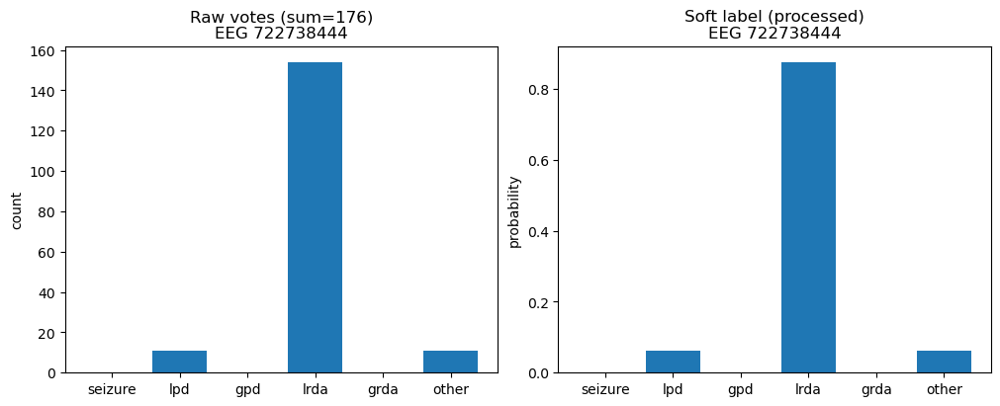

In [31]:
# pilih satu index contoh (atau pilih berdasarkan kondisi tertentu)
idx = 0   # ganti sesuai yang kamu mau
eeg_id = eeg_ids[idx]

fig, ax = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)

# bar: votes mentah
ax[0].bar(CLASSES, votes[idx])
ax[0].set_title(f"Raw votes (sum={int(vote_sum[idx,0])})\nEEG {eeg_id}")
ax[0].set_ylabel("count")

# bar: soft label (processed)
ax[1].bar(CLASSES, y_soft[idx])
ax[1].set_title(f"Soft label (processed)\nEEG {eeg_id}")
ax[1].set_ylabel("probability")

plt.show()

In [32]:
def entropy(p): 
    p = np.clip(p, 1e-8, 1.0); 
    return -np.sum(p*np.log(p), axis=1)

agree = y_soft.max(axis=1)
ent   = entropy(y_soft)

print({
  "agreement_mean_std": (float(agree.mean()), float(agree.std())),
  "entropy_mean_std"  : (float(ent.mean()), float(ent.std())),
  "HC_count"          : int(hc_mask.sum()),
  "w_conf_range"      : (float(w_conf.min()), float(w_conf.max())),
})

{'agreement_mean_std': (0.8083404898643494, 0.2123766839504242), 'entropy_mean_std': (0.45045050978660583, 0.4818446636199951), 'HC_count': 3284, 'w_conf_range': (0.10000000149011612, 1.5)}


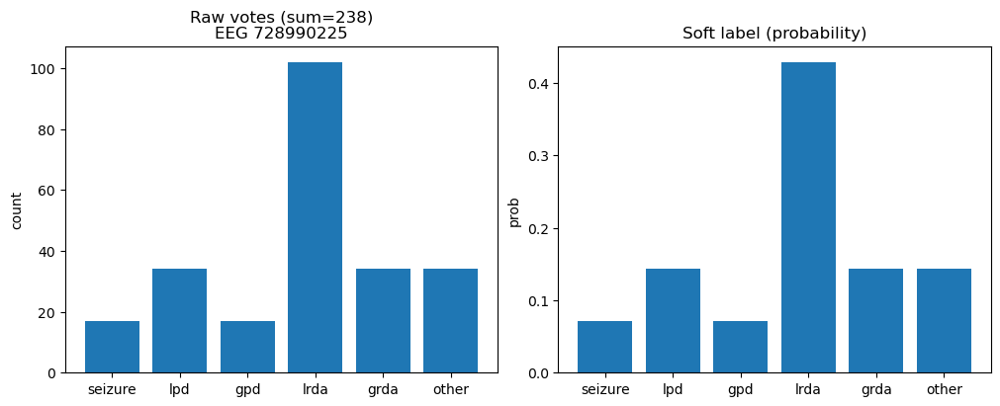

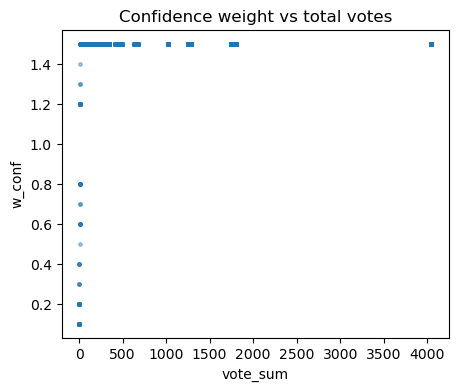

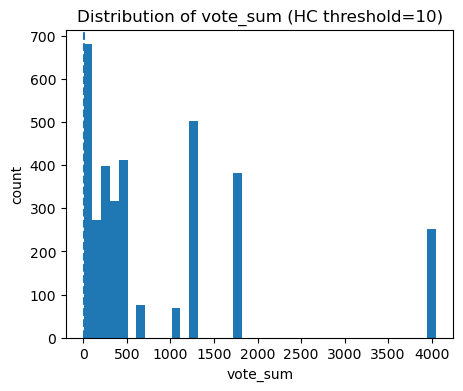

In [33]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
VOTE = [c+"_vote" for c in CLASSES]

# load
meta = pd.read_csv("data_package/meta_use.csv")
lbl  = np.load("data_package/labels.npz", allow_pickle=True)
y_soft, w_conf = lbl["y_soft"], lbl["w_conf"]

# rebuild votes (aggregated) untuk bar-chart sebelah kiri
from pathlib import Path
BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
train = pd.read_csv(BASE/"train.csv", usecols=["eeg_id"]+VOTE).astype({"eeg_id":"int64"})
votes_agg = train.groupby("eeg_id")[VOTE].sum().reindex(meta.eeg_id.astype("int64")).fillna(0).to_numpy("float32")
vote_sum = votes_agg.sum(1, keepdims=True); vote_sum[vote_sum==0]=1.0

# pilih sampel paling ambigu (entropy tinggi)
def entropy(p): 
    p = np.clip(p,1e-8,1); 
    return -np.sum(p*np.log(p), axis=1)

ent = entropy(y_soft)
idx = int(np.argmax(ent))  # paling ambigu
eeg_id = int(meta.eeg_id.iloc[idx])

fig, ax = plt.subplots(1,2, figsize=(10,4), constrained_layout=True)
ax[0].bar(CLASSES, votes_agg[idx]); ax[0].set_title(f"Raw votes (sum={int(vote_sum[idx,0])})\nEEG {eeg_id}"); ax[0].set_ylabel("count")
ax[1].bar(CLASSES, y_soft[idx]);   ax[1].set_title("Soft label (probability)"); ax[1].set_ylabel("prob")
plt.show()

# w_conf vs vote_sum (untuk slide confidence)
import matplotlib.pyplot as plt
plt.figure(figsize=(5,4))
plt.scatter(vote_sum.squeeze(), w_conf, s=6, alpha=0.4)
plt.xlabel("vote_sum"); plt.ylabel("w_conf"); plt.title("Confidence weight vs total votes")
plt.show()

# histogram vote_sum + garis HC=10
plt.figure(figsize=(5,4))
plt.hist(vote_sum.squeeze(), bins=40); plt.axvline(10, ls="--")
plt.title("Distribution of vote_sum (HC threshold=10)"); plt.xlabel("vote_sum"); plt.ylabel("count")
plt.show()

contoh eeg_id per kelas: {'seizure': 2260976638, 'lpd': 736446371, 'gpd': 3754383055, 'lrda': 722738444, 'grda': 1589311421, 'other': 86185603}


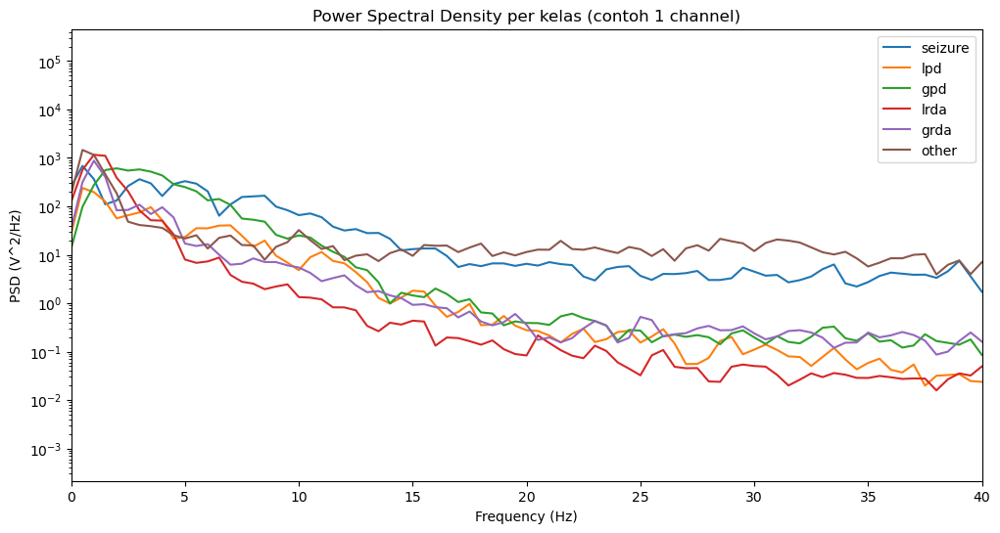

In [34]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.signal import welch
from pathlib import Path

# --- path ke dataset
BASE_DIR = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR = BASE_DIR / "train_eegs"
meta = pd.read_csv("data_package/meta_use.csv")   # manifest yang sudah kamu pakai
lbl  = np.load("data_package/labels.npz", allow_pickle=True)
y_soft = lbl["y_soft"]

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]

# --- pilih contoh dari tiap kelas (pakai argmax soft label)
examples = {}
for ci, cname in enumerate(CLASSES):
    idxs = np.where(y_soft.argmax(1) == ci)[0]
    if len(idxs) > 0:
        examples[cname] = int(meta.iloc[idxs[0]].eeg_id)

print("contoh eeg_id per kelas:", examples)

# --- fungsi PSD (Welch)
def compute_psd(sig, fs=200):
    f, Pxx = welch(sig, fs=fs, nperseg=fs*2)  # 2 detik window
    return f, Pxx

# --- plot PSD per kelas (1 channel saja biar simpel, misal Fp1 kalau ada)
plt.figure(figsize=(12,6))
for cname, eeg_id in examples.items():
    df = pd.read_parquet(EEG_DIR/f"{eeg_id}.parquet", engine="pyarrow")
    ch = [c for c in df.columns if c.upper()!="EKG"][0]   # pilih channel pertama non-EKG
    sig = df[ch].values[:2000]   # ambil 10 detik pertama
    f, Pxx = compute_psd(sig)
    plt.semilogy(f, Pxx, label=cname)

plt.xlim(0,40)   # fokus ke 0–40 Hz
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD (V^2/Hz)")
plt.title("Power Spectral Density per kelas (contoh 1 channel)")
plt.legend()
plt.show()

In [35]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from scipy.signal import welch
from pathlib import Path

# ===== Paths & data =====
BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR = BASE / "train_eegs"

meta = pd.read_csv("data_package/meta_use.csv")
lbl  = np.load("data_package/labels.npz", allow_pickle=True)
y_soft = lbl["y_soft"]

CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
fs = 200
N_PER_CLASS = 20   # ambil contoh maksimal per kelas

# ===== helper =====
BANDS = {
    "delta": (1,4),
    "theta": (4,8),
    "alpha": (8,13),
    "beta" : (13,30),
}

def bandpower_from_eeg(df, fs=200, nperseg=400):
    # rata di semua channel non-EKG untuk 10 detik pertama
    chs = [c for c in df.columns if c.upper() != "EKG"]
    X = df[chs].values[:fs*10].astype("float32")         # [T, C]
    P_list = []
    for c in range(X.shape[1]):
        f, Pxx = welch(X[:,c], fs=fs, nperseg=nperseg)   # Pxx: power/Hz
        P_list.append(Pxx)
    P = np.mean(np.vstack(P_list), axis=0)               # rata channel → [F]
    return f, P

def integrate_band(f, P, f1, f2):
    m = (f >= f1) & (f < f2)
    if not np.any(m): return 0.0
    return float(np.trapz(P[m], f[m]))

# ===== pilih sampel per kelas =====
examples = {}
for ci, cname in enumerate(CLASSES):
    idxs = np.where(y_soft.argmax(1) == ci)[0]
    if len(idxs):
        examples[cname] = meta.iloc[idxs[:N_PER_CLASS]].eeg_id.astype(int).tolist()

print({k: len(v) for k,v in examples.items()})

# ===== hitung bandpower =====
rows = []
for cname, ids in examples.items():
    for eid in ids:
        df = pd.read_parquet(EEG_DIR/f"{eid}.parquet", engine="pyarrow")
        f, P = bandpower_from_eeg(df, fs=fs)
        row = {"class": cname, "eeg_id": eid}
        total = 0.0
        for b, (a,z) in BANDS.items():
            bp = integrate_band(f, P, a, z)
            row[b] = bp
            total += bp
        # opsional: normalisasi ke proporsi (biar perbandingan antar kelas enak)
        for b in BANDS.keys():
            row[b+"_prop"] = row[b] / (total + 1e-12)
        rows.append(row)

bp_df = pd.DataFrame(rows)
bp_df.head()

{'seizure': 20, 'lpd': 20, 'gpd': 20, 'lrda': 20, 'grda': 20, 'other': 20}


C:\Users\numpppy\AppData\Local\Temp\ipykernel_25504\2468399509.py:39: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(P[m], f[m]))
C:\Users\numpppy\AppData\Local\Temp\ipykernel_25504\2468399509.py:39: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(P[m], f[m]))
C:\Users\numpppy\AppData\Local\Temp\ipykernel_25504\2468399509.py:39: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(P[m], f[m]))
C:\Users\numpppy\AppData\Local\Temp\ipykernel_25504\2468399509.py:39: DeprecationWarning: `trapz` is deprecated. Use `trapezoid` instead, or one of the numerical integration functions in `scipy.integrate`.
  return float(np.trapz(P[m], f[m]))
C:\Users\numpppy\AppData\Loc

,class,eeg_id,delta,theta,alpha,beta,delta_prop,theta_prop,alpha_prop,beta_prop
0,seizure,2260976638,253.887915,345.631968,189.110437,107.022364,0.283467,0.385900,0.211143,0.119491
1,seizure,2260976638,253.887915,345.631968,189.110437,107.022364,0.283467,0.385900,0.211143,0.119491
2,seizure,2260976638,253.887915,345.631968,189.110437,107.022364,0.283467,0.385900,0.211143,0.119491
3,seizure,2260976638,253.887915,345.631968,189.110437,107.022364,0.283467,0.385900,0.211143,0.119491
4,seizure,2480137055,280.615674,362.515633,189.720966,106.910188,0.298603,0.385752,0.201882,0.113763


In [36]:
summ = (bp_df
        .groupby("class")[[b+"_prop" for b in BANDS]]
        .agg(["mean","std"]))
print(summ.round(3))

        delta_prop        theta_prop        alpha_prop        beta_prop       
              mean    std       mean    std       mean    std      mean    std
class                                                                         
gpd          0.806  0.067      0.137  0.065      0.037  0.006     0.020  0.005
grda         0.792  0.018      0.101  0.009      0.028  0.003     0.079  0.023
lpd          0.376  0.286      0.219  0.136      0.145  0.094     0.259  0.321
lrda         0.822  0.142      0.087  0.045      0.054  0.055     0.037  0.042
other        0.792  0.081      0.092  0.027      0.033  0.018     0.084  0.049
seizure      0.545  0.275      0.241  0.149      0.124  0.081     0.090  0.073


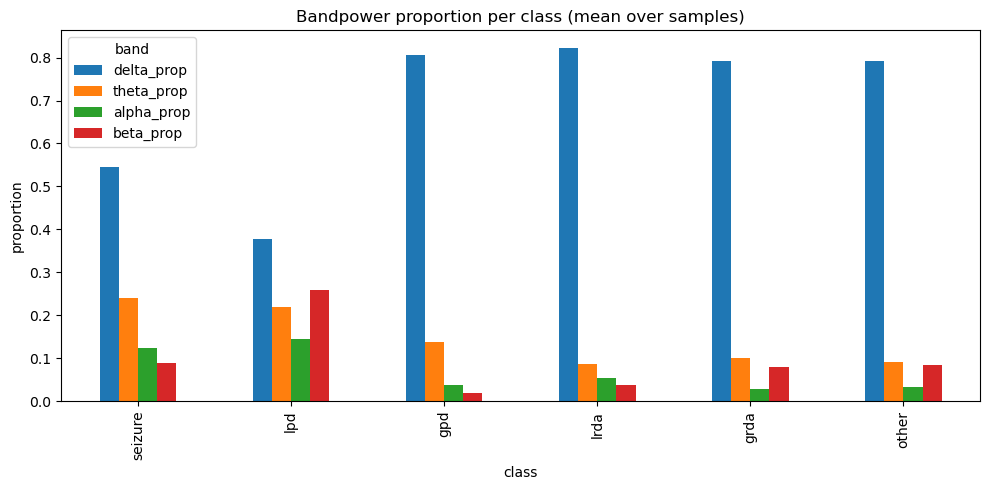

In [37]:
props = (bp_df.groupby("class")[[b+"_prop" for b in BANDS]].mean()
         .loc[CLASSES])  # urut sesuai daftar kelas

props.plot(kind="bar", figsize=(10,5))
plt.title("Bandpower proportion per class (mean over samples)")
plt.ylabel("proportion")
plt.xlabel("class")
plt.legend(title="band")
plt.tight_layout()
plt.show()

In [38]:
from pathlib import Path
import pandas as pd, numpy as np

BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR  = BASE / "train_eegs"
SPEC_DIR = BASE / "train_spectrograms"
TRAIN    = BASE / "train.csv"

assert TRAIN.exists() and EEG_DIR.exists() and SPEC_DIR.exists(), "Cek path BASE!"

train = pd.read_csv(TRAIN, usecols=["eeg_id","patient_id","spectrogram_id",
                                    "seizure_vote","lpd_vote","gpd_vote","lrda_vote","grda_vote","other_vote"])
all_ids = set(train.eeg_id.astype(int))
print("Total unique eeg_id:", len(all_ids))  # ~17089

Total unique eeg_id: 17089


In [39]:
SPEC_OUT = Path("spec_hr_out"); SPEC_OUT.mkdir(exist_ok=True)
WAVE_OUT = Path("wave_hr_out"); WAVE_OUT.mkdir(exist_ok=True)

def robust_log(x):  # sama seperti sebelumnya
    return np.log1p(np.maximum(x,0)).astype("float32")

def normalize_01(x, pct=(1,99)):
    x = robust_log(x)
    vmin, vmax = np.nanpercentile(x, pct)
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
        return np.zeros_like(x, dtype="float32")
    y = (x - vmin) / (vmax - vmin + 1e-8)
    return np.clip(y, 0.0, 1.0).astype("float32")

In [40]:
spec_done = {int(p.stem.split("_hr")[0]) for p in SPEC_OUT.glob("*_hr.npz")}
wave_done = {int(p.stem.split("_hr")[0]) for p in WAVE_OUT.glob("*_hr.npz")}

todo_spec = sorted(all_ids - spec_done)
todo_wave = sorted(all_ids - wave_done)
print("SPEC to-do:", len(todo_spec), " | WAVE to-do:", len(todo_wave))

SPEC to-do: 16894  | WAVE to-do: 16894


In [41]:
import pandas as pd, numpy as np

def your_spec_mapping_from_parquet(eeg_id: int):
    # === GANTI DENGAN FUNGSIMU SENDIRI ===
    # return x_raw: np.ndarray [4,F,T], freqs: np.ndarray [F]
    raise NotImplementedError("Isi dengan util kamu -> (x[4,F,T], freqs)")

def save_spec_npz(eid, x, freqs, pid):
    np.savez(SPEC_OUT/f"{eid}_hr.npz",
             x=x.astype("float32"), freqs=freqs.astype("float32"),
             eeg_id=np.int64(eid), patient_id=np.int64(pid))

ok=fail=0
for i,eid in enumerate(todo_spec, 1):
    try:
        x_raw, freqs = your_spec_mapping_from_parquet(eid)
        x = normalize_01(x_raw)           # 0–1
        pid = int(train.loc[train.eeg_id==eid, "patient_id"].iloc[0])
        save_spec_npz(eid, x, freqs, pid)
        ok += 1
    except Exception as e:
        fail += 1
        print(f"[SPEC FAIL] {eid}: {e}")
    if (ok+fail) % 200 == 0:
        print(f"[SPEC] progress: ok={ok} fail={fail}")

print(f"[SPEC] DONE: ok={ok} fail={fail}")

[SPEC FAIL] 568657: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 582999: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 642382: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 751790: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 778705: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 1629671: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 1895581: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2061593: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2078097: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2366870: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2482631: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2521897: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 2918824: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 3108700: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 3625731: Isi dengan util kamu -> (x[4,F,T], freqs)
[SPEC FAIL] 3851658: Isi dengan util kamu -> (x[4,F,T], freq

In [42]:
# ================================ SETUP =======================================
from pathlib import Path
import numpy as np, pandas as pd
from scipy.signal import butter, filtfilt, stft
from sklearn.model_selection import GroupKFold

# ---- PATHS
BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
EEG_DIR  = BASE / "train_eegs"
TRAIN    = BASE / "train.csv"

SPEC_OUT = Path("spec_hr_out"); SPEC_OUT.mkdir(exist_ok=True, parents=True)
WAVE_OUT = Path("wave_hr_out"); WAVE_OUT.mkdir(exist_ok=True, parents=True)
PKG_DIR  = Path("data_package"); PKG_DIR.mkdir(exist_ok=True, parents=True)

assert TRAIN.exists() and EEG_DIR.exists(), "Periksa BASE/train.csv & BASE/train_eegs/"
train = pd.read_csv(TRAIN, usecols=[
    "eeg_id","patient_id","spectrogram_id",
    "seizure_vote","lpd_vote","gpd_vote","lrda_vote","grda_vote","other_vote"
])
all_ids = set(train.eeg_id.astype(int).unique())
print("Total unique eeg_id:", len(all_ids))

# ---- LABEL CONFIG
CLASSES = ["seizure","lpd","gpd","lrda","grda","other"]
VOTE_COLS = [c+"_vote" for c in CLASSES]

# ============================ HELPER: WAVEFORM ================================
def bandpass_filter(sig, fs=200, low=0.5, high=20, order=4, clip_val=250):
    nyq = 0.5*fs
    b, a = butter(order, [low/nyq, high/nyq], btype="band")
    y = filtfilt(b, a, sig).astype("float32")
    if clip_val is not None:
        y = np.clip(y, -clip_val, clip_val)
    return y

CHAIN_DEF = {
    "LL": [("Fp1","F7"), ("F7","T3"), ("T3","T5"), ("T5","O1")],
    "LP": [("Fp1","F3"), ("F3","C3"), ("C3","P3"), ("P3","O1")],
    "RL": [("Fp2","F8"), ("F8","T4"), ("T4","T6"), ("T6","O2")],
    "RP": [("Fp2","F4"), ("F4","C4"), ("C4","P4"), ("P4","O2")],
}

def preprocess_eeg_df(eeg_df, fs=200):
    out = {}
    for ch in eeg_df.columns:
        if ch.upper() == "EKG": 
            continue
        out[ch] = bandpass_filter(eeg_df[ch].values, fs=fs)
    return pd.DataFrame(out)

def make_diff(df, a, b):
    if a not in df.columns or b not in df.columns:
        return None
    return (df[a].to_numpy("float32") - df[b].to_numpy("float32"))

def double_banana_montage(eeg_df: pd.DataFrame):
    out = {}
    for name, pairs in CHAIN_DEF.items():
        segs = []
        for a,b in pairs:
            d = make_diff(eeg_df, a, b)
            if d is not None: segs.append(d)
        if len(segs): 
            out[name] = np.mean(np.stack(segs, axis=0), axis=0).astype("float32")
    # fallback jika ada chain hilang
    for k in ["LL","LP","RL","RP"]:
        if k not in out: 
            out[k] = np.zeros(len(eeg_df), dtype="float32")
    return out

def your_wave_10s_from_parquet(eeg_id: int, fs=200, seconds=10):
    df = pd.read_parquet(EEG_DIR/f"{eeg_id}.parquet", engine="pyarrow")
    df = preprocess_eeg_df(df, fs=fs)
    chains = double_banana_montage(df)
    n = fs*seconds
    x = np.stack([chains["LL"][:n], chains["LP"][:n], chains["RL"][:n], chains["RP"][:n]], axis=0)  # [4,T]
    return x.astype("float32"), fs

# =========================== HELPER: SPECTROGRAM ==============================
def robust_log(x):
    return np.log1p(np.maximum(x,0)).astype("float32")

def normalize_01(x, pct=(1,99)):
    x = robust_log(x)
    vmin, vmax = np.nanpercentile(x, pct)
    if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
        return np.zeros_like(x, dtype="float32")
    y = (x - vmin) / (vmax - vmin + 1e-8)
    return np.clip(y, 0.0, 1.0).astype("float32")

def make_spec_hr_from_signal(sig, fs=200, win_s=2.0, hop_s=0.16, fmax=40.0):
    nperseg = int(fs*win_s)
    noverlap = int(nperseg - fs*hop_s)
    f, t, Z = stft(sig.astype("float32"), fs=fs, nperseg=nperseg, noverlap=noverlap, boundary=None, padded=False)
    m = (f >= 0) & (f <= fmax)
    f = f[m]
    X = (np.abs(Z[m])**2).astype("float32")  # [F,T]
    return X, f.astype("float32")            # power spectrogram

def your_spec_mapping_from_parquet(eeg_id: int, fs=200):
    df = pd.read_parquet(EEG_DIR/f"{eeg_id}.parquet", engine="pyarrow")
    df = preprocess_eeg_df(df, fs=fs)
    chains = double_banana_montage(df)
    Xs, freqs = [], None
    for k in ["LL","LP","RL","RP"]:
        Xi, f = make_spec_hr_from_signal(chains[k], fs=fs)
        Xs.append(Xi)
        if freqs is None: freqs = f
    x = np.stack(Xs, axis=0)  # [4,F,T]
    return x, freqs

# ============================ BATCH: SPECTROGRAM ==============================
spec_done = {int(p.stem.split("_hr")[0]) for p in SPEC_OUT.glob("*_hr.npz")}
todo_spec = sorted(all_ids - spec_done)
ok=fail=0
for eid in todo_spec:
    try:
        x_raw, freqs = your_spec_mapping_from_parquet(eid, fs=200)
        x = normalize_01(x_raw)  # [0,1]
        pid = int(train.loc[train.eeg_id==eid, "patient_id"].iloc[0])
        np.savez(SPEC_OUT/f"{eid}_hr.npz",
                 x=x.astype("float32"), freqs=freqs.astype("float32"),
                 eeg_id=np.int64(eid), patient_id=np.int64(pid))
        ok += 1
    except Exception as e:
        fail += 1
        print(f"[SPEC FAIL] {eid}: {e}")
    if (ok+fail) % 200 == 0:
        print(f"[SPEC] progress: ok={ok} fail={fail}")
print(f"[SPEC] DONE: ok={ok} fail={fail}")

# ============================== BATCH: WAVEFORM ===============================
wave_done = {int(p.stem.split("_hr")[0]) for p in WAVE_OUT.glob("*_hr.npz")}
todo_wave = sorted(all_ids - wave_done)
ok=fail=0
for eid in todo_wave:
    try:
        x, fs = your_wave_10s_from_parquet(eid, fs=200, seconds=10)  # [4,2000]
        pid = int(train.loc[train.eeg_id==eid, "patient_id"].iloc[0])
        np.savez(WAVE_OUT/f"{eid}_hr.npz",
                 x=x.astype("float32"), fs=np.int64(fs),
                 eeg_id=np.int64(eid), patient_id=np.int64(pid))
        ok += 1
    except Exception as e:
        fail += 1
        print(f"[WAVE FAIL] {eid}: {e}")
    if (ok+fail) % 200 == 0:
        print(f"[WAVE] progress: ok={ok} fail={fail}")
print(f"[WAVE] DONE: ok={ok} fail={fail}")

# ============================== MANIFEST (SYNC) ===============================
spec_ids = {int(p.stem.split("_hr")[0]) for p in SPEC_OUT.glob("*_hr.npz")}
wave_ids = {int(p.stem.split("_hr")[0]) for p in WAVE_OUT.glob("*_hr.npz")}
both_ids = sorted(spec_ids & wave_ids)

meta_use = (train[["eeg_id","patient_id","spectrogram_id"]]
            .drop_duplicates("eeg_id")
            .query("eeg_id in @both_ids")
            .reset_index(drop=True))
meta_use.to_csv(PKG_DIR/"meta_use.csv", index=False)
print("meta_use rows:", len(meta_use), "| unique eeg_id:", meta_use.eeg_id.nunique())

# ============================== LABELS (BUILD) ================================
agg = (train.groupby("eeg_id")[VOTE_COLS].sum()
       .reindex(meta_use.eeg_id.astype(int))
       .fillna(0).astype("float32").to_numpy())

vote_sum = agg.sum(1, keepdims=True)
vote_sum[vote_sum==0] = 1.0
y_soft = (agg / vote_sum).astype("float32")

vs = vote_sum.squeeze()
w_linear = np.clip(vs/10.0, 0.1, 1.5).astype("float32")  # skema bobot
w_conf = w_linear
hc_mask = (vs >= 10)

np.savez(PKG_DIR/"labels.npz",
         y_soft=y_soft, w_conf=w_conf, hc_mask=hc_mask.astype(bool),
         classes=np.array(CLASSES), vote_sum=vs.astype("int32"))
print("labels.npz:", y_soft.shape, "| w_conf(min,max)=", (float(w_conf.min()), float(w_conf.max())), "| HC:", int(hc_mask.sum()))

# ============================== SPLITS (5-FOLD) ===============================
groups = meta_use.patient_id.values
gkf = GroupKFold(n_splits=5)
splits = list(gkf.split(meta_use, groups=groups))

np.savez(PKG_DIR/"splits.npz",
         **{f"train_{i}": tr for i,(tr,va) in enumerate(splits)},
         **{f"valid_{i}": va for i,(tr,va) in enumerate(splits)})
print("splits.npz saved (5 folds)")

# ============================== QC RINGKAS ====================================
report = {
  "meta_rows": int(len(meta_use)),
  "spec_files": int(len(spec_ids)),
  "wave_files": int(len(wave_ids)),
  "ids_with_both": int(len(both_ids)),
  "y_soft_shape": tuple(y_soft.shape),
  "w_conf_minmax": (float(w_conf.min()), float(w_conf.max())),
  "HC_count": int(hc_mask.sum()),
}
import json; print(json.dumps(report, indent=2))

Total unique eeg_id: 17089


C:\Users\numpppy\anaconda3\Lib\site-packages\numpy\lib\_nanfunctions_impl.py:1437: RuntimeWarning: All-NaN slice encountered
  return _nanquantile_unchecked(


[SPEC] progress: ok=200 fail=0
[SPEC] progress: ok=400 fail=0
[SPEC] progress: ok=600 fail=0
[SPEC] progress: ok=800 fail=0
[SPEC] progress: ok=1000 fail=0
[SPEC] progress: ok=1200 fail=0
[SPEC] progress: ok=1400 fail=0
[SPEC] progress: ok=1600 fail=0
[SPEC] progress: ok=1800 fail=0
[SPEC] progress: ok=2000 fail=0
[SPEC] progress: ok=2200 fail=0
[SPEC] progress: ok=2400 fail=0
[SPEC] progress: ok=2600 fail=0
[SPEC] progress: ok=2800 fail=0
[SPEC] progress: ok=3000 fail=0
[SPEC] progress: ok=3200 fail=0
[SPEC] progress: ok=3400 fail=0
[SPEC] progress: ok=3600 fail=0
[SPEC] progress: ok=3800 fail=0
[SPEC] progress: ok=4000 fail=0
[SPEC] progress: ok=4200 fail=0
[SPEC] progress: ok=4400 fail=0
[SPEC] progress: ok=4600 fail=0
[SPEC] progress: ok=4800 fail=0
[SPEC] progress: ok=5000 fail=0
[SPEC] progress: ok=5200 fail=0
[SPEC] progress: ok=5400 fail=0
[SPEC] progress: ok=5600 fail=0
[SPEC] progress: ok=5800 fail=0
[SPEC] progress: ok=6000 fail=0
[SPEC] progress: ok=6200 fail=0
[SPEC] progr

In [10]:
from pathlib import Path
import pandas as pd, numpy as np

BASE = Path.home() / "Downloads" / "hms-harmful-brain-activity-classification"
TRAIN = BASE / "train.csv"
EEG_DIR = BASE / "train_eegs"

train = pd.read_csv(TRAIN)

# 1. total baris segmen
n_rows = len(train)

# 2. unique eeg_id
uniq_ids = train.eeg_id.unique()
n_ids = len(uniq_ids)

# 3. cek hasil preprocessing
spec_files = list(Path("spec_hr_out").glob("*_hr.npz"))
wave_files = list(Path("wave_hr_out").glob("*_hr.npz"))

n_spec = len(spec_files)
n_wave = len(wave_files)

# 4. meta_use
meta = pd.read_csv("data_package/meta_use.csv")
n_meta = len(meta)

# 5. cross-check apakah semua meta_use eeg_id ada di train.csv
missing_ids = set(meta.eeg_id) - set(uniq_ids)

print(f"Train.csv rows        : {n_rows}")
print(f"Unique eeg_id in train: {n_ids}")
print(f"Spec npz files        : {n_spec}")
print(f"Wave npz files        : {n_wave}")
print(f"meta_use rows         : {n_meta}")
print(f"Missing IDs in train? : {len(missing_ids)} -> {missing_ids if missing_ids else 'OK, none'}")

Train.csv rows        : 106800
Unique eeg_id in train: 17089
Spec npz files        : 17089
Wave npz files        : 17089
meta_use rows         : 17089
Missing IDs in train? : 0 -> OK, none


In [2]:
pip install timm

  Using cached timm-1.0.20-py3-none-any.whl.metadata (61 kB)
  Using cached huggingface_hub-0.35.1-py3-none-any.whl.metadata (14 kB)
  Using cached safetensors-0.6.2-cp38-abi3-win_amd64.whl.metadata (4.1 kB)
Using cached timm-1.0.20-py3-none-any.whl (2.5 MB)
Using cached huggingface_hub-0.35.1-py3-none-any.whl (563 kB)
Using cached safetensors-0.6.2-cp38-abi3-win_amd64.whl (320 kB)

   ---------- ----------------------------- 1/4 [fsspec]
   ---------- ----------------------------- 1/4 [fsspec]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   -------------------- ------------------- 2/4 [huggingface_hub]
   ------------------------------ ----

In [11]:
from torch.utils.data import Dataset
import torch, numpy as np

class SpecDataset(Dataset):
    def __init__(self, df, root_dir, y_soft, weights=None,
                 ids_col="eeg_id", kind="hr", augment=False,
                 T_target=600):
        self.df = df.reset_index(drop=True)
        self.root = root_dir
        self.y = y_soft[df.index.values]
        self.w = None if weights is None else weights[df.index.values]
        self.kind = kind
        self.augment = augment
        self.T_target = T_target

    def _aug_xy_mask(self, x, n_patches=(1,8), patch=(8,16)):
        C,F,T = x.shape
        k = np.random.randint(n_patches[0], n_patches[1]+1)
        for _ in range(k):
            fh = np.random.randint(1, patch[0]+1)
            th = np.random.randint(1, patch[1]+1)
            f0 = np.random.randint(0, max(1,F-fh+1))
            t0 = np.random.randint(0, max(1,T-th+1))
            x[:, f0:f0+fh, t0:t0+th] = 0.0
        return x

    def _crop_or_pad(self, x):
        # x: [C,F,T]
        C,F,T = x.shape
        Tt = self.T_target
        if T > Tt:
            if self.augment:
                t0 = np.random.randint(0, T - Tt + 1)
            else:
                t0 = (T - Tt) // 2
            x = x[:, :, t0:t0+Tt]
        elif T < Tt:
            pad = np.zeros((C, F, Tt - T), dtype=x.dtype)
            x = np.concatenate([x, pad], axis=2)
        return x

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        r = self.df.iloc[i]
        z = np.load(self.root / f"{r.eeg_id}_{self.kind}.npz")
        x = z["x"]  # [4,F,T], 0–1
        x = self._crop_or_pad(x)

        if self.augment:
            if np.random.rand() < 0.5:  # brain-side flip (swap L<->R)
                x = x[[2,3,0,1],:,:]
            if np.random.rand() < 0.5:
                x = self._aug_xy_mask(x)

        x = torch.from_numpy(x).float()     # [C,F,T]
        y = torch.from_numpy(self.y[i]).float()  # [6]
        w = 1.0 if self.w is None else float(self.w[i])
        return x, y, w

In [46]:
import numpy as np

# --- load labels & weights ---
lbl     = np.load("data_package/labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]     # soft labels (N,6)
w_conf  = lbl["w_conf"]     # confidence weights (N,)
hc_mask = lbl["hc_mask"]    # high-confidence mask (N,)
classes = lbl["classes"]    # ["seizure","lpd",...]

print("y_soft shape:", y_soft.shape)
print("w_conf range:", w_conf.min(), w_conf.max())
print("HC samples:", hc_mask.sum())

y_soft shape: (17089, 6)
w_conf range: 0.1 1.5
HC samples: 10241


In [42]:
from torch.utils.data import Dataset
import torch, numpy as np

class SpecDataset(Dataset):
    def __init__(self, df, root_dir, y_soft, weights=None,
                 ids_col="eeg_id", kind="hr", augment=False):
        self.df = df.reset_index(drop=True)
        self.root = root_dir
        self.y = y_soft[df.index.values]
        self.w = None if weights is None else weights[df.index.values]
        self.kind = kind
        self.augment = augment

    def _aug_xy_mask(self, x, n_patches=(1,8), patch=(8,16)):
        # XY masking sederhana
        C,F,T = x.shape
        k = np.random.randint(n_patches[0], n_patches[1]+1)
        for _ in range(k):
            fh = np.random.randint(1, patch[0]+1)
            th = np.random.randint(1, patch[1]+1)
            f0 = np.random.randint(0, max(1,F-fh+1))
            t0 = np.random.randint(0, max(1,T-th+1))
            x[:, f0:f0+fh, t0:t0+th] = 0.0
        return x

    def __len__(self):
        return len(self.df)

    def __getitem__(self, i):
        r = self.df.iloc[i]
        path = self.root / f"{r.eeg_id}_{self.kind}.npz"
        z = np.load(path)
        x = z["x"]   # [4,F,T], normalized 0–1
        if self.augment:
            if np.random.rand() < 0.5:  # brain-side flip (swap L<->R)
                x = x[[2,3,0,1],:,:]
            if np.random.rand() < 0.5:  # XY masking
                x = self._aug_xy_mask(x)
        x = torch.from_numpy(x).float()     # [C,F,T]
        y = torch.from_numpy(self.y[i]).float()  # [6]
        w = 1.0 if self.w is None else float(self.w[i])
        return x, y, w

In [43]:
import torch, torch.nn as nn
from torch.utils.data import DataLoader
import timm

# --- Model: ConvNeXt-Tiny pretrained, stem diubah ke 4-channel
class SpecConvNeXt(nn.Module):
    def __init__(self, num_classes=6):
        super().__init__()
        self.backbone = timm.create_model('convnext_tiny', pretrained=True, in_chans=4)  # langsung 4 channel
        # head default sudah linear → num_classes; timm pakai 'num_classes' saat create_model
        if self.backbone.num_classes != num_classes:
            in_f = self.backbone.get_classifier().in_features
            self.backbone.reset_classifier(num_classes)  # buang head lama
            self.backbone.head = nn.Linear(in_f, num_classes)
    def forward(self, x):          # x: [B,4,F,T]
        # timm expects [B,C,H,W]; treat F as H, T as W
        return self.backbone(x)

def kl_loss_with_weights(logits, y_soft, w):
    logp = torch.log_softmax(logits, dim=1)
    kl = torch.sum(y_soft * (torch.log(y_soft + 1e-8) - logp), dim=1)  # KL(y || p)
    return torch.mean(kl * w)

device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = SpecConvNeXt(num_classes=6).to(device)
opt   = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=10)

# pakai SpecDataset kamu:
# dl_tr, dl_va = make_loaders(tr_idx, va_idx, batch=32, aug=True)

def run_epoch(dl, train=True):
    model.train(train)
    total = 0.0
    for x, y, w in dl:
        x,y,w = x.to(device), y.to(device), w.to(device)
        with torch.set_grad_enabled(train):
            logits = model(x)
            loss = kl_loss_with_weights(logits, y, w)
            if train:
                opt.zero_grad(); loss.backward(); nn.utils.clip_grad_norm_(model.parameters(), 5.0); opt.step()
        total += loss.item() * x.size(0)
    if train: sched.step()
    return total / len(dl.dataset)

In [44]:
import numpy as np

In [49]:
# wajib: pastikan SpecDataset, make_loaders, y_soft, w_conf, meta_use, splits sudah ada
from torch.utils.data import DataLoader

# untuk Windows/Jupyter: hindari macet
DL_WORKERS = 0  # kalau sudah lancar, baru coba naikkan ke 2–4

tr_idx, va_idx = np.load("data_package/splits.npz")["train_0"], np.load("data_package/splits.npz")["valid_0"]
dl_tr = DataLoader(SpecDataset(meta_use.iloc[tr_idx], Path("spec_hr_out"), y_soft, w_conf, augment=True),
                   batch_size=16, shuffle=True, num_workers=DL_WORKERS)
xb, yb, wb = next(iter(dl_tr))
print("batch shapes:", xb.shape, yb.shape, wb.shape, flush=True)

batch shapes: torch.Size([16, 4, 81, 600]) torch.Size([16, 6]) torch.Size([16])


In [ ]:
# ================== TRAINING LOOP (PRINT EPOCH METRICS) ==================
import time, numpy as np, torch, torch.nn as nn
from torch.utils.data import DataLoader

# ---- model: pakai ConvNeXt-Tiny (timm). Kalau timm tidak ada, fallback ke CNN kecil.
def get_model(num_classes=6, in_chans=4, device="cpu"):
    try:
        import timm
        model = timm.create_model("convnext_tiny", pretrained=True, in_chans=in_chans, num_classes=num_classes)
    except Exception as e:
        print("[WARN] timm tidak tersedia, fallback ke SmallCNN:", e)
        class SmallCNN(nn.Module):
            def __init__(self, in_ch=4, num_classes=6):
                super().__init__()
                self.net = nn.Sequential(
                    nn.Conv2d(in_ch, 32, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
                    nn.Conv2d(32, 64, 3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
                    nn.Conv2d(64, 128, 3, padding=1), nn.ReLU(), nn.AdaptiveAvgPool2d((1,1))
                )
                self.fc = nn.Linear(128, num_classes)
            def forward(self, x):
                x = self.net(x)
                x = x.flatten(1)
                return self.fc(x)
        model = SmallCNN(in_ch=in_ch, num_classes=num_classes)
    return model.to(device)

def kl_loss_with_weights(logits, y_soft, w):
    logp = torch.log_softmax(logits, dim=1)
    kl = torch.sum(y_soft * (torch.log(y_soft + 1e-8) - logp), dim=1)  # KL(y||p)
    return torch.mean(kl * w)

@torch.no_grad()
def eval_metrics(model, dl, device):
    model.eval()
    tot_kl=tot_acc=tot_soft=n=0.0
    for x,y,w in dl:
        x,y,w = x.to(device), y.to(device), w.to(device)
        logits = model(x)
        # KL
        logp  = torch.log_softmax(logits, dim=1)
        kl    = torch.sum(y * (torch.log(y + 1e-8) - logp), dim=1)
        # hard acc
        pred  = logits.argmax(1)
        targ  = y.argmax(1)
        acc   = (pred == targ).float()
        # soft acc (prob pada kelas mayoritas)
        softp = torch.softmax(logits, dim=1).gather(1, targ.unsqueeze(1)).squeeze(1)
        bs = x.size(0)
        tot_kl   += kl.sum().item()
        tot_acc  += acc.sum().item()
        tot_soft += softp.sum().item()
        n        += bs
    return tot_kl/n, tot_acc/n, tot_soft/n

# ========= DataLoader (pakai SpecDataset yang sudah kamu definisikan tadi) =========
DL_WORKERS = 0  # Windows/Jupyter: 0 dulu
BATCH = 16
T_TARGET = 600

sp = np.load("data_package/splits.npz")
tr_idx_all = sp["train_0"]
va_idx     = sp["valid_0"]

# Stage-1 pakai high-confidence
hc_mask_all = np.load("data_package/labels.npz")["hc_mask"]
tr_idx_hc = np.where(hc_mask_all[tr_idx_all])[0]    # posisi relatif dalam tr_idx_all
tr_idx_hc = tr_idx_all[tr_idx_hc]                   # index absolut ke meta_use

dl_tr_s1 = DataLoader(
    SpecDataset(meta_use.iloc[tr_idx_hc], Path("spec_hr_out"), y_soft, w_conf, augment=True, T_target=T_TARGET),
    batch_size=BATCH, shuffle=True, num_workers=DL_WORKERS, pin_memory=True
)
dl_va = DataLoader(
    SpecDataset(meta_use.iloc[va_idx], Path("spec_hr_out"), y_soft, w_conf, augment=False, T_target=T_TARGET),
    batch_size=BATCH, shuffle=False, num_workers=DL_WORKERS, pin_memory=True
)

device = "cuda" if torch.cuda.is_available() else "cpu"
model  = get_model(num_classes=6, in_chans=4, device=device)

# ========================= Stage-1 (HC only) =========================
opt   = torch.optim.AdamW(model.parameters(), lr=1e-3, weight_decay=1e-4)
sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=5)

print("\n===== STAGE 1: HC only (3–5 epoch) =====")
for ep in range(1, 6):
    model.train()
    t0=time.time(); run=cnt=0.0
    for x,y,w in dl_tr_s1:
        x,y,w = x.to(device), y.to(device), w.to(device)
        logits = model(x)
        loss   = kl_loss_with_weights(logits, y, w)
        opt.zero_grad(); loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 5.0)
        opt.step()
        run += loss.item()*x.size(0); cnt += x.size(0)
    sched.step()
    val_kl, val_acc, val_soft = eval_metrics(model, dl_va, device)
    print(f"[S1] ep{ep:02d} train_KL={run/cnt:.4f}  val_KL={val_kl:.4f}  val_acc={val_acc:.3f}  val_soft={val_soft:.3f}  time={time.time()-t0:.1f}s", flush=True)

# ========================= Stage-2 (FULL + w_conf) =========================
dl_tr_s2 = DataLoader(
    SpecDataset(meta_use.iloc[tr_idx_all], Path("spec_hr_out"), y_soft, w_conf, augment=True, T_target=T_TARGET),
    batch_size=BATCH, shuffle=True, num_workers=DL_WORKERS, pin_memory=True
)

opt   = torch.optim.AdamW(model.parameters(), lr=6e-4, weight_decay=1e-4)
sched = torch.optim.lr_scheduler.CosineAnnealingLR(opt, T_max=15)
best  = float("inf")

print("\n===== STAGE 2: FULL + weights (10–15 epoch) =====")
for ep in range(1, 16):
    model.train()
    t0=time.time(); run=cnt=0.0
    for x,y,w in dl_tr_s2:
        x,y,w = x.to(device), y.to(device), w.to(device)
        logits = model(x)
        loss   = kl_loss_with_weights(logits, y, w)
        opt.zero_grad(); loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), 5.0)
        opt.step()
        run += loss.item()*x.size(0); cnt += x.size(0)
    sched.step()

    val_kl, val_acc, val_soft = eval_metrics(model, dl_va, device)
    if val_kl < best:
        best = val_kl
        torch.save({"model": model.state_dict(), "best_val_KL": best}, "model_fold0.pt")
    print(f"[S2] ep{ep:02d} train_KL={run/cnt:.4f}  val_KL={val_kl:.4f}  val_acc={val_acc:.3f}  val_soft={val_soft:.3f}  best={best:.4f}  time={time.time()-t0:.1f}s", flush=True)

print("\nDone. Best val_KL (fold0):", best)


===== STAGE 1: HC only (3–5 epoch) =====
[S1] ep01 train_KL=1.8585  val_KL=1.2823  val_acc=0.415  val_soft=0.218  time=538.5s
[S1] ep02 train_KL=1.7517  val_KL=1.2960  val_acc=0.415  val_soft=0.216  time=79.1s
[S1] ep03 train_KL=1.7473  val_KL=1.2719  val_acc=0.415  val_soft=0.231  time=79.1s
[S1] ep04 train_KL=1.7445  val_KL=1.2749  val_acc=0.415  val_soft=0.223  time=78.8s
[S1] ep05 train_KL=1.7426  val_KL=1.2729  val_acc=0.415  val_soft=0.225  time=79.1s

===== STAGE 2: FULL + weights (10–15 epoch) =====
[S2] ep01 train_KL=1.1819  val_KL=1.2703  val_acc=0.415  val_soft=0.227  best=1.2703  time=331.8s
[S2] ep02 train_KL=1.1796  val_KL=1.2815  val_acc=0.415  val_soft=0.224  best=1.2703  time=125.0s
[S2] ep03 train_KL=1.1794  val_KL=1.2658  val_acc=0.415  val_soft=0.226  best=1.2658  time=126.6s
[S2] ep04 train_KL=1.1790  val_KL=1.2777  val_acc=0.415  val_soft=0.225  best=1.2658  time=125.0s
[S2] ep05 train_KL=1.1792  val_KL=1.2735  val_acc=0.415  val_soft=0.223  best=1.2658  time=309

In [51]:
from torch.utils.data import Dataset
import torch, numpy as np

class SpecDataset(Dataset):
    def __init__(self, df, root_dir, y_soft, weights=None,
                 ids_col="eeg_id", kind="hr", augment=False,
                 T_target=600, F_target=81):
        self.df = df.reset_index(drop=True)
        self.root = root_dir
        self.y = y_soft[df.index.values]
        self.w = None if weights is None else weights[df.index.values]
        self.kind = kind
        self.augment = augment
        self.T_target = T_target
        self.F_target = F_target
        self.freqs_ref = None  # akan diisi saat pertama kali load

    def _aug_xy_mask(self, x, n_patches=(1,8), patch=(8,16)):
        C,F,T = x.shape
        k = np.random.randint(n_patches[0], n_patches[1]+1)
        for _ in range(k):
            fh = np.random.randint(1, patch[0]+1)
            th = np.random.randint(1, patch[1]+1)
            f0 = np.random.randint(0, max(1,F-fh+1))
            t0 = np.random.randint(0, max(1,T-th+1))
            x[:, f0:f0+fh, t0:t0+th] = 0.0
        return x

    def _crop_or_pad_T(self, x):
        C,F,T = x.shape
        Tt = self.T_target
        if T > Tt:
            t0 = np.random.randint(0, T - Tt + 1) if self.augment else (T - Tt)//2
            x = x[:, :, t0:t0+Tt]
        elif T < Tt:
            pad = np.zeros((C, F, Tt - T), dtype=x.dtype)
            x = np.concatenate([x, pad], axis=2)
        return x

    def _resample_F(self, x, freqs_in):
        C, F, T = x.shape
        Ft = self.F_target
        if F == Ft:
            return x
        # tentukan grid target (pakai rentang frekuensi file ini)
        fmin, fmax = float(freqs_in.min()), float(freqs_in.max())
        if self.freqs_ref is None:
            self.freqs_ref = np.linspace(fmin, fmax, Ft, dtype=np.float32)
        freqs_tgt = self.freqs_ref
        # interpolasi per channel & per time-bin
        out = np.empty((C, Ft, T), dtype=x.dtype)
        for c in range(C):
            # x[c] shape [F,T]; lakukan per kolom waktu
            out[c] = np.vstack([
                np.interp(freqs_tgt, freqs_in, x[c,:,t]) for t in range(T)
            ]).T  # hasil vstack [T,Ft] → transpose ke [Ft,T]
        return out

    def __len__(self): return len(self.df)

    def __getitem__(self, i):
        r = self.df.iloc[i]
        z = np.load(self.root / f"{r.eeg_id}_{self.kind}.npz")
        x = z["x"]              # [4,F,T], 0–1
        freqs = z["freqs"]      # [F]
        x = self._resample_F(x, freqs.astype(np.float32))
        x = self._crop_or_pad_T(x)

        if self.augment:
            if np.random.rand() < 0.5:  # swap L/R
                x = x[[2,3,0,1],:,:]
            if np.random.rand() < 0.5:
                x = self._aug_xy_mask(x)

        x = torch.from_numpy(x).float()
        y = torch.from_numpy(self.y[i]).float()
        w = 1.0 if self.w is None else float(self.w[i])
        return x, y, w

In [52]:
DL_WORKERS=0
dl_tr = DataLoader(
    SpecDataset(meta_use.iloc[tr_idx], Path("spec_hr_out"), y_soft, w_conf, augment=True, T_target=600, F_target=81),
    batch_size=16, shuffle=True, num_workers=DL_WORKERS, pin_memory=True
)
xb, yb, wb = next(iter(dl_tr))
print(xb.shape)  # torch.Size([16, 4, 81, 600])

torch.Size([16, 4, 81, 600])


In [13]:
import numpy as np

lbl = np.load("data_package/labels.npz", allow_pickle=True)

per-class totals: {np.str_('seizure'): np.int64(2611), np.str_('lpd'): np.int64(2434), np.str_('gpd'): np.int64(1778), np.str_('lrda'): np.int64(1117), np.str_('grda'): np.int64(1962), np.str_('other'): np.int64(7184)}
per-class proportions: {np.str_('seizure'): np.float32(0.1528), np.str_('lpd'): np.float32(0.1425), np.str_('gpd'): np.float32(0.1041), np.str_('lrda'): np.float32(0.0654), np.str_('grda'): np.float32(0.1149), np.str_('other'): np.float32(0.4204)}


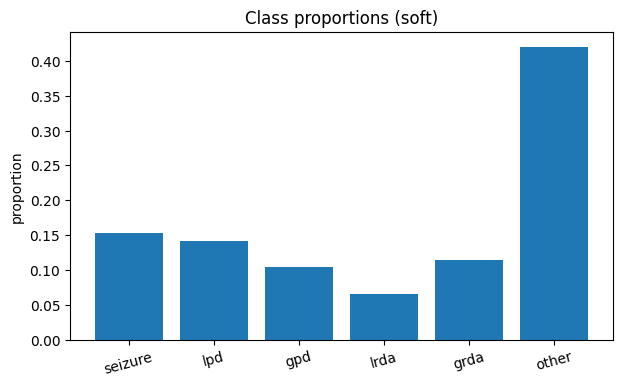

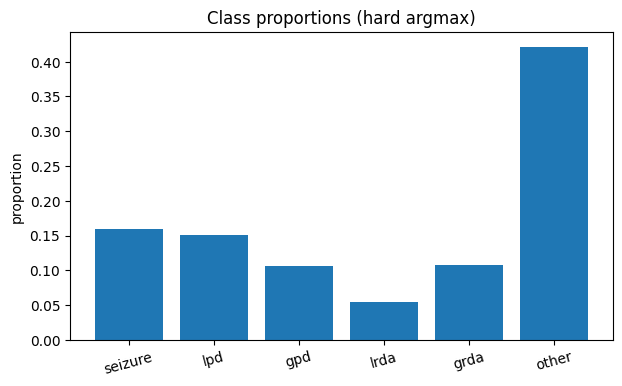

In [14]:
import numpy as np, pandas as pd
import matplotlib.pyplot as plt

# asumsi sudah:
# meta_use = pd.read_csv("data_package/meta_use.csv")
# lbl = np.load("data_package/labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]      # (N,6)
classes = [c for c in lbl["classes"]]  # ["seizure","lpd","gpd","lrda","grda","other"]

# total "massa" label per kelas (soft → jumlah probabilitas)
mass = y_soft.sum(axis=0)               # (6,)
prop = mass / mass.sum()

print("per-class totals:", dict(zip(classes, mass.astype(int))))
print("per-class proportions:", dict(zip(classes, np.round(prop,4))))

# bar chart proporsi
plt.figure(figsize=(7,4))
plt.bar(classes, prop)
plt.title("Class proportions (soft)")
plt.ylabel("proportion")
plt.xticks(rotation=15)
plt.show()

# hard-majority view buat perbandingan
hard = y_soft.argmax(1)
hard_counts = np.bincount(hard, minlength=len(classes))
plt.figure(figsize=(7,4))
plt.bar(classes, hard_counts / hard_counts.sum())
plt.title("Class proportions (hard argmax)")
plt.ylabel("proportion")
plt.xticks(rotation=15)
plt.show()

In [15]:
# setelah kamu hitung proporsi kelas (prop) dari y_soft
import torch, numpy as np

classes = [c for c in lbl["classes"]]
mass    = y_soft.sum(axis=0)            # total "massa" per kelas (soft)
freq    = mass / mass.sum()
cw      = 1.0 / (freq + 1e-6)           # inverse frequency
cw      = cw / cw.mean()                # rata-rata = 1 (stabil)

class_weights_t = torch.tensor(cw, dtype=torch.float32)

def kl_loss_weighted(logits, y, w_conf, class_weights=class_weights_t.to(logits.device)):
    # expected class-weight per sample: sum_k y_k * w_k
    w_class = (y * class_weights).sum(dim=1)          # (B,)
    logp = torch.log_softmax(logits, dim=1)
    kl   = torch.sum(y * (torch.log(y + 1e-8) - logp), dim=1)
    return (kl * w_class * w_conf).mean()

NameError: name 'logits' is not defined

In [16]:
# ============================
# 0) Imports & setup
# ============================
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import time
import math
import random

device = "cuda" if torch.cuda.is_available() else "cpu"
print("device:", device)

# reproducibility (opsional)
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

SPEC_DIR = Path("spec_hr_out")  # folder spectrogram NPZ
DATA_PKG = Path("data_package") # meta/labels/splits

# ============================
# 1) Load manifest, labels, splits
# ============================
meta_use = pd.read_csv(DATA_PKG/"meta_use.csv")

lbl = np.load(DATA_PKG/"labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]            # (N,6)
w_conf  = lbl["w_conf"]            # (N,)
hc_mask = lbl["hc_mask"]           # (N,)
classes = [c for c in lbl["classes"]]
print("Loaded:", meta_use.shape, y_soft.shape, w_conf.shape, sum(hc_mask))

sp = np.load(DATA_PKG/"splits.npz")
tr_idx, va_idx = sp["train_0"], sp["valid_0"]

# ============================
# 2) Class weights (imbalance handling)
# ============================
mass = y_soft.sum(axis=0)           # total "massa" soft per kelas
freq = mass / mass.sum()
cw = 1.0 / (freq + 1e-6)            # inverse frequency
cw = cw / cw.mean()                 # agar stabil (mean=1)
class_weights_t = torch.tensor(cw, dtype=torch.float32)
print("class weights (mean=1):", dict(zip(classes, np.round(cw,3))))

# ============================
# 3) Dataset (uniform size + augment)
# ============================
class SpecDataset(Dataset):
    """
    Membaca spec_hr_out/<eeg_id>_hr.npz
    Mengembalikan:
      x: float32 [C=4, F_target, T_target] (0..1)
      y: float32 [6]
      w: float32 scalar (confidence)
    """
    def __init__(self, df, root_dir, y_soft, weights=None, kind="hr",
                 augment=False, F_target=81, T_target=600):
        self.df = df.reset_index(drop=True)
        self.root = Path(root_dir)
        self.y_all = y_soft
        self.w_all = None if weights is None else weights
        self.kind = kind
        self.augment = augment
        self.F_target = F_target
        self.T_target = T_target

    def __len__(self):
        return len(self.df)

    def _xy_mask(self, x, n_patches=(1,6), patch=(8,24)):
        # masking sederhana pada [C,F,T]
        C,F,T = x.shape
        k = np.random.randint(n_patches[0], n_patches[1]+1)
        for _ in range(k):
            fh = np.random.randint(1, min(patch[0], F)+1)
            th = np.random.randint(1, min(patch[1], T)+1)
            f0 = np.random.randint(0, max(1, F-fh+1))
            t0 = np.random.randint(0, max(1, T-th+1))
            x[:, f0:f0+fh, t0:t0+th] = 0.0
        return x

    def _center_crop_pad(self, x, F_target, T_target):
        # x: [C,F,T], crop/pad ke target (center)
        C,F,T = x.shape
        # F
        if F >= F_target:
            f0 = (F - F_target)//2
            x = x[:, f0:f0+F_target, :]
        else:
            pad_f = F_target - F
            fpad0 = pad_f//2
            fpad1 = pad_f - fpad0
            x = np.pad(x, ((0,0),(fpad0,fpad1),(0,0)), mode="constant")
        # T
        if T >= T_target:
            t0 = (T - T_target)//2
            x = x[:, :, t0:t0+T_target]
        else:
            pad_t = T_target - T
            tpad0 = pad_t//2
            tpad1 = pad_t - tpad0
            x = np.pad(x, ((0,0),(0,0),(tpad0,tpad1)), mode="constant")
        return x

    def __getitem__(self, i):
        r = self.df.iloc[i]
        path = self.root / f"{int(r.eeg_id)}_{self.kind}.npz"
        z = np.load(path)
        x = z["x"]                    # [4,F,T], 0..1
        # uniform size
        x = self._center_crop_pad(x, self.F_target, self.T_target)

        # augment
        if self.augment:
            if np.random.rand() < 0.5:   # brain-side flip (swap L<->R)
                x = x[[2,3,0,1],:,:]
            if np.random.rand() < 0.5:   # XY masking
                x = self._xy_mask(x)

        y = self.y_all[self.df.index[i]].astype("float32")   # [6]
        w = 1.0 if self.w_all is None else float(self.w_all[self.df.index[i]])
        return torch.from_numpy(x).float(), torch.from_numpy(y).float(), torch.tensor(w, dtype=torch.float32)

# ============================
# 4) DataLoaders (opsional sampler)
# ============================
F_TARGET, T_TARGET = 81, 600
BATCH = 16
NUM_WORKERS = 0    # aman di Windows

USE_SAMPLER = False   # set True jika mau oversample minoritas

if USE_SAMPLER:
    w_per_sample = (y_soft * cw).sum(axis=1)
    w_per_sample = w_per_sample / w_per_sample.mean()
    sampler = WeightedRandomSampler(w_per_sample[tr_idx], num_samples=len(tr_idx), replacement=True)
    dl_tr = DataLoader(
        SpecDataset(meta_use.iloc[tr_idx], SPEC_DIR, y_soft, w_conf, augment=True, F_target=F_TARGET, T_target=T_TARGET),
        batch_size=BATCH, sampler=sampler, num_workers=NUM_WORKERS
    )
else:
    dl_tr = DataLoader(
        SpecDataset(meta_use.iloc[tr_idx], SPEC_DIR, y_soft, w_conf, augment=True, F_target=F_TARGET, T_target=T_TARGET),
        batch_size=BATCH, shuffle=True, num_workers=NUM_WORKERS
    )

dl_va = DataLoader(
    SpecDataset(meta_use.iloc[va_idx], SPEC_DIR, y_soft, w_conf, augment=False, F_target=F_TARGET, T_target=T_TARGET),
    batch_size=BATCH, shuffle=False, num_workers=NUM_WORKERS
)

xb, yb, wb = next(iter(dl_tr))
print("batch shapes:", xb.shape, yb.shape, wb.shape)

# ============================
# 5) Model (pakai punyamu jika tersedia)
# ============================
try:
    model = YourSpectrogramBackbone(num_classes=len(classes)).to(device)  # jika kamu sudah definisikan
    print("Using YourSpectrogramBackbone")
except NameError:
    # baseline ringan
    class SmallSpecCNN(nn.Module):
        def __init__(self, nc=4, ncls=6):
            super().__init__()
            self.net = nn.Sequential(
                nn.Conv2d(nc, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(),
                nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(),
                nn.MaxPool2d(2),   #  (F/2, T/2)
                nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
                nn.MaxPool2d(2),   #  (F/4, T/4)
                nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(),
                nn.AdaptiveAvgPool2d((1,1)),
            )
            self.head = nn.Linear(256, ncls)

        def forward(self, x):
            # x: [B,4,F,T] -> [B,4, F, T] (Conv2d expects channel first)
            x = self.net(x)
            x = x.view(x.size(0), -1)
            return self.head(x)
    model = SmallSpecCNN(nc=4, ncls=len(classes)).to(device)
    print("Using SmallSpecCNN baseline")

# ============================
# 6) MixUp + loss + metrics
# ============================
def mixup_batch(x, y, alpha=0.2):
    if alpha <= 0:
        return x, y
    lam = np.random.beta(alpha, alpha)
    perm = torch.randperm(x.size(0), device=x.device)
    return lam*x + (1-lam)*x[perm], lam*y + (1-lam)*y[perm]

def kl_loss_weighted(logits, y, w_conf, class_weights=class_weights_t):
    cw_local = class_weights.to(logits.device)
    w_class = (y * cw_local).sum(dim=1)                 # (B,)
    logp = torch.log_softmax(logits, dim=1)
    kl   = torch.sum(y * (torch.log(y + 1e-8) - logp), dim=1)
    return (kl * w_class * w_conf).mean()

@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    tot_loss = 0.0; n = 0
    correct = 0
    # balanced accuracy
    C = len(classes)
    conf = torch.zeros(C, C, dtype=torch.long)
    for x,y,w in loader:
        x,y,w = x.to(device), y.to(device), w.to(device)
        logits = model(x)
        loss = kl_loss_weighted(logits, y, w)
        tot_loss += loss.item()*x.size(0); n += x.size(0)

        pred = logits.argmax(1)
        true = y.argmax(1)
        correct += (pred==true).sum().item()
        for t,p in zip(true.cpu(), pred.cpu()):
            conf[t, p] += 1

    val_kl = tot_loss / max(1,n)
    acc = correct / max(1,n)
    recall = conf.diag().float() / conf.sum(1).clamp_min(1).float()
    bal_acc = recall.mean().item()
    return val_kl, acc, bal_acc

# ============================
# 7) Training loop (Stage-1 + Stage-2)
# ============================
opt  = torch.optim.AdamW(model.parameters(), lr=1.2e-3, weight_decay=1e-4)

# Stage-1: Hanya HC di train
hc_tr_mask = hc_mask[tr_idx]
idx_tr_s1 = tr_idx[hc_tr_mask]
dl_tr_s1 = DataLoader(
    SpecDataset(meta_use.iloc[idx_tr_s1], SPEC_DIR, y_soft, w_conf, augment=True, F_target=F_TARGET, T_target=T_TARGET),
    batch_size=BATCH, shuffle=True, num_workers=NUM_WORKERS
)
print(f"Stage-1 train size (HC): {len(idx_tr_s1)}  |  val size: {len(va_idx)}")

E1 = 5  # 3–5 epoch
print("\n===== STAGE 1: HC only =====")
for ep in range(1, E1+1):
    model.train()
    t0=time.time()
    run=cnt=0.0
    for x,y,w in dl_tr_s1:
        x,y,w = x.to(device), y.to(device), w.to(device)
        # MixUp ringan
        x,y = mixup_batch(x,y, alpha=0.2)
        logits = model(x)
        loss = kl_loss_weighted(logits, y, w)
        opt.zero_grad(); loss.backward(); opt.step()
        run += loss.item()*x.size(0); cnt += x.size(0)
    tr_kl = run/max(1,cnt)
    va_kl, va_acc, va_bal = evaluate(model, dl_va)
    print(f"[S1] ep{ep:02d} train_KL={tr_kl:.4f}  val_KL={va_kl:.4f}  val_acc={va_acc:.3f}  val_bal={va_bal:.3f}  time={time.time()-t0:.1f}s")

# Stage-2: FULL train set
opt = torch.optim.AdamW(model.parameters(), lr=6e-4, weight_decay=1e-4)
E2 = 10  # 10–15 epoch
print("\n===== STAGE 2: FULL + weights =====")
best = math.inf
for ep in range(1, E2+1):
    model.train()
    t0=time.time()
    run=cnt=0.0
    for x,y,w in dl_tr:
        x,y,w = x.to(device), y.to(device), w.to(device)
        x,y = mixup_batch(x,y, alpha=0.2)
        logits = model(x)
        loss = kl_loss_weighted(logits, y, w)
        opt.zero_grad(); loss.backward(); opt.step()
        run += loss.item()*x.size(0); cnt += x.size(0)
    tr_kl = run/max(1,cnt)
    va_kl, va_acc, va_bal = evaluate(model, dl_va)
    if va_kl < best:
        best = va_kl
        torch.save({"model": model.state_dict(), "best_val_KL": best}, "model_best_fold0.pt")
    print(f"[S2] ep{ep:02d} train_KL={tr_kl:.4f}  val_KL={va_kl:.4f}  val_acc={va_acc:.3f}  val_bal={va_bal:.3f}  best={best:.4f}  time={time.time()-t0:.1f}s")

device: cuda
Loaded: (17089, 3) (17089, 6) (17089,) 10241
class weights (mean=1): {np.str_('seizure'): np.float32(0.792), np.str_('lpd'): np.float32(0.85), np.str_('gpd'): np.float32(1.164), np.str_('lrda'): np.float32(1.851), np.str_('grda'): np.float32(1.054), np.str_('other'): np.float32(0.288)}
batch shapes: torch.Size([16, 4, 81, 600]) torch.Size([16, 6]) torch.Size([16])
Using SmallSpecCNN baseline
Stage-1 train size (HC): 8042  |  val size: 3418

===== STAGE 1: HC only =====
[S1] ep01 train_KL=0.9004  val_KL=1.0617  val_acc=0.420  val_bal=0.168  time=189.7s
[S1] ep02 train_KL=0.8806  val_KL=1.0498  val_acc=0.425  val_bal=0.167  time=240.9s
[S1] ep03 train_KL=0.8943  val_KL=1.0441  val_acc=0.425  val_bal=0.167  time=155.3s
[S1] ep04 train_KL=0.8925  val_KL=1.0500  val_acc=0.425  val_bal=0.167  time=66.4s
[S1] ep05 train_KL=0.8814  val_KL=1.0430  val_acc=0.425  val_bal=0.167  time=66.8s

===== STAGE 2: FULL + weights =====
[S2] ep01 train_KL=0.8895  val_KL=1.0490  val_acc=0.425  v

In [18]:
from pathlib import Path
import numpy as np, pandas as pd, torch, torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
import time, math, random

device = "cuda" if torch.cuda.is_available() else "cpu"
torch.manual_seed(42); np.random.seed(42); random.seed(42)

SPEC_DIR = Path("spec_hr_out")
DATA_PKG = Path("data_package")

F_TARGET, T_TARGET = 81, 600
BATCH = 16
NUM_WORKERS = 0      # Windows aman
USE_OVERSAMPLING = True
MIXUP_ALPHA = 0.4

In [19]:
meta_use = pd.read_csv(DATA_PKG/"meta_use.csv")

lbl = np.load(DATA_PKG/"labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]      # (N,6)
w_conf  = lbl["w_conf"]      # (N,)
hc_mask = lbl["hc_mask"]     # (N,)
classes = [c for c in lbl["classes"]]

sp = np.load(DATA_PKG/"splits.npz")
tr_idx, va_idx = sp["train_0"], sp["valid_0"]

print("Loaded:", meta_use.shape, y_soft.shape, w_conf.shape, sum(hc_mask))

Loaded: (17089, 3) (17089, 6) (17089,) 10241


In [20]:
class SpecDataset(Dataset):
    def __init__(self, df, root_dir, y_soft, weights=None, kind="hr",
                 augment=False, F_target=81, T_target=600):
        self.df = df.reset_index(drop=True)
        self.root = Path(root_dir)
        self.y_all = y_soft
        self.w_all = None if weights is None else weights
        self.kind = kind
        self.augment = augment
        self.F_target = F_target
        self.T_target = T_target

    def __len__(self): return len(self.df)

    def _xy_mask(self, x, n_patches=(1,6), patch=(8,24)):
        C,F,T = x.shape
        k = np.random.randint(n_patches[0], n_patches[1]+1)
        for _ in range(k):
            fh = np.random.randint(1, min(patch[0], F)+1)
            th = np.random.randint(1, min(patch[1], T)+1)
            f0 = np.random.randint(0, max(1, F-fh+1))
            t0 = np.random.randint(0, max(1, T-th+1))
            x[:, f0:f0+fh, t0:t0+th] = 0.0
        return x

    def _center_crop_pad(self, x, F_target, T_target):
        C,F,T = x.shape
        if F >= F_target:
            f0 = (F - F_target)//2; x = x[:, f0:f0+F_target, :]
        else:
            pad_f = F_target - F; f0 = pad_f//2; f1 = pad_f - f0
            x = np.pad(x, ((0,0),(f0,f1),(0,0)), mode="constant")
        if T >= T_target:
            t0 = (T - T_target)//2; x = x[:, :, t0:t0+T_target]
        else:
            pad_t = T_target - T; t0 = pad_t//2; t1 = pad_t - t0
            x = np.pad(x, ((0,0),(0,0),(t0,t1)), mode="constant")
        return x

    def __getitem__(self, i):
        r = self.df.iloc[i]
        z = np.load(self.root / f"{int(r.eeg_id)}_{self.kind}.npz")
        x = self._center_crop_pad(z["x"], self.F_target, self.T_target)  # [4,F,T] 0..1

        if self.augment:
            if np.random.rand() < 0.5: x = x[[2,3,0,1],:,:]   # brain-side flip
            if np.random.rand() < 0.5: x = self._xy_mask(x)

        y = self.y_all[self.df.index[i]].astype("float32")
        w = 1.0 if self.w_all is None else float(self.w_all[self.df.index[i]])
        return torch.from_numpy(x).float(), torch.from_numpy(y).float(), torch.tensor(w, dtype=torch.float32)

In [21]:
def make_sampler(indices, y_soft, gamma=1.2):
    mass = y_soft.sum(axis=0); freq = mass / mass.sum()
    cw = 1.0 / (freq + 1e-6); cw = cw / cw.mean()
    w_per_sample = (y_soft * cw).sum(axis=1).astype("float32")
    w_per_sample = (w_per_sample / w_per_sample.mean()) ** gamma
    return WeightedRandomSampler(w_per_sample[indices], num_samples=len(indices), replacement=True)

# DataLoader TRAIN (pakai sampler) & VALID (biasa)
if USE_OVERSAMPLING:
    sampler_tr = make_sampler(tr_idx, y_soft, gamma=1.2)
    dl_tr = DataLoader(
        SpecDataset(meta_use.iloc[tr_idx], SPEC_DIR, y_soft, w_conf, augment=True,
                    F_target=F_TARGET, T_target=T_TARGET),
        batch_size=BATCH, sampler=sampler_tr, num_workers=NUM_WORKERS
    )
else:
    dl_tr = DataLoader(
        SpecDataset(meta_use.iloc[tr_idx], SPEC_DIR, y_soft, w_conf, augment=True,
                    F_target=F_TARGET, T_target=T_TARGET),
        batch_size=BATCH, shuffle=True, num_workers=NUM_WORKERS
    )

dl_va = DataLoader(
    SpecDataset(meta_use.iloc[va_idx], SPEC_DIR, y_soft, w_conf, augment=False,
                F_target=F_TARGET, T_target=T_TARGET),
    batch_size=BATCH, shuffle=False, num_workers=NUM_WORKERS
)

xb, yb, wb = next(iter(dl_tr))
print("batch:", xb.shape, yb.shape, wb.shape)

batch: torch.Size([16, 4, 81, 600]) torch.Size([16, 6]) torch.Size([16])


In [22]:
try:
    model = YourSpectrogramBackbone(num_classes=len(classes)).to(device)
    print("Using YourSpectrogramBackbone")
except NameError:
    class SmallSpecCNN(nn.Module):
        def __init__(self, nc=4, ncls=6):
            super().__init__()
            self.feat = nn.Sequential(
                nn.Conv2d(nc, 32, 3, padding=1), nn.BatchNorm2d(32), nn.ReLU(),
                nn.Conv2d(32, 64, 3, padding=1), nn.BatchNorm2d(64), nn.ReLU(),
                nn.MaxPool2d(2),
                nn.Conv2d(64, 128, 3, padding=1), nn.BatchNorm2d(128), nn.ReLU(),
                nn.MaxPool2d(2),
                nn.Conv2d(128, 256, 3, padding=1), nn.BatchNorm2d(256), nn.ReLU(),
                nn.AdaptiveAvgPool2d((1,1)),
            )
            self.head = nn.Linear(256, ncls)
        def forward(self, x):
            x = self.feat(x); x = x.flatten(1); return self.head(x)
    model = SmallSpecCNN(nc=4, ncls=len(classes)).to(device)
    print("Using SmallSpecCNN baseline")

Using SmallSpecCNN baseline


In [24]:
# ==== deps & globals minimal ====
import numpy as np
import torch

# define kalau belum ada
try: MIXUP_ALPHA
except NameError: MIXUP_ALPHA = 0.4

try: device
except NameError:
    device = "cuda" if torch.cuda.is_available() else "cpu"

# sanity untuk classes (list nama kelas) — ganti kalau kamu sudah punya dari labels.npz
try: classes
except NameError:
    classes = ["seizure","lpd","gpd","lrda","grda","other"]

# ==== utils: mixup, loss, eval, inspect ====
def mixup_batch(x, y, alpha=MIXUP_ALPHA):
    if alpha is None or alpha <= 0:
        return x, y
    lam = np.random.beta(alpha, alpha)
    perm = torch.randperm(x.size(0), device=x.device)
    x2 = lam*x + (1-lam)*x[perm]
    y2 = lam*y + (1-lam)*y[perm]
    return x2, y2

def kl_loss_plain(logits, y, w_conf):
    # y: soft label (B,6) dengan row-sum≈1
    logp = torch.log_softmax(logits, dim=1)
    kl   = torch.sum(y * (torch.log(y + 1e-8) - logp), dim=1)  # (B,)
    return (kl * w_conf).mean()

@torch.no_grad()
def evaluate(model, loader):
    model.eval()
    tot_loss = 0.0; n = 0; correct = 0
    C = len(classes)
    conf = torch.zeros(C, C, dtype=torch.long)
    for x,y,w in loader:
        x,y,w = x.to(device), y.to(device), w.to(device)
        logits = model(x)
        loss = kl_loss_plain(logits, y, w)
        tot_loss += loss.item()*x.size(0); n += x.size(0)
        pred = logits.argmax(1); true = y.argmax(1)
        correct += (pred==true).sum().item()
        for t,p in zip(true.cpu(), pred.cpu()):
            conf[t,p]+=1
    val_kl = tot_loss / max(1,n)
    acc = correct / max(1,n)
    recall = conf.diag().float() / conf.sum(1).clamp_min(1).float()
    bal_acc = recall.mean().item()
    return val_kl, acc, bal_acc

@torch.no_grad()
def inspect_preds(model, loader, classes):
    model.eval()
    C = len(classes)
    conf = torch.zeros(C, C, dtype=torch.long)
    pred_count = torch.zeros(C, dtype=torch.long)
    true_count = torch.zeros(C, dtype=torch.long)
    for x,y,_ in loader:
        x,y = x.to(device), y.to(device)
        pred = model(x).argmax(1); true = y.argmax(1)
        for t,p in zip(true.cpu(), pred.cpu()):
            conf[t,p]+=1; pred_count[p]+=1; true_count[t]+=1
    recall = (conf.diag().float() / conf.sum(1).clamp_min(1).float()).numpy()
    print("pred dist:", {classes[i]: int(pred_count[i]) for i in range(C)})
    print("true dist:", {classes[i]: int(true_count[i]) for i in range(C)})
    print("recall   :", {classes[i]: float(np.round(recall[i],3)) for i in range(C)})

In [25]:
def kl_loss_plain(logits, y, w_conf):
    logp = torch.log_softmax(logits, dim=1)
    kl   = torch.sum(y * (torch.log(y + 1e-8) - logp), dim=1)
    return (kl * w_conf).mean()

def mixup_batch(x, y, alpha=0.4):
    if alpha <= 0: return x, y
    lam = np.random.beta(alpha, alpha)
    perm = torch.randperm(x.size(0), device=x.device)
    return lam*x + (1-lam)*x[perm], lam*y + (1-lam)*y[perm]

opt = torch.optim.AdamW(model.parameters(), lr=6e-4, weight_decay=1e-4)
best = float("inf")
print("\n===== STAGE 2 ONLY (5 epochs) =====")
for ep in range(1, E2+1):
    model.train(); t0=time.time(); run=cnt=0.0
    for x,y,w in dl_tr:
        x,y,w = x.to(device), y.to(device), w.to(device)
        x,y = mixup_batch(x,y, alpha=MIXUP_ALPHA)
        loss = kl_loss_plain(model(x), y, w)
        opt.zero_grad(); loss.backward(); opt.step()
        run += loss.item()*x.size(0); cnt += x.size(0)
    tr_kl = run/max(1,cnt)
    va_kl, va_acc, va_bal = evaluate(model, dl_va)
    if va_kl < best:
        best = va_kl
        torch.save({"model": model.state_dict(), "best_val_KL": best}, "model_best_fold0.pt")
    print(f"[S2] ep{ep:02d} train_KL={tr_kl:.4f}  val_KL={va_kl:.4f}  val_acc={va_acc:.3f}  val_bal={va_bal:.3f}  best={best:.4f}  time={time.time()-t0:.1f}s")


===== STAGE 2 ONLY (5 epochs) =====
[S2] ep01 train_KL=1.0329  val_KL=1.2563  val_acc=0.425  val_bal=0.167  best=1.2563  time=72.3s
[S2] ep02 train_KL=1.0124  val_KL=1.2612  val_acc=0.425  val_bal=0.167  best=1.2563  time=69.4s
[S2] ep03 train_KL=1.0118  val_KL=1.2733  val_acc=0.425  val_bal=0.167  best=1.2563  time=68.2s
[S2] ep04 train_KL=1.0062  val_KL=1.2488  val_acc=0.425  val_bal=0.167  best=1.2488  time=68.4s
[S2] ep05 train_KL=1.0073  val_KL=1.2568  val_acc=0.425  val_bal=0.167  best=1.2488  time=69.0s
[S2] ep06 train_KL=1.0291  val_KL=1.2620  val_acc=0.425  val_bal=0.167  best=1.2488  time=68.3s
[S2] ep07 train_KL=1.0099  val_KL=1.2532  val_acc=0.425  val_bal=0.167  best=1.2488  time=68.4s
[S2] ep08 train_KL=1.0274  val_KL=1.2520  val_acc=0.425  val_bal=0.167  best=1.2488  time=67.8s
[S2] ep09 train_KL=1.0059  val_KL=1.2516  val_acc=0.425  val_bal=0.167  best=1.2488  time=67.9s
[S2] ep10 train_KL=1.0182  val_KL=1.2501  val_acc=0.425  val_bal=0.167  best=1.2488  time=67.9s


In [27]:
from torch.utils.data import Sampler
rng = np.random.default_rng(42)

# pseudo-label dari soft label
y_hard = y_soft.argmax(1)
idx_by_cls = [np.where(y_hard[tr_idx]==k)[0] for k in range(6)]

class ClassBalancedBatchSampler(Sampler):
    def __init__(self, idx_global, idx_by_cls_local, batch_size, classes=6):
        assert batch_size % classes == 0
        self.idx_global = tr_idx  # mapping ke indeks global
        self.pcls = idx_by_cls_local
        self.kpb = batch_size // classes
    def __iter__(self):
        # shuffle per-class
        pools = [rng.permutation(p).tolist() for p in self.pcls]
        ptrs = [0]*len(pools)
        while True:
            batch_local = []
            for c in range(len(pools)):
                need = self.kpb
                if ptrs[c]+need > len(pools[c]): 
                    return
                batch_local += [pools[c][ptrs[c]+i] for i in range(need)]
                ptrs[c] += need
            # map lokal->global
            yield [self.idx_global[i] for i in batch_local]
    def __len__(self):  # approx
        return min(len(p)//self.kpb for p in idx_by_cls)

sampler_tr = ClassBalancedBatchSampler(tr_idx, idx_by_cls, batch_size=16, classes=6)

dl_tr = DataLoader(
    SpecDataset(meta_use.iloc[tr_idx], Path("spec_hr_out"), y_soft, w_conf,
                augment=True, F_target=81, T_target=600),
    batch_size=16, sampler=sampler_tr, num_workers=0
)

AssertionError: 

#### Checklist

Loaded: meta=(17089, 3), y_soft=(17089, 6), HC=10241
Classes: ['seizure', 'lpd', 'gpd', 'lrda', 'grda', 'other']


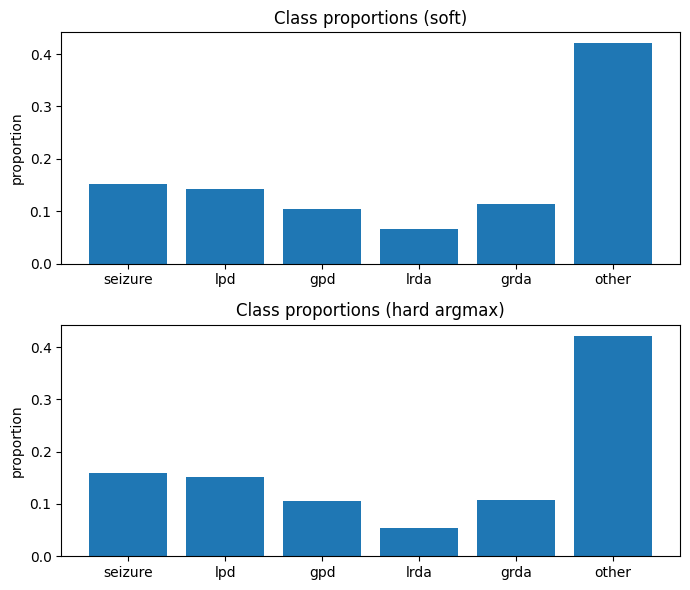

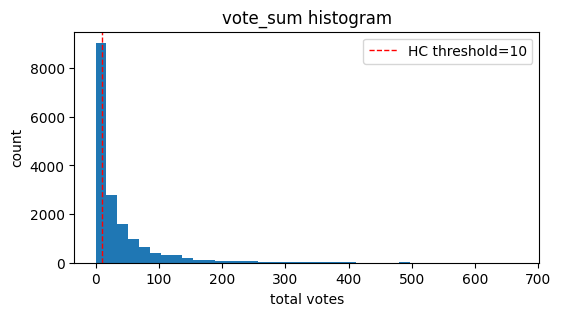

Example eeg_id: 307761414


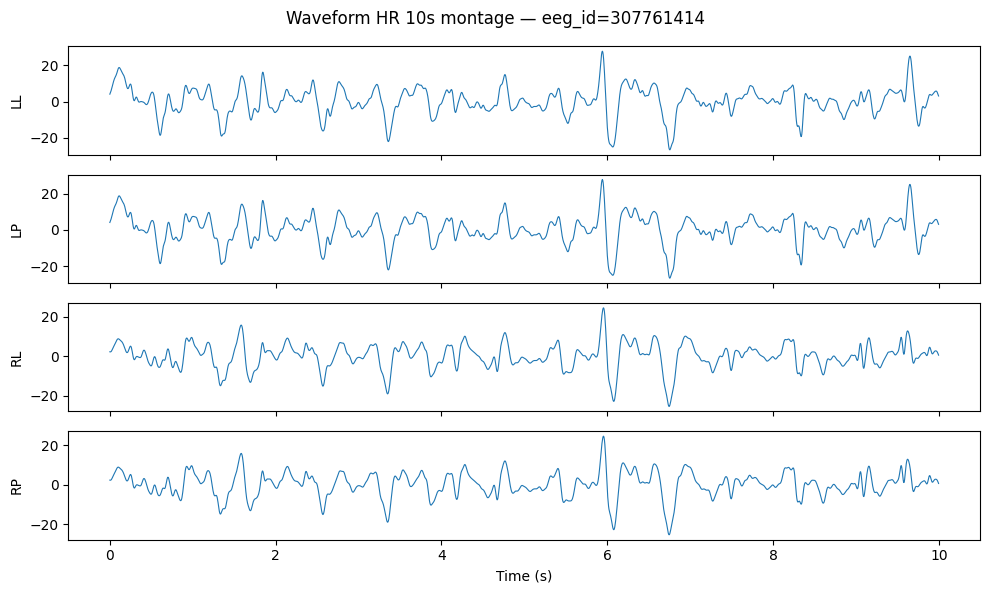

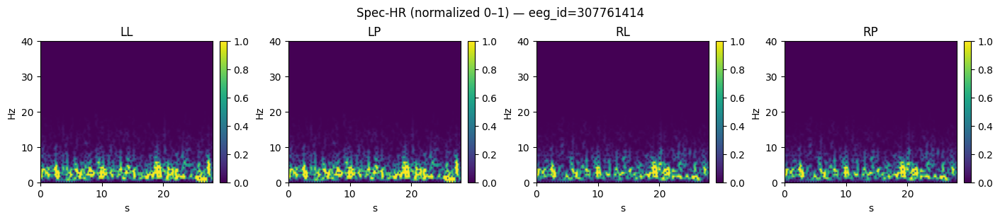

{'checked': 300, 'spec': {'min': 0.0, 'max': 1.0, 'naninf_files': 0}, 'wave': {'min': -125.00000762939453, 'max': 125.0, 'naninf_files': 16}}
Example eeg_id per class: {'seizure': 3478661615, 'lpd': 3442694989, 'gpd': 3815008054, 'lrda': 2155602827, 'grda': 3902901644, 'other': 1799920020}


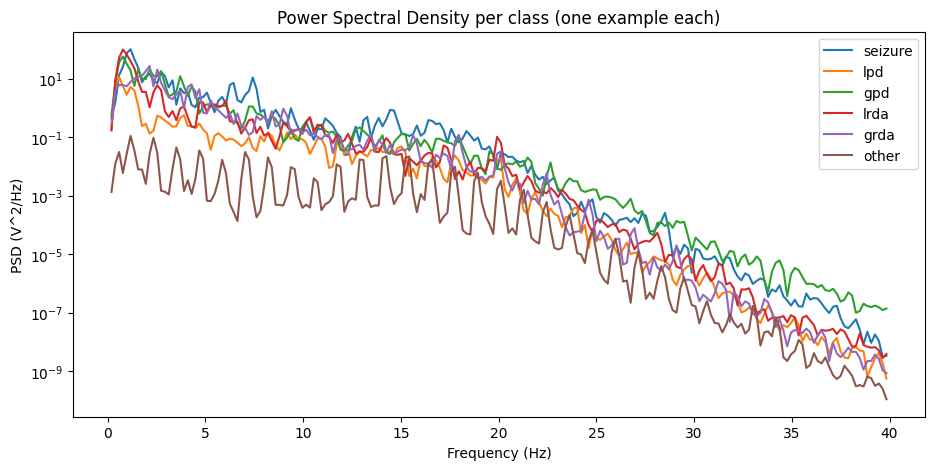

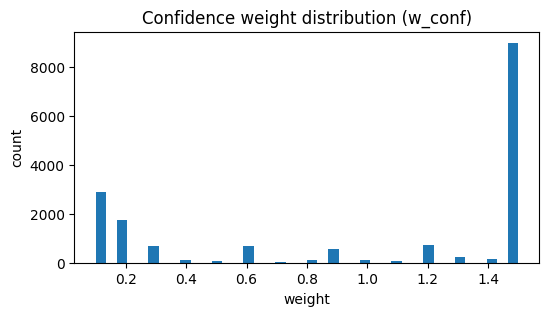

High-confidence (>=10 votes) count: 10241 / 17089

All figures saved to: C:\Users\numpppy\Downloads\hms-harmful-brain-activity-classification\example_figures


In [28]:
# ============================
# HMS Data-Centric: slide-ready visualizations
# ============================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random, math, warnings

# ---------- paths ----------
DATA_PKG = Path("data_package")          # contains meta_use.csv, labels.npz, splits.npz
SPEC_DIR = Path("spec_hr_out")           # normalized spectrograms: {eeg_id}_hr.npz -> keys: x,freqs,eeg_id,patient_id
WAVE_DIR = Path("wave_hr_out")           # 10s waveform montage: {eeg_id}_hr.npz -> keys: x,fs,eeg_id,patient_id
FIG_DIR  = Path("example_figures"); FIG_DIR.mkdir(exist_ok=True)

# ---------- load manifest & labels ----------
meta_use = pd.read_csv(DATA_PKG/"meta_use.csv")
lbl = np.load(DATA_PKG/"labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]                  # (N,6)
w_conf  = lbl["w_conf"]                  # (N,)
hc_mask = lbl["hc_mask"]                 # (N,)
CLASSES = [str(c) for c in lbl["classes"]]
vote_sum = lbl["vote_sum"] if "vote_sum" in lbl.files else None

print(f"Loaded: meta={meta_use.shape}, y_soft={y_soft.shape}, HC={int(hc_mask.sum())}")
print("Classes:", CLASSES)

# =========================================================
# 1) LABELS — class proportions (soft & hard) + vote_sum
# =========================================================
def plot_label_distributions(y_soft, classes, vote_sum=None, savepath=None):
    priors = y_soft.sum(axis=0) / y_soft.sum()
    hard   = np.argmax(y_soft, axis=1)
    hard_prop = np.bincount(hard, minlength=len(classes)) / len(hard)

    fig, axes = plt.subplots(2, 1, figsize=(7,6))
    axes[0].bar(classes, priors)
    axes[0].set_title("Class proportions (soft)")
    axes[0].set_ylabel("proportion")

    axes[1].bar(classes, hard_prop)
    axes[1].set_title("Class proportions (hard argmax)")
    axes[1].set_ylabel("proportion")
    plt.tight_layout()
    if savepath: plt.savefig(savepath, dpi=160)
    plt.show()

    if vote_sum is not None:
        plt.figure(figsize=(6,3))
        bins = np.linspace(0, np.percentile(vote_sum, 99.5), 40)
        plt.hist(vote_sum, bins=bins)
        plt.axvline(10, color='r', ls='--', lw=1, label='HC threshold=10')
        plt.title("vote_sum histogram")
        plt.xlabel("total votes"); plt.ylabel("count"); plt.legend()
        if savepath:
            sv = Path(str(savepath).replace(".png","_vote_sum.png"))
            plt.savefig(sv, dpi=160)
        plt.show()

plot_label_distributions(y_soft, CLASSES, vote_sum, FIG_DIR/"labels_distribution.png")

# =========================================================
# 2) PICK ONE EXAMPLE that has BOTH spec & wave (if available)
# =========================================================
def pick_example_with_both(meta_df):
    ids = list(meta_df["eeg_id"].astype(int))
    random.shuffle(ids)
    for eid in ids:
        if (SPEC_DIR/f"{eid}_hr.npz").exists() and (WAVE_DIR/f"{eid}_hr.npz").exists():
            return eid
    # fallback: just spec
    for eid in ids:
        if (SPEC_DIR/f"{eid}_hr.npz").exists():
            return eid
    return None

eg_id = pick_example_with_both(meta_use)
print("Example eeg_id:", eg_id)

# =========================================================
# 3) WAVEFORM montage (LL/LP/RL/RP, 10s) — from wave_hr_out
# =========================================================
def plot_waveform_montage(eeg_id, savepath=None):
    path = WAVE_DIR/f"{int(eeg_id)}_hr.npz"
    if not path.exists():
        print("wave_hr_out sample not found, skip waveform plot.")
        return
    z = np.load(path)
    x, fs = z["x"], int(z["fs"])            # x: [4, T] already filtered & clipped
    chains = ["LL","LP","RL","RP"]
    t = np.arange(x.shape[1]) / fs

    fig, axes = plt.subplots(4,1, figsize=(10,6), sharex=True)
    for i,ch in enumerate(chains):
        axes[i].plot(t, x[i], lw=0.8)
        axes[i].set_ylabel(ch)
    axes[-1].set_xlabel("Time (s)")
    fig.suptitle(f"Waveform HR 10s montage — eeg_id={eeg_id}")
    plt.tight_layout()
    if savepath: plt.savefig(savepath, dpi=160)
    plt.show()

plot_waveform_montage(eg_id, FIG_DIR/"waveform_montage.png")

# =========================================================
# 4) SPECTROGRAM 4-panel (LL/LP/RL/RP) — from spec_hr_out
# =========================================================
def plot_spec_4panel(eeg_id, savepath=None, fs=200, stride=16):
    path = SPEC_DIR/f"{int(eeg_id)}_hr.npz"
    if not path.exists():
        print("spec_hr_out sample not found, skip spectrogram plot.")
        return
    z = np.load(path)
    xs, freqs = z["x"], z["freqs"]         # xs: [4, F, T] in 0..1
    chains = ["LL","LP","RL","RP"]
    t = np.arange(xs.shape[2]) * (stride/fs)

    fig, axes = plt.subplots(1,4, figsize=(14,3), constrained_layout=True)
    for i,ch in enumerate(chains):
        im = axes[i].imshow(xs[i], aspect="auto", origin="lower",
                            extent=[t[0], t[-1], float(freqs[0]), float(freqs[-1])])
        axes[i].set_title(ch); axes[i].set_xlabel("s"); axes[i].set_ylabel("Hz")
        fig.colorbar(im, ax=axes[i], fraction=0.046, pad=0.04)
    fig.suptitle(f"Spec-HR (normalized 0–1) — eeg_id={eeg_id}")
    if savepath: plt.savefig(savepath, dpi=160)
    plt.show()

plot_spec_4panel(eg_id, FIG_DIR/"spec_4panel.png")

# =========================================================
# 5) QUICK QC (subset): check min/max & NaN/Inf
# =========================================================
def quick_qc(sample_ids, max_check=300):
    ids = [int(i) for i in sample_ids]
    random.shuffle(ids)
    ids = ids[:max_check]

    spec_min = +np.inf; spec_max = -np.inf
    spec_bad = 0
    for eid in ids:
        p = SPEC_DIR/f"{eid}_hr.npz"
        if p.exists():
            z = np.load(p)
            x = z["x"]
            if not np.isfinite(x).all():
                spec_bad += 1
            else:
                spec_min = min(spec_min, float(x.min()))
                spec_max = max(spec_max, float(x.max()))

    wave_min = +np.inf; wave_max = -np.inf
    wave_bad = 0
    for eid in ids:
        p = WAVE_DIR/f"{eid}_hr.npz"
        if p.exists():
            z = np.load(p)
            x = z["x"]
            if not np.isfinite(x).all():
                wave_bad += 1
            else:
                wave_min = min(wave_min, float(np.nanmin(x)))
                wave_max = max(wave_max, float(np.nanmax(x)))

    print({
        "checked": len(ids),
        "spec": {"min": None if spec_min==+np.inf else spec_min,
                 "max": None if spec_max==-np.inf else spec_max,
                 "naninf_files": spec_bad},
        "wave": {"min": None if wave_min==+np.inf else wave_min,
                 "max": None if wave_max==-np.inf else wave_max,
                 "naninf_files": wave_bad},
    })

quick_qc(meta_use["eeg_id"].values, max_check=300)

# =========================================================
# 6) PSD per class (from 10s waveform windows)
# =========================================================
def pick_one_per_class(meta_df, y_soft, classes, prefer_wave=True):
    """Return {class: eeg_id} where each id has wave file if prefer_wave."""
    idx_by_cls = {c: [] for c in classes}
    hard = np.argmax(y_soft, axis=1)
    for i, cidx in enumerate(hard):
        idx_by_cls[classes[cidx]].append(int(meta_df.iloc[i].eeg_id))

    chosen = {}
    for c in classes:
        random.shuffle(idx_by_cls[c])
        for eid in idx_by_cls[c]:
            if not prefer_wave or (WAVE_DIR/f"{eid}_hr.npz").exists():
                chosen[c] = eid; break
    return chosen

def plot_psd_per_class(chosen_map, fmax=40.0, savepath=None):
    try:
        from scipy.signal import welch
    except Exception as e:
        print("Install scipy for PSD (pip install scipy). Skipping PSD plot.")
        return

    plt.figure(figsize=(11,5))
    for c, eid in chosen_map.items():
        z = np.load(WAVE_DIR/f"{int(eid)}_hr.npz")
        x, fs = z["x"], int(z["fs"])      # [4, T]
        # average PSD across 4 chains
        psds = []
        for i in range(x.shape[0]):
            f, Pxx = welch(x[i], fs=fs, nperseg=min(1024, x.shape[1]))
            mask = (f>0) & (f<=fmax)
            psds.append(Pxx[mask])
        fmask = f[mask]
        mean_psd = np.mean(psds, axis=0) + 1e-12
        plt.semilogy(fmask, mean_psd, label=c)
    plt.xlabel("Frequency (Hz)"); plt.ylabel("PSD (V^2/Hz)")
    plt.title("Power Spectral Density per class (one example each)")
    plt.legend()
    if savepath: plt.savefig(savepath, dpi=160)
    plt.show()

chosen = pick_one_per_class(meta_use, y_soft, CLASSES, prefer_wave=True)
print("Example eeg_id per class:", chosen)
if len(chosen)>0:
    plot_psd_per_class(chosen, savepath=FIG_DIR/"psd_per_class.png")

# =========================================================
# 7) Confidence weight & HC summary
# =========================================================
def plot_confidence_and_hc(w_conf, hc_mask, savepath=None):
    plt.figure(figsize=(6,3))
    plt.hist(w_conf, bins=40)
    plt.title("Confidence weight distribution (w_conf)")
    plt.xlabel("weight"); plt.ylabel("count")
    if savepath: plt.savefig(Path(str(savepath).replace(".png","_wconf.png")), dpi=160)
    plt.show()
    print(f"High-confidence (>=10 votes) count: {int(hc_mask.sum())} / {len(hc_mask)}")

plot_confidence_and_hc(w_conf, hc_mask, FIG_DIR/"confidence.png")

print("\nAll figures saved to:", FIG_DIR.resolve())


#### Another explorations

In [29]:
from pathlib import Path
import numpy as np, pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import IsolationForest
from sklearn.metrics import silhouette_score

BASE = Path(".")
SPEC_DIR = BASE/"spec_hr_out"
PKG = BASE/"data_package"
PLOTS = BASE/"plots"; PLOTS.mkdir(exist_ok=True)

# meta & labels
meta_use = pd.read_csv(PKG/"meta_use.csv")
lbl = np.load(PKG/"labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]          # (N,6)
classes = [str(c) for c in lbl["classes"]]
hard    = y_soft.argmax(1)
meta_use["hard"] = hard
meta_use["eeg_id"] = meta_use["eeg_id"].astype(int)

print(meta_use.shape, classes)


(17089, 4) ['seizure', 'lpd', 'gpd', 'lrda', 'grda', 'other']


In [30]:
# definisi pita frekuensi (Hz)
BANDS = {"delta":(1,4), "theta":(4,8), "alpha":(8,13), "beta":(13,30), "gamma":(30,40)}
CHAINS = ["LL","LP","RL","RP"]  # urutan kanal di npz sudah [LL,LP,RL,RP]

def load_spec(eeg_id, kind="hr"):
    z = np.load(SPEC_DIR/f"{int(eeg_id)}_{kind}.npz")
    X = z["x"]        # (4, F, T) in [0..1]
    freqs = z["freqs"]  # (F,)
    return X, freqs

def band_mask(freqs, lo, hi):
    return (freqs>=lo) & (freqs<hi)

def extract_features_one(eeg_id):
    X, freqs = load_spec(eeg_id, "hr")          # X: [4,F,T]
    F, T = X.shape[1], X.shape[2]

    # pakai "energi rata-rata per band": mean over time, lalu sum/mean over freq band
    feats = []
    for c in range(4):
        S = X[c]  # (F,T), sudah 0–1 (boleh kuadratkan kalau mau “power” beneran)
        S2 = S**2
        # centroid (berat rata2 frekuensi, pakai mean over time)
        p = S2.mean(axis=1) + 1e-12
        centroid = float((p*freqs).sum()/p.sum())
        feats.append(centroid)
        # band-powers
        for (lo,hi) in BANDS.values():
            m = band_mask(freqs, lo, hi)
            bp = float(S2[m].mean())   # rata-rata power di band
            feats.append(bp)
    # urutan fitur per kanal: [centroid, δ,θ,α,β,γ] × 4 → 6*4=24
    return np.array(feats, dtype="float32")

# ekstrak semua sampel (progress bar)
features = np.zeros((len(meta_use), 24), dtype="float32")
bad = []
for i, r in tqdm(meta_use.iterrows(), total=len(meta_use)):
    try:
        features[i] = extract_features_one(r.eeg_id)
    except Exception as e:
        bad.append(int(r.eeg_id))
        features[i] = np.nan

print("features:", features.shape, "bad:", len(bad))
# bersihkan NaN jika ada (drop baris yang gagal)
valid_mask = np.isfinite(features).all(axis=1)
meta_f = meta_use[valid_mask].reset_index(drop=True)
X = features[valid_mask]
Y_soft = y_soft[valid_mask]
Y_hard = meta_f["hard"].to_numpy()


100%|██████████| 17089/17089 [10:46<00:00, 26.42it/s]

features: (17089, 24) bad: 0


In [35]:
import sklearn
print(sklearn.__version__)


1.7.2


meta: (17089, 4) | y_soft: (17089, 6) | classes: ['seizure', 'lpd', 'gpd', 'lrda', 'grda', 'other']


Extract spec features: 100%|██████████| 17089/17089 [00:27<00:00, 611.22it/s]


features: (17089, 24) | dropped: 0 bad spec
[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.000s...
[t-SNE] Computed neighbors for 5000 samples in 10.108s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.090935
[t-SNE] KL divergence after 1200 iterations: 1.271837
saved -> plots\embeddings.npz
saved -> plots\pca2.png


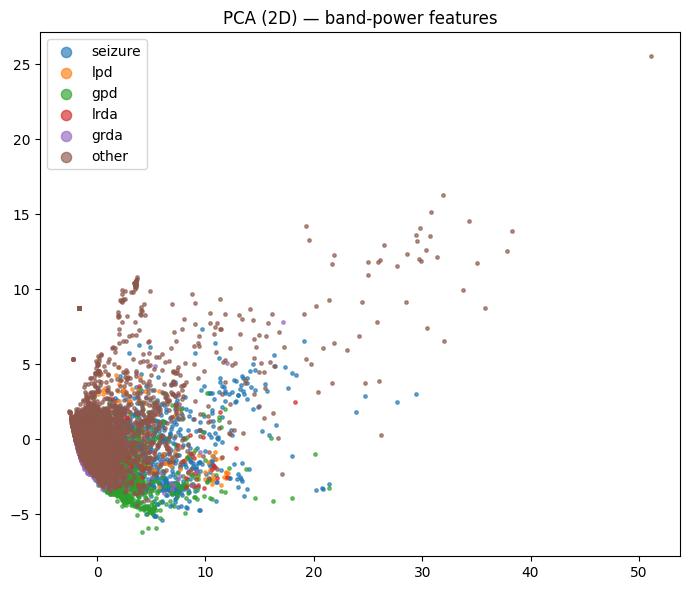

saved -> plots\tsne2.png


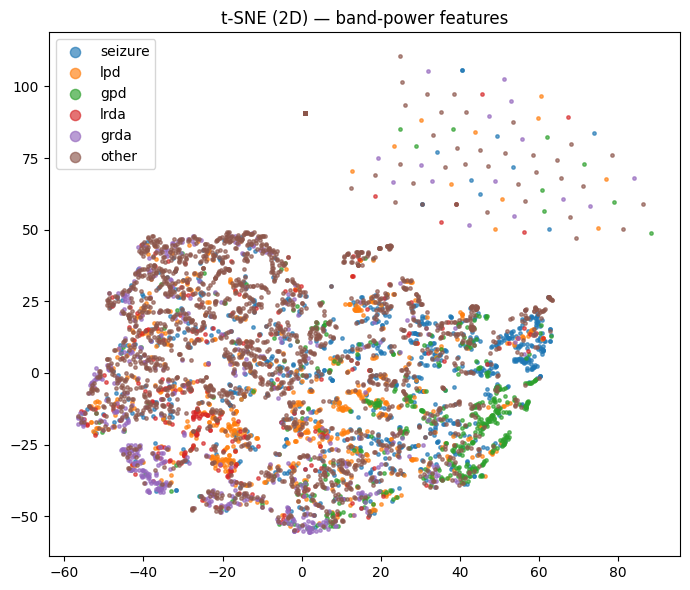

Silhouette (PCA-10D vs hard labels): -0.131
saved -> plots\band_summary_per_class.png


<Figure size 850x450 with 0 Axes>

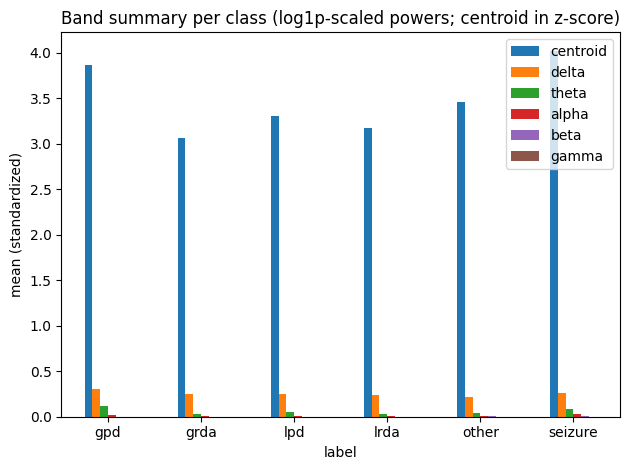


Top-8 potential outliers:
    eeg_id  patient_id  hard  outlier_score
1376378385       18506     5       0.788245
  27286272       58087     5       0.782166
3413600978       31343     5       0.778101
2261591873       18506     5       0.770953
 582215949       31343     5       0.768044
1255709671       31343     5       0.766784
1512426591       13252     5       0.766431
1361068046       61561     5       0.765505
saved -> plots\outliers_top8.csv


In [37]:
# ================================
# HMS Data-Centric: Embedding & EDA (slide-ready)
# ================================
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.ensemble import IsolationForest
from sklearn.metrics import silhouette_score

# ---------------- Paths & IO helpers ----------------
BASE = Path(".")
SPEC_DIR = BASE/"spec_hr_out"
PKG = BASE/"data_package"
PLOTS = BASE/"plots"; PLOTS.mkdir(exist_ok=True)

def save_plot(name, dpi=220):
    path = PLOTS/name
    plt.savefig(path, dpi=dpi, bbox_inches="tight")
    print("saved ->", path)

# ---------------- Load meta & labels ----------------
meta_use = pd.read_csv(PKG/"meta_use.csv")
lbl = np.load(PKG/"labels.npz", allow_pickle=True)
y_soft  = lbl["y_soft"]                    # (N,6)
classes = [str(c) for c in lbl["classes"]]
hard    = y_soft.argmax(1)

meta_use = meta_use.copy()
meta_use["eeg_id"] = meta_use["eeg_id"].astype(int)
meta_use["hard"]   = hard

print("meta:", meta_use.shape, "| y_soft:", y_soft.shape, "| classes:", classes)

# ---------------- Feature extraction from spec ----------------
# We use 4 montage channels: [LL, LP, RL, RP] already in NPZ
# Features per channel: [spectral centroid, delta, theta, alpha, beta, gamma] -> 6
# Total features: 4 * 6 = 24
BANDS = {"delta":(1,4), "theta":(4,8), "alpha":(8,13), "beta":(13,30), "gamma":(30,40)}

def load_spec(eeg_id, kind="hr"):
    z = np.load(SPEC_DIR/f"{int(eeg_id)}_{kind}.npz")
    return z["x"], z["freqs"]   # x:[4,F,T] in [0..1], freqs:[F]

def band_mask(freqs, lo, hi):
    return (freqs >= lo) & (freqs < hi)

def extract_features_one(eeg_id):
    X, freqs = load_spec(eeg_id, "hr")      # X: [4,F,T]
    feats = []
    for c in range(4):
        S  = X[c]                  # (F,T) normalized
        S2 = S**2                  # energy-like
        # spectral centroid (mean over time first)
        p = S2.mean(axis=1) + 1e-12
        centroid = float((p*freqs).sum()/p.sum())
        feats.append(centroid)
        # band powers (mean energy in band)
        for (lo,hi) in BANDS.values():
            m = band_mask(freqs, lo, hi)
            bp = float(S2[m].mean()) if m.any() else 0.0
            feats.append(bp)
    return np.array(feats, dtype="float32")   # 24-dim

features = np.zeros((len(meta_use), 24), dtype="float32")
bad_ids = []
for i, r in tqdm(meta_use.iterrows(), total=len(meta_use), desc="Extract spec features"):
    try:
        features[i] = extract_features_one(r.eeg_id)
    except Exception:
        features[i] = np.nan
        bad_ids.append(int(r.eeg_id))

valid = np.isfinite(features).all(axis=1)
X = features[valid]
Y_hard = meta_use.loc[valid, "hard"].to_numpy()
meta_f = meta_use.loc[valid].reset_index(drop=True)
print(f"features: {X.shape} | dropped: {len(bad_ids)} bad spec")

# ---------------- Light standardization ----------------
# Log-transform band-powers only (skip centroid columns: 0,6,12,18)
cent_idx = [0,6,12,18]
X_log = X.copy()
mask_cols = np.ones(X.shape[1], dtype=bool)
mask_cols[cent_idx] = False
X_log[:, mask_cols] = np.log1p(np.maximum(X_log[:, mask_cols], 0.0))

mu = X_log.mean(axis=0, keepdims=True)
sd = X_log.std(axis=0, keepdims=True) + 1e-8
Xz = (X_log - mu)/sd

# ---------------- PCA (2D) ----------------
pca2 = PCA(n_components=2, random_state=42).fit_transform(Xz)

# ---------------- t-SNE (2D) with max_iter (sklearn 1.7.2) ----------------
def tsne_2d(X_in, perplexity=35, iters=1200, seed=42, verbose=1):
    return TSNE(
        n_components=2,
        perplexity=perplexity,
        learning_rate="auto",
        init="pca",
        random_state=seed,
        verbose=verbose,
        max_iter=iters
    ).fit_transform(X_in)

# optional subsample to speed up t-SNE
N = Xz.shape[0]
max_tsne = 5000
if N > max_tsne:
    rng = np.random.default_rng(42)
    idx_tsne = rng.choice(N, size=max_tsne, replace=False)
else:
    idx_tsne = np.arange(N)

Xz_tsne = Xz[idx_tsne]
Y_tsne  = Y_hard[idx_tsne]
tsne2   = tsne_2d(Xz_tsne, perplexity=35, iters=1200, seed=42, verbose=1)

# ---------------- Save embeddings ----------------
np.savez(
    PLOTS/"embeddings.npz",
    pca2=pca2,
    tsne2=tsne2,
    idx_tsne=idx_tsne,
    y_all=Y_hard,
    y_tsne=Y_tsne,
    classes=np.array(classes, dtype=object)
)
print("saved ->", PLOTS/"embeddings.npz")

# ---------------- Plotting helpers ----------------
def scatter2(Z, y, title, fname):
    plt.figure(figsize=(7,6))
    for k, cname in enumerate(classes):
        m = (y == k)
        if Z.shape[0] >= m.sum() and m.sum() > 0:
            plt.scatter(Z[m,0], Z[m,1], s=6, alpha=0.65, label=cname)
    plt.legend(markerscale=3)
    plt.title(title)
    plt.tight_layout()
    save_plot(fname)
    plt.show()

# PCA plot
scatter2(pca2, Y_hard, "PCA (2D) — band-power features", "pca2.png")
# t-SNE plot
scatter2(tsne2, Y_tsne, "t-SNE (2D) — band-power features", "tsne2.png")

# ---------------- Clustering quality (quick) ----------------
pca10 = PCA(n_components=10, random_state=42).fit_transform(Xz)
sil = silhouette_score(pca10, Y_hard)
print("Silhouette (PCA-10D vs hard labels):", round(sil, 3))

# ---------------- Per-class band summary (great for slides) ----------------
# Build a tidy DataFrame: columns = [LL_, LP_, RL_, RP_] × [centroid, delta..gamma] = 24
band_names = ["centroid","delta","theta","alpha","beta","gamma"]
col_names  = [f"{ch}_{bn}" for ch in ["LL","LP","RL","RP"] for bn in band_names]
df_feat = pd.DataFrame(X_log, columns=col_names)
df_feat["label"] = [classes[i] for i in Y_hard]

mean_per_class = df_feat.groupby("label").mean()   # 6 x 24
# Aggregate bands across channels (mean)
agg = {}
for bn in band_names:
    cols = [c for c in col_names if c.endswith(f"_{bn}")]
    agg[bn] = mean_per_class[cols].mean(axis=1)
band_summary = pd.DataFrame(agg)[band_names]       # 6 x 6 (order kept)

plt.figure(figsize=(8.5,4.5))
band_summary.plot(kind="bar")
plt.title("Band summary per class (log1p-scaled powers; centroid in z-score)")
plt.ylabel("mean (standardized)")
plt.xticks(rotation=0)
plt.tight_layout()
save_plot("band_summary_per_class.png")
plt.show()

# ---------------- Outlier scan (optional but useful) ----------------
iso = IsolationForest(n_estimators=300, contamination=0.02, random_state=42)
iso.fit(pca10)
out_score = -iso.score_samples(pca10)  # higher => more outlier
meta_f["outlier_score"] = out_score

top8 = meta_f.sort_values("outlier_score", ascending=False).head(8)
print("\nTop-8 potential outliers:")
print(top8[["eeg_id","patient_id","hard","outlier_score"]].to_string(index=False))

# Also save CSV for inspection
top8.to_csv(PLOTS/"outliers_top8.csv", index=False)
print("saved ->", PLOTS/"outliers_top8.csv")
